In [17]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import os
from ctapipe.io.lsteventsource import LSTEventSource
from ctapipe.io import EventSeeker
from ctapipe.calib.camera import DragonPedestal
from ctapipe.calib.camera.dragon import remove_pedestal
font = {'family' : 'sans-serif',
        'style':'normal',
        'weight' : 'medium',
        'size'   : 30}
matplotlib.rc('font', **font)
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams['figure.figsize'] = (14, 8)

In [88]:
def get_rms_of_module(path_to_data, nr_module):
    reader = LSTEventSource(input_url=path_to_data)
    seeker = EventSeeker(reader)
    high_gain = 0
    low_gain = 1
    ped = DragonPedestal()
    for i in range(0, 5500):
        ev = seeker[i]
        ped.fill_pedestal_event(ev, nr_module)
    ped.finalize_pedestal()
    print("Module: {}".format(nr_module))
    for gain in [high_gain, low_gain]:
        for pix in range(0, 7):
            if gain == high_gain:
                print("High gain: pixel = {} mean RMS = {}".format(pix, np.mean(ped.rms[high_gain, pix, :])))
            if gain == low_gain:
                print("Low gain: pixel = {} mean RMS = {}".format(pix, np.mean(ped.rms[low_gain, pix, :])))
    return ped.rms

def plot_box(nr):
    rms_hg = [rms_array[nr, 0, 0, :], rms_array[nr, 0, 1, :], rms_array[nr, 0, 2, :], rms_array[nr, 0, 3, :],
                rms_array[nr, 0, 4, :], rms_array[nr, 0, 5, :], rms_array[nr, 0, 6, :]]
    rms_lg = [rms_array[nr, 1, 0, :], rms_array[nr, 1, 1, :], rms_array[nr, 1, 2, :], rms_array[nr, 1, 3, :],
                   rms_array[nr, 1, 4, :], rms_array[nr, 1, 5, :], rms_array[nr, 1, 6, :]]

    fig, ax = plt.subplots(1, 2)
    bp = ax[0].boxplot(rms_hg, vert=0)
    ax[0].set_title("Module = {} high gain".format(nr))
    ax[0].set_xlabel("RMS")
    ax[0].set_xlim([0, 200])
    ax[0].set_yticklabels(['pixel 0', 'pixel 1', 'pixel 2', 'pixel 3', 'pixel 4', 'pixel 5', 'pixel 6'])

    bp = ax[1].boxplot(rms_lg, vert=0)
    ax[1].set_title("Module = {} low gain".format(nr))
    ax[1].set_xlabel("RMS")
    ax[1].set_xlim([0, 200])
    ax[1].set_yticklabels(['pixel 0', 'pixel 1', 'pixel 2', 'pixel 3', 'pixel 4', 'pixel 5', 'pixel 6'])
    plt.subplots_adjust(wspace=0.3)
    plt.show()

In [90]:
path_to_data = os.path.join("/home", "pawel1", "Pulpit", "Astrophysics", "CTA", "dragon",
                            "data", "dane_lst", "20180629", "Date20180629.0000.fits.fz")
reader = LSTEventSource(input_url=path_to_data)
seeker = EventSeeker(reader)
ev = seeker[0]
num_modules = ev.lst.tel[0].svc.num_modules
NR = num_modules
rms_array = np.zeros((NR, 2, 7, 4096))


for nr in range(0, NR):
    rms_array[nr, :, :, :] = get_rms_of_module(path_to_data, nr)


/home/pawel1/anaconda3/envs/cta-dev/lib/python3.6/site-packages/protozfits/__init__.py:56: UserWarning:         Multiple open zfits files at the same time are not supported.
        Reading from mutliple open tables at the same time will reset these
        tables continously and you will read always the same events.
        
  ''')


Module: 0
High gain: pixel = 0 mean RMS = 10.1037052424768
High gain: pixel = 1 mean RMS = 11.183306378001665
High gain: pixel = 2 mean RMS = 16.522617510716223
High gain: pixel = 3 mean RMS = 20.272201970452116
High gain: pixel = 4 mean RMS = 18.441664026050276
High gain: pixel = 5 mean RMS = 20.54125352633428
High gain: pixel = 6 mean RMS = 16.487719268201126
Low gain: pixel = 0 mean RMS = 14.430799090484042
Low gain: pixel = 1 mean RMS = 17.138919134572184
Low gain: pixel = 2 mean RMS = 13.652468129452636
Low gain: pixel = 3 mean RMS = 16.590479991207694
Low gain: pixel = 4 mean RMS = 14.39005927145787
Low gain: pixel = 5 mean RMS = 17.414820236767326
Low gain: pixel = 6 mean RMS = 4.972732910313645


Module: 1
High gain: pixel = 0 mean RMS = 8.767236401038101
High gain: pixel = 1 mean RMS = 9.194491565273077
High gain: pixel = 2 mean RMS = 15.67879926517754
High gain: pixel = 3 mean RMS = 17.083333980863284
High gain: pixel = 4 mean RMS = 15.445116497583726
High gain: pixel = 5 mean RMS = 16.26065882564363
High gain: pixel = 6 mean RMS = 17.1685720261471
Low gain: pixel = 0 mean RMS = 11.751425850450936
Low gain: pixel = 1 mean RMS = 12.957217900533488
Low gain: pixel = 2 mean RMS = 13.948618945533475
Low gain: pixel = 3 mean RMS = 14.443685181039566
Low gain: pixel = 4 mean RMS = 14.164278316346689
Low gain: pixel = 5 mean RMS = 14.691319756957594
Low gain: pixel = 6 mean RMS = 3.623848892603937


Module: 2
High gain: pixel = 0 mean RMS = 8.168815307218814
High gain: pixel = 1 mean RMS = 8.901937182249924
High gain: pixel = 2 mean RMS = 14.462804201287824
High gain: pixel = 3 mean RMS = 15.934435913512226
High gain: pixel = 4 mean RMS = 15.306051003055536
High gain: pixel = 5 mean RMS = 16.357346411023258
High gain: pixel = 6 mean RMS = 15.073935288737152
Low gain: pixel = 0 mean RMS = 11.610115557877563
Low gain: pixel = 1 mean RMS = 12.48748970587852
Low gain: pixel = 2 mean RMS = 12.85037114172413
Low gain: pixel = 3 mean RMS = 13.549471891818882
Low gain: pixel = 4 mean RMS = 12.295692640283283
Low gain: pixel = 5 mean RMS = 13.681467012686069
Low gain: pixel = 6 mean RMS = 3.5867038955629496


Module: 3
High gain: pixel = 0 mean RMS = 9.473144629880546
High gain: pixel = 1 mean RMS = 10.817161598872865
High gain: pixel = 2 mean RMS = 16.182562622956063
High gain: pixel = 3 mean RMS = 19.75275706456059
High gain: pixel = 4 mean RMS = 19.124109383308834
High gain: pixel = 5 mean RMS = 20.825303671713076
High gain: pixel = 6 mean RMS = 16.20668445152115
Low gain: pixel = 0 mean RMS = 13.047789080902511
Low gain: pixel = 1 mean RMS = 16.162729847724293
Low gain: pixel = 2 mean RMS = 13.599500847813747
Low gain: pixel = 3 mean RMS = 16.314396295892728
Low gain: pixel = 4 mean RMS = 14.739024330238106
Low gain: pixel = 5 mean RMS = 17.085851664286793
Low gain: pixel = 6 mean RMS = 4.635749108804349


Module: 4
High gain: pixel = 0 mean RMS = 9.273360785380133
High gain: pixel = 1 mean RMS = 10.260983875826867
High gain: pixel = 2 mean RMS = 17.15456586951431
High gain: pixel = 3 mean RMS = 20.12630646587401
High gain: pixel = 4 mean RMS = 17.69958173824238
High gain: pixel = 5 mean RMS = 19.28053580490458
High gain: pixel = 6 mean RMS = 15.369008024480507
Low gain: pixel = 0 mean RMS = 12.860817924805954
Low gain: pixel = 1 mean RMS = 16.533524310838946
Low gain: pixel = 2 mean RMS = 13.83620539142236
Low gain: pixel = 3 mean RMS = 16.2932616192072
Low gain: pixel = 4 mean RMS = 13.55452936801852
Low gain: pixel = 5 mean RMS = 16.32836421663484
Low gain: pixel = 6 mean RMS = 4.82898154186158


Module: 5
High gain: pixel = 0 mean RMS = 8.589626603945499
High gain: pixel = 1 mean RMS = 8.89297251841995
High gain: pixel = 2 mean RMS = 16.804797856901942
High gain: pixel = 3 mean RMS = 16.961019882449914
High gain: pixel = 4 mean RMS = 16.6473103999265
High gain: pixel = 5 mean RMS = 17.10842655524919
High gain: pixel = 6 mean RMS = 16.059853872473532
Low gain: pixel = 0 mean RMS = 14.098053807983927
Low gain: pixel = 1 mean RMS = 14.829478387171788
Low gain: pixel = 2 mean RMS = 11.99114706832529
Low gain: pixel = 3 mean RMS = 12.76777795837642
Low gain: pixel = 4 mean RMS = 12.18421288801921
Low gain: pixel = 5 mean RMS = 12.968011231088841
Low gain: pixel = 6 mean RMS = 3.5940557421542607


Module: 6
High gain: pixel = 0 mean RMS = 10.278353300098047
High gain: pixel = 1 mean RMS = 10.593867310866463
High gain: pixel = 2 mean RMS = 17.92756873136873
High gain: pixel = 3 mean RMS = 20.478424306353908
High gain: pixel = 4 mean RMS = 17.152519982281465
High gain: pixel = 5 mean RMS = 20.467882967742554
High gain: pixel = 6 mean RMS = 15.359336898732622
Low gain: pixel = 0 mean RMS = 13.977755576682684
Low gain: pixel = 1 mean RMS = 17.624001758358418
Low gain: pixel = 2 mean RMS = 14.153519228551078
Low gain: pixel = 3 mean RMS = 17.27061455661525
Low gain: pixel = 4 mean RMS = 15.358295413797759
Low gain: pixel = 5 mean RMS = 18.170393157215983
Low gain: pixel = 6 mean RMS = 5.020982158623261


Module: 7
High gain: pixel = 0 mean RMS = 9.493654695696799
High gain: pixel = 1 mean RMS = 9.460556011796182
High gain: pixel = 2 mean RMS = 15.559921253693592
High gain: pixel = 3 mean RMS = 18.794242474235325
High gain: pixel = 4 mean RMS = 16.61821025205539
High gain: pixel = 5 mean RMS = 18.07928607324331
High gain: pixel = 6 mean RMS = 16.837834676985494
Low gain: pixel = 0 mean RMS = 11.910184365557665
Low gain: pixel = 1 mean RMS = 14.386777725010067
Low gain: pixel = 2 mean RMS = 13.544456956533768
Low gain: pixel = 3 mean RMS = 15.889028368254964
Low gain: pixel = 4 mean RMS = 12.600511247759455
Low gain: pixel = 5 mean RMS = 15.856573592327159
Low gain: pixel = 6 mean RMS = 3.6358877501623956


Module: 8
High gain: pixel = 0 mean RMS = 10.302002348769285
High gain: pixel = 1 mean RMS = 10.85958862159242
High gain: pixel = 2 mean RMS = 16.20505978088458
High gain: pixel = 3 mean RMS = 19.89189363353234
High gain: pixel = 4 mean RMS = 16.699194129347774
High gain: pixel = 5 mean RMS = 18.95307848452724
High gain: pixel = 6 mean RMS = 17.726798449280864
Low gain: pixel = 0 mean RMS = 14.036436108403663
Low gain: pixel = 1 mean RMS = 16.23649802659948
Low gain: pixel = 2 mean RMS = 15.891159067310564
Low gain: pixel = 3 mean RMS = 18.185775507584935
Low gain: pixel = 4 mean RMS = 13.628663071701833
Low gain: pixel = 5 mean RMS = 16.84047791101272
Low gain: pixel = 6 mean RMS = 4.772137176575837


Module: 9
High gain: pixel = 0 mean RMS = 10.521576764442909
High gain: pixel = 1 mean RMS = 11.288082733844
High gain: pixel = 2 mean RMS = 16.964013541172918
High gain: pixel = 3 mean RMS = 21.134348517282245
High gain: pixel = 4 mean RMS = 17.567124795294255
High gain: pixel = 5 mean RMS = 21.227517550564947
High gain: pixel = 6 mean RMS = 16.73587965500146
Low gain: pixel = 0 mean RMS = 12.799901962073356
Low gain: pixel = 1 mean RMS = 16.738411821808587
Low gain: pixel = 2 mean RMS = 13.786635523467247
Low gain: pixel = 3 mean RMS = 17.641426728105223
Low gain: pixel = 4 mean RMS = 15.902682686026145
Low gain: pixel = 5 mean RMS = 19.441382289571045
Low gain: pixel = 6 mean RMS = 5.675432701020668


Module: 10
High gain: pixel = 0 mean RMS = 8.219724761429703
High gain: pixel = 1 mean RMS = 8.374283672273632
High gain: pixel = 2 mean RMS = 15.381397018562009
High gain: pixel = 3 mean RMS = 15.389671409532339
High gain: pixel = 4 mean RMS = 13.237915555897043
High gain: pixel = 5 mean RMS = 13.394021524671604
High gain: pixel = 6 mean RMS = 15.90060910319516
Low gain: pixel = 0 mean RMS = 10.926046118797116
Low gain: pixel = 1 mean RMS = 10.875535982127712
Low gain: pixel = 2 mean RMS = 12.10659265546497
Low gain: pixel = 3 mean RMS = 11.985483803018532
Low gain: pixel = 4 mean RMS = 10.97454300907338
Low gain: pixel = 5 mean RMS = 11.016861165616962
Low gain: pixel = 6 mean RMS = 3.515172107420274


Module: 11
High gain: pixel = 0 mean RMS = 8.699911873839621
High gain: pixel = 1 mean RMS = 9.119733744847693
High gain: pixel = 2 mean RMS = 15.7222499744539
High gain: pixel = 3 mean RMS = 18.490566285326373
High gain: pixel = 4 mean RMS = 15.753093868572531
High gain: pixel = 5 mean RMS = 16.387293473447738
High gain: pixel = 6 mean RMS = 17.456583386777076
Low gain: pixel = 0 mean RMS = 15.431897179534449
Low gain: pixel = 1 mean RMS = 16.21159610574729
Low gain: pixel = 2 mean RMS = 13.451548916849635
Low gain: pixel = 3 mean RMS = 15.826611739784488
Low gain: pixel = 4 mean RMS = 12.605214983008027
Low gain: pixel = 5 mean RMS = 14.78508023131294
Low gain: pixel = 6 mean RMS = 3.7175997574137503


Module: 12
High gain: pixel = 0 mean RMS = 9.0592267130882
High gain: pixel = 1 mean RMS = 9.508432775260111
High gain: pixel = 2 mean RMS = 17.41271395072824
High gain: pixel = 3 mean RMS = 18.581781290996144
High gain: pixel = 4 mean RMS = 16.57815393120202
High gain: pixel = 5 mean RMS = 18.0439351345996
High gain: pixel = 6 mean RMS = 17.374660177654828
Low gain: pixel = 0 mean RMS = 14.241601792118814
Low gain: pixel = 1 mean RMS = 16.534094806508598
Low gain: pixel = 2 mean RMS = 13.657039109222557
Low gain: pixel = 3 mean RMS = 14.72723591662028
Low gain: pixel = 4 mean RMS = 13.282489513304327
Low gain: pixel = 5 mean RMS = 15.002606084880423
Low gain: pixel = 6 mean RMS = 3.819988023909672


Module: 13
High gain: pixel = 0 mean RMS = 9.167109335323502
High gain: pixel = 1 mean RMS = 9.78108934692987
High gain: pixel = 2 mean RMS = 18.442347523894448
High gain: pixel = 3 mean RMS = 18.967856994864913
High gain: pixel = 4 mean RMS = 16.47648838433451
High gain: pixel = 5 mean RMS = 17.847848661208566
High gain: pixel = 6 mean RMS = 16.32240442616125
Low gain: pixel = 0 mean RMS = 13.3622466288014
Low gain: pixel = 1 mean RMS = 15.977297338743151
Low gain: pixel = 2 mean RMS = 14.461830056269584
Low gain: pixel = 3 mean RMS = 15.847251027503761
Low gain: pixel = 4 mean RMS = 13.211577371835784
Low gain: pixel = 5 mean RMS = 16.36449578679055
Low gain: pixel = 6 mean RMS = 3.6521628417859735


Module: 14
High gain: pixel = 0 mean RMS = 8.829994360145434
High gain: pixel = 1 mean RMS = 9.076950281746171
High gain: pixel = 2 mean RMS = 15.985736246527395
High gain: pixel = 3 mean RMS = 17.578743502226295
High gain: pixel = 4 mean RMS = 16.27983665013557
High gain: pixel = 5 mean RMS = 17.214781088648344
High gain: pixel = 6 mean RMS = 15.83038462698634
Low gain: pixel = 0 mean RMS = 12.71930903860688
Low gain: pixel = 1 mean RMS = 14.419357664704448
Low gain: pixel = 2 mean RMS = 14.22764444731859
Low gain: pixel = 3 mean RMS = 15.798837298377519
Low gain: pixel = 4 mean RMS = 15.184732898385258
Low gain: pixel = 5 mean RMS = 16.405414952780188
Low gain: pixel = 6 mean RMS = 3.6567535047222632


Module: 15
High gain: pixel = 0 mean RMS = 9.98842676840925
High gain: pixel = 1 mean RMS = 10.528721622457773
High gain: pixel = 2 mean RMS = 17.619450564091135
High gain: pixel = 3 mean RMS = 20.174204823387004
High gain: pixel = 4 mean RMS = 16.06500346430657
High gain: pixel = 5 mean RMS = 18.76166833431968
High gain: pixel = 6 mean RMS = 16.807898483511103
Low gain: pixel = 0 mean RMS = 14.601776306148576
Low gain: pixel = 1 mean RMS = 17.87130143752527
Low gain: pixel = 2 mean RMS = 14.68340215460428
Low gain: pixel = 3 mean RMS = 17.037079623463445
Low gain: pixel = 4 mean RMS = 14.197710949760388
Low gain: pixel = 5 mean RMS = 16.548809357850846
Low gain: pixel = 6 mean RMS = 4.987437262881192


Module: 16
High gain: pixel = 0 mean RMS = 9.349131324694014
High gain: pixel = 1 mean RMS = 9.939870072897207
High gain: pixel = 2 mean RMS = 16.06558434433618
High gain: pixel = 3 mean RMS = 19.599564426209255
High gain: pixel = 4 mean RMS = 17.631094855985527
High gain: pixel = 5 mean RMS = 19.938178133939555
High gain: pixel = 6 mean RMS = 17.7600573446479
Low gain: pixel = 0 mean RMS = 13.079137594622877
Low gain: pixel = 1 mean RMS = 16.59647036585191
Low gain: pixel = 2 mean RMS = 14.614587013425346
Low gain: pixel = 3 mean RMS = 17.398385582315633
Low gain: pixel = 4 mean RMS = 14.714649210040127
Low gain: pixel = 5 mean RMS = 17.28137305621698
Low gain: pixel = 6 mean RMS = 3.8515404946118417


Module: 17
High gain: pixel = 0 mean RMS = 8.751246208229436
High gain: pixel = 1 mean RMS = 9.005110271371699
High gain: pixel = 2 mean RMS = 14.903385054370693
High gain: pixel = 3 mean RMS = 15.395668532413222
High gain: pixel = 4 mean RMS = 14.786972717227398
High gain: pixel = 5 mean RMS = 15.236221790834117
High gain: pixel = 6 mean RMS = 15.994070169748879
Low gain: pixel = 0 mean RMS = 12.166926963059396
Low gain: pixel = 1 mean RMS = 12.230690463043082
Low gain: pixel = 2 mean RMS = 13.486591198007247
Low gain: pixel = 3 mean RMS = 13.563277106012595
Low gain: pixel = 4 mean RMS = 15.322670143375309
Low gain: pixel = 5 mean RMS = 15.784313874325512
Low gain: pixel = 6 mean RMS = 4.002136586845621


Module: 18
High gain: pixel = 0 mean RMS = 9.300267042765618
High gain: pixel = 1 mean RMS = 9.556822521286026
High gain: pixel = 2 mean RMS = 16.225156423647192
High gain: pixel = 3 mean RMS = 17.933316692310946
High gain: pixel = 4 mean RMS = 15.421463315861395
High gain: pixel = 5 mean RMS = 16.743958789389907
High gain: pixel = 6 mean RMS = 15.337676949208753
Low gain: pixel = 0 mean RMS = 14.1073678046434
Low gain: pixel = 1 mean RMS = 15.426798901581378
Low gain: pixel = 2 mean RMS = 13.66337409553086
Low gain: pixel = 3 mean RMS = 14.410532781381194
Low gain: pixel = 4 mean RMS = 13.166291633297933
Low gain: pixel = 5 mean RMS = 15.198523471827237
Low gain: pixel = 6 mean RMS = 3.6398042886722477


Module: 19
High gain: pixel = 0 mean RMS = 8.733736602304905
High gain: pixel = 1 mean RMS = 9.204309544481424
High gain: pixel = 2 mean RMS = 15.38201492639186
High gain: pixel = 3 mean RMS = 17.864771216060884
High gain: pixel = 4 mean RMS = 16.17886785404462
High gain: pixel = 5 mean RMS = 18.248011909474577
High gain: pixel = 6 mean RMS = 15.65919324677495
Low gain: pixel = 0 mean RMS = 12.347218626293097
Low gain: pixel = 1 mean RMS = 14.687913506598555
Low gain: pixel = 2 mean RMS = 12.784954849878224
Low gain: pixel = 3 mean RMS = 14.758814338613671
Low gain: pixel = 4 mean RMS = 12.39079360715257
Low gain: pixel = 5 mean RMS = 14.561950011044171
Low gain: pixel = 6 mean RMS = 3.85189402685754


Module: 20
High gain: pixel = 0 mean RMS = 8.325072305310218
High gain: pixel = 1 mean RMS = 9.279396517007612
High gain: pixel = 2 mean RMS = 15.21524283005162
High gain: pixel = 3 mean RMS = 18.261521377240978
High gain: pixel = 4 mean RMS = 15.652719330001073
High gain: pixel = 5 mean RMS = 17.982944195788996
High gain: pixel = 6 mean RMS = 15.649769269591634
Low gain: pixel = 0 mean RMS = 12.423158279104445
Low gain: pixel = 1 mean RMS = 14.760944319988631
Low gain: pixel = 2 mean RMS = 15.57054698982414
Low gain: pixel = 3 mean RMS = 16.412328195602253
Low gain: pixel = 4 mean RMS = 13.48957555071127
Low gain: pixel = 5 mean RMS = 14.844473676482961
Low gain: pixel = 6 mean RMS = 3.562727559848278


Module: 21
High gain: pixel = 0 mean RMS = 9.205204562633671
High gain: pixel = 1 mean RMS = 9.456677884077914
High gain: pixel = 2 mean RMS = 15.847120694343687
High gain: pixel = 3 mean RMS = 18.973359926997798
High gain: pixel = 4 mean RMS = 17.33948710881368
High gain: pixel = 5 mean RMS = 18.8052801041378
High gain: pixel = 6 mean RMS = 14.42490799272079
Low gain: pixel = 0 mean RMS = 13.06731077990145
Low gain: pixel = 1 mean RMS = 15.172343869649222
Low gain: pixel = 2 mean RMS = 13.881452273527191
Low gain: pixel = 3 mean RMS = 15.483961030872203
Low gain: pixel = 4 mean RMS = 13.7243638767899
Low gain: pixel = 5 mean RMS = 16.269288179011323
Low gain: pixel = 6 mean RMS = 3.597594880828003


Module: 22
High gain: pixel = 0 mean RMS = 9.995974884343653
High gain: pixel = 1 mean RMS = 10.490054516247877
High gain: pixel = 2 mean RMS = 15.440341315930144
High gain: pixel = 3 mean RMS = 20.58729160384754
High gain: pixel = 4 mean RMS = 17.232850686356688
High gain: pixel = 5 mean RMS = 20.425923160288455
High gain: pixel = 6 mean RMS = 15.829921093335091
Low gain: pixel = 0 mean RMS = 14.528162841273447
Low gain: pixel = 1 mean RMS = 18.098923101977366
Low gain: pixel = 2 mean RMS = 17.292572814565503
Low gain: pixel = 3 mean RMS = 19.431500525748522
Low gain: pixel = 4 mean RMS = 14.07175743543227
Low gain: pixel = 5 mean RMS = 19.39276451639016
Low gain: pixel = 6 mean RMS = 4.3057245949347145


Module: 23
High gain: pixel = 0 mean RMS = 8.2861462911133
High gain: pixel = 1 mean RMS = 8.877635356041303
High gain: pixel = 2 mean RMS = 15.98173875104681
High gain: pixel = 3 mean RMS = 16.903512096766455
High gain: pixel = 4 mean RMS = 14.64827387703074
High gain: pixel = 5 mean RMS = 15.362871526792944
High gain: pixel = 6 mean RMS = 15.484122099392646
Low gain: pixel = 0 mean RMS = 11.798283462520136
Low gain: pixel = 1 mean RMS = 12.79388860606584
Low gain: pixel = 2 mean RMS = 12.872214023996822
Low gain: pixel = 3 mean RMS = 13.689128014996175
Low gain: pixel = 4 mean RMS = 12.556900385765893
Low gain: pixel = 5 mean RMS = 13.614357469439312
Low gain: pixel = 6 mean RMS = 3.9509951002622996


Module: 24
High gain: pixel = 0 mean RMS = 9.09275268886404
High gain: pixel = 1 mean RMS = 9.622867136669754
High gain: pixel = 2 mean RMS = 17.18349473163391
High gain: pixel = 3 mean RMS = 18.79905815938075
High gain: pixel = 4 mean RMS = 17.14771610041832
High gain: pixel = 5 mean RMS = 18.229735004968784
High gain: pixel = 6 mean RMS = 16.404179086109437
Low gain: pixel = 0 mean RMS = 12.957252952900642
Low gain: pixel = 1 mean RMS = 14.641810206782615
Low gain: pixel = 2 mean RMS = 14.652333216285772
Low gain: pixel = 3 mean RMS = 15.183980155597604
Low gain: pixel = 4 mean RMS = 13.179594585344386
Low gain: pixel = 5 mean RMS = 15.58965605363293
Low gain: pixel = 6 mean RMS = 3.7158248256619


Module: 25
High gain: pixel = 0 mean RMS = 8.514937704753612
High gain: pixel = 1 mean RMS = 9.79003528312584
High gain: pixel = 2 mean RMS = 16.409811981111673
High gain: pixel = 3 mean RMS = 18.81743118100096
High gain: pixel = 4 mean RMS = 18.221765471179662
High gain: pixel = 5 mean RMS = 19.786439964932473
High gain: pixel = 6 mean RMS = 17.444901197388507
Low gain: pixel = 0 mean RMS = 14.042125982155213
Low gain: pixel = 1 mean RMS = 16.511128467677725
Low gain: pixel = 2 mean RMS = 15.185675229013786
Low gain: pixel = 3 mean RMS = 16.39607537766409
Low gain: pixel = 4 mean RMS = 12.083394407719467
Low gain: pixel = 5 mean RMS = 15.371355246714282
Low gain: pixel = 6 mean RMS = 3.65548723701485


Module: 26
High gain: pixel = 0 mean RMS = 9.015670339036552
High gain: pixel = 1 mean RMS = 9.285832619980432
High gain: pixel = 2 mean RMS = 15.024859079588271
High gain: pixel = 3 mean RMS = 17.05613738502816
High gain: pixel = 4 mean RMS = 15.347502550778211
High gain: pixel = 5 mean RMS = 16.8582953236967
High gain: pixel = 6 mean RMS = 16.93983754511851
Low gain: pixel = 0 mean RMS = 10.954579951660047
Low gain: pixel = 1 mean RMS = 13.35401960022245
Low gain: pixel = 2 mean RMS = 13.132129512866705
Low gain: pixel = 3 mean RMS = 15.211186757631475
Low gain: pixel = 4 mean RMS = 13.186907778696934
Low gain: pixel = 5 mean RMS = 15.07533716316539
Low gain: pixel = 6 mean RMS = 3.766364741394248


Module: 27
High gain: pixel = 0 mean RMS = 9.545044194586467
High gain: pixel = 1 mean RMS = 9.957535793451319
High gain: pixel = 2 mean RMS = 19.858624802157948
High gain: pixel = 3 mean RMS = 20.63270769652643
High gain: pixel = 4 mean RMS = 15.51799091858756
High gain: pixel = 5 mean RMS = 19.478381664080498
High gain: pixel = 6 mean RMS = 18.956194635171997
Low gain: pixel = 0 mean RMS = 14.607423009518836
Low gain: pixel = 1 mean RMS = 17.263650694284753
Low gain: pixel = 2 mean RMS = 15.599621203615312
Low gain: pixel = 3 mean RMS = 17.895049292404213
Low gain: pixel = 4 mean RMS = 15.149304684398583
Low gain: pixel = 5 mean RMS = 17.30022005703037
Low gain: pixel = 6 mean RMS = 3.591315267481505


Module: 28
High gain: pixel = 0 mean RMS = 9.154207835904334
High gain: pixel = 1 mean RMS = 9.089373404927965
High gain: pixel = 2 mean RMS = 15.8261814047204
High gain: pixel = 3 mean RMS = 17.85430321130742
High gain: pixel = 4 mean RMS = 15.615527220812535
High gain: pixel = 5 mean RMS = 17.204961000796033
High gain: pixel = 6 mean RMS = 15.487480512328457
Low gain: pixel = 0 mean RMS = 12.041092021263516
Low gain: pixel = 1 mean RMS = 14.491591339953201
Low gain: pixel = 2 mean RMS = 12.329754224686283
Low gain: pixel = 3 mean RMS = 14.085118850382491
Low gain: pixel = 4 mean RMS = 13.326250712578524
Low gain: pixel = 5 mean RMS = 14.647508553111447
Low gain: pixel = 6 mean RMS = 3.6870301620271304


Module: 29
High gain: pixel = 0 mean RMS = 9.02399808536412
High gain: pixel = 1 mean RMS = 9.275437839097119
High gain: pixel = 2 mean RMS = 16.740222739265164
High gain: pixel = 3 mean RMS = 17.58875994062076
High gain: pixel = 4 mean RMS = 14.786886105000043
High gain: pixel = 5 mean RMS = 15.90256212717716
High gain: pixel = 6 mean RMS = 15.251831144142578
Low gain: pixel = 0 mean RMS = 11.991540003136787
Low gain: pixel = 1 mean RMS = 14.001919896068479
Low gain: pixel = 2 mean RMS = 12.24657640282452
Low gain: pixel = 3 mean RMS = 13.662857020489312
Low gain: pixel = 4 mean RMS = 14.387685902309823
Low gain: pixel = 5 mean RMS = 15.796636410980476
Low gain: pixel = 6 mean RMS = 3.437733116090146


Module: 30
High gain: pixel = 0 mean RMS = 9.056538833895832
High gain: pixel = 1 mean RMS = 9.240983060069045
High gain: pixel = 2 mean RMS = 15.161613982451168
High gain: pixel = 3 mean RMS = 18.135684579099504
High gain: pixel = 4 mean RMS = 15.153310404411554
High gain: pixel = 5 mean RMS = 16.96386742798621
High gain: pixel = 6 mean RMS = 14.526226885124608
Low gain: pixel = 0 mean RMS = 12.541439022900589
Low gain: pixel = 1 mean RMS = 14.876345658846894
Low gain: pixel = 2 mean RMS = 12.849031322406624
Low gain: pixel = 3 mean RMS = 14.941111820946379
Low gain: pixel = 4 mean RMS = 12.298872561314095
Low gain: pixel = 5 mean RMS = 14.37327034505277
Low gain: pixel = 6 mean RMS = 3.6797587684406725


Module: 31
High gain: pixel = 0 mean RMS = 9.221547275368627
High gain: pixel = 1 mean RMS = 9.163161310618905
High gain: pixel = 2 mean RMS = 16.871826325121916
High gain: pixel = 3 mean RMS = 17.878468782658732
High gain: pixel = 4 mean RMS = 16.739238979795907
High gain: pixel = 5 mean RMS = 16.82480815705997
High gain: pixel = 6 mean RMS = 15.786833290769785
Low gain: pixel = 0 mean RMS = 13.570569473263761
Low gain: pixel = 1 mean RMS = 14.053714261549883
Low gain: pixel = 2 mean RMS = 16.118146158312264
Low gain: pixel = 3 mean RMS = 15.697418122145201
Low gain: pixel = 4 mean RMS = 15.432380495662953
Low gain: pixel = 5 mean RMS = 16.66042241678599
Low gain: pixel = 6 mean RMS = 3.7204799898190366


/home/pawel1/Pulpit/Astrophysics/CTA/ctapipe/ctapipe/calib/camera/dragon.py:51: RuntimeWarning: divide by zero encountered in true_divide
  self.meanped = self.meanped/self.numped
/home/pawel1/Pulpit/Astrophysics/CTA/ctapipe/ctapipe/calib/camera/dragon.py:51: RuntimeWarning: invalid value encountered in true_divide
  self.meanped = self.meanped/self.numped
/home/pawel1/Pulpit/Astrophysics/CTA/ctapipe/ctapipe/calib/camera/dragon.py:52: RuntimeWarning: divide by zero encountered in true_divide
  self.rms = self.rms/self.numped
/home/pawel1/Pulpit/Astrophysics/CTA/ctapipe/ctapipe/calib/camera/dragon.py:52: RuntimeWarning: invalid value encountered in true_divide
  self.rms = self.rms/self.numped


Module: 32
High gain: pixel = 0 mean RMS = nan
High gain: pixel = 1 mean RMS = nan
High gain: pixel = 2 mean RMS = nan
High gain: pixel = 3 mean RMS = nan
High gain: pixel = 4 mean RMS = nan
High gain: pixel = 5 mean RMS = nan
High gain: pixel = 6 mean RMS = nan
Low gain: pixel = 0 mean RMS = nan
Low gain: pixel = 1 mean RMS = nan
Low gain: pixel = 2 mean RMS = nan
Low gain: pixel = 3 mean RMS = nan
Low gain: pixel = 4 mean RMS = nan
Low gain: pixel = 5 mean RMS = nan
Low gain: pixel = 6 mean RMS = nan


Module: 33
High gain: pixel = 0 mean RMS = 8.794283254987537
High gain: pixel = 1 mean RMS = 9.570167009429527
High gain: pixel = 2 mean RMS = 18.275819212320776
High gain: pixel = 3 mean RMS = 19.12494757454111
High gain: pixel = 4 mean RMS = 17.07159877846253
High gain: pixel = 5 mean RMS = 17.761673814393518
High gain: pixel = 6 mean RMS = 15.852613183927971
Low gain: pixel = 0 mean RMS = 14.025017717465058
Low gain: pixel = 1 mean RMS = 16.440541545548367
Low gain: pixel = 2 mean RMS = 14.300889871176281
Low gain: pixel = 3 mean RMS = 15.008642035685627
Low gain: pixel = 4 mean RMS = 13.525418875524936
Low gain: pixel = 5 mean RMS = 15.611120588404727
Low gain: pixel = 6 mean RMS = 3.7488749636409686


Module: 34
High gain: pixel = 0 mean RMS = 9.709014699253155
High gain: pixel = 1 mean RMS = 10.069314333213171
High gain: pixel = 2 mean RMS = 17.972683687216453
High gain: pixel = 3 mean RMS = 20.95998762161144
High gain: pixel = 4 mean RMS = 18.59357612471951
High gain: pixel = 5 mean RMS = 20.390512273889613
High gain: pixel = 6 mean RMS = 15.197577961662198
Low gain: pixel = 0 mean RMS = 13.85896057546969
Low gain: pixel = 1 mean RMS = 16.965401883592737
Low gain: pixel = 2 mean RMS = 12.642459796042683
Low gain: pixel = 3 mean RMS = 15.310271116442358
Low gain: pixel = 4 mean RMS = 12.289880055231698
Low gain: pixel = 5 mean RMS = 15.431749704109485
Low gain: pixel = 6 mean RMS = 3.639915149241398


Module: 35
High gain: pixel = 0 mean RMS = 9.447045951865348
High gain: pixel = 1 mean RMS = 10.183884237092002
High gain: pixel = 2 mean RMS = 16.671977391037572
High gain: pixel = 3 mean RMS = 20.175529367581586
High gain: pixel = 4 mean RMS = 17.64296000860498
High gain: pixel = 5 mean RMS = 19.511782296102766
High gain: pixel = 6 mean RMS = 15.854466440067082
Low gain: pixel = 0 mean RMS = 12.782203296146385
Low gain: pixel = 1 mean RMS = 16.232863911594322
Low gain: pixel = 2 mean RMS = 14.096961509847024
Low gain: pixel = 3 mean RMS = 17.278320730996224
Low gain: pixel = 4 mean RMS = 12.50629458247107
Low gain: pixel = 5 mean RMS = 16.738041746474828
Low gain: pixel = 6 mean RMS = 3.7252206096873897


Module: 36
High gain: pixel = 0 mean RMS = 10.17042051176758
High gain: pixel = 1 mean RMS = 10.11996638867343
High gain: pixel = 2 mean RMS = 16.159265498240764
High gain: pixel = 3 mean RMS = 18.781095622158052
High gain: pixel = 4 mean RMS = 16.955495135652072
High gain: pixel = 5 mean RMS = 18.79523679680689
High gain: pixel = 6 mean RMS = 16.519187360319407
Low gain: pixel = 0 mean RMS = 13.812122286147108
Low gain: pixel = 1 mean RMS = 16.394069627246292
Low gain: pixel = 2 mean RMS = 14.468702177428073
Low gain: pixel = 3 mean RMS = 16.54436713711952
Low gain: pixel = 4 mean RMS = 12.844823364748224
Low gain: pixel = 5 mean RMS = 15.34390652803361
Low gain: pixel = 6 mean RMS = 3.8678067396884632


Module: 37
High gain: pixel = 0 mean RMS = 9.527349864161526
High gain: pixel = 1 mean RMS = 9.662770098114162
High gain: pixel = 2 mean RMS = 14.425936882405509
High gain: pixel = 3 mean RMS = 18.40719417052111
High gain: pixel = 4 mean RMS = 15.397729260965967
High gain: pixel = 5 mean RMS = 18.24299585628
High gain: pixel = 6 mean RMS = 13.445182778377568
Low gain: pixel = 0 mean RMS = 11.84969914059606
Low gain: pixel = 1 mean RMS = 15.345728193410539
Low gain: pixel = 2 mean RMS = 12.602612422828864
Low gain: pixel = 3 mean RMS = 15.221673595335181
Low gain: pixel = 4 mean RMS = 12.427830636839799
Low gain: pixel = 5 mean RMS = 15.756166009648263
Low gain: pixel = 6 mean RMS = 3.5515370366427668


Module: 38
High gain: pixel = 0 mean RMS = 9.007025587469592
High gain: pixel = 1 mean RMS = 9.914263290408597
High gain: pixel = 2 mean RMS = 15.680100724829842
High gain: pixel = 3 mean RMS = 18.69996870441688
High gain: pixel = 4 mean RMS = 16.905527471926995
High gain: pixel = 5 mean RMS = 18.22252157929641
High gain: pixel = 6 mean RMS = 16.323459851608398
Low gain: pixel = 0 mean RMS = 13.79449192405389
Low gain: pixel = 1 mean RMS = 15.59343954430572
Low gain: pixel = 2 mean RMS = 13.972591321242374
Low gain: pixel = 3 mean RMS = 15.363321826546127
Low gain: pixel = 4 mean RMS = 13.014805477889496
Low gain: pixel = 5 mean RMS = 15.217317144729472
Low gain: pixel = 6 mean RMS = 3.7345719356722213


Module: 39
High gain: pixel = 0 mean RMS = 9.531637444209817
High gain: pixel = 1 mean RMS = 10.292611416177856
High gain: pixel = 2 mean RMS = 15.80162237444857
High gain: pixel = 3 mean RMS = 18.948163770385122
High gain: pixel = 4 mean RMS = 16.43962926408924
High gain: pixel = 5 mean RMS = 18.707750775782074
High gain: pixel = 6 mean RMS = 15.371196574874691
Low gain: pixel = 0 mean RMS = 13.47973921856223
Low gain: pixel = 1 mean RMS = 16.72462742836638
Low gain: pixel = 2 mean RMS = 14.017184571900039
Low gain: pixel = 3 mean RMS = 16.304652933523094
Low gain: pixel = 4 mean RMS = 12.781320005825465
Low gain: pixel = 5 mean RMS = 15.479251641231743
Low gain: pixel = 6 mean RMS = 3.841732183939149


Module: 40
High gain: pixel = 0 mean RMS = 9.363185175470129
High gain: pixel = 1 mean RMS = 9.904810504870872
High gain: pixel = 2 mean RMS = 16.17452611413666
High gain: pixel = 3 mean RMS = 19.028182318938953
High gain: pixel = 4 mean RMS = 16.67587009540724
High gain: pixel = 5 mean RMS = 17.973236536717927
High gain: pixel = 6 mean RMS = 17.88639903749295
Low gain: pixel = 0 mean RMS = 11.910332981966004
Low gain: pixel = 1 mean RMS = 15.21986289247338
Low gain: pixel = 2 mean RMS = 13.25624109280542
Low gain: pixel = 3 mean RMS = 15.366523312779591
Low gain: pixel = 4 mean RMS = 15.531784793101938
Low gain: pixel = 5 mean RMS = 17.808063917795494
Low gain: pixel = 6 mean RMS = 3.7723190126630453


Module: 41
High gain: pixel = 0 mean RMS = 10.323834355207175
High gain: pixel = 1 mean RMS = 10.288505177730597
High gain: pixel = 2 mean RMS = 16.85595876046078
High gain: pixel = 3 mean RMS = 20.965286276106628
High gain: pixel = 4 mean RMS = 16.74195030595083
High gain: pixel = 5 mean RMS = 21.183829053432454
High gain: pixel = 6 mean RMS = 18.05855582244188
Low gain: pixel = 0 mean RMS = 15.346999433391574
Low gain: pixel = 1 mean RMS = 18.14142361932768
Low gain: pixel = 2 mean RMS = 12.539928291606476
Low gain: pixel = 3 mean RMS = 17.128381934786063
Low gain: pixel = 4 mean RMS = 12.137651350193947
Low gain: pixel = 5 mean RMS = 16.901406768460838
Low gain: pixel = 6 mean RMS = 3.710989428314652


Module: 42
High gain: pixel = 0 mean RMS = 9.211556760064749
High gain: pixel = 1 mean RMS = 9.853863739939218
High gain: pixel = 2 mean RMS = 18.874178791598958
High gain: pixel = 3 mean RMS = 20.23513961878696
High gain: pixel = 4 mean RMS = 16.57123010261496
High gain: pixel = 5 mean RMS = 18.518540504760033
High gain: pixel = 6 mean RMS = 16.36838162934683
Low gain: pixel = 0 mean RMS = 12.443515801794069
Low gain: pixel = 1 mean RMS = 15.434426131038823
Low gain: pixel = 2 mean RMS = 13.397700472989282
Low gain: pixel = 3 mean RMS = 15.091322391573112
Low gain: pixel = 4 mean RMS = 14.141210555385234
Low gain: pixel = 5 mean RMS = 16.492851275512095
Low gain: pixel = 6 mean RMS = 3.6870988355517733


Module: 43
High gain: pixel = 0 mean RMS = 9.569028554552347
High gain: pixel = 1 mean RMS = 10.503851958154364
High gain: pixel = 2 mean RMS = 16.34006121177503
High gain: pixel = 3 mean RMS = 18.999805335069656
High gain: pixel = 4 mean RMS = 14.268897649446544
High gain: pixel = 5 mean RMS = 17.914549886270315
High gain: pixel = 6 mean RMS = 16.234982072706565
Low gain: pixel = 0 mean RMS = 12.350649772379638
Low gain: pixel = 1 mean RMS = 15.285419308463412
Low gain: pixel = 2 mean RMS = 14.12436080394531
Low gain: pixel = 3 mean RMS = 16.024223644160543
Low gain: pixel = 4 mean RMS = 13.709713161812063
Low gain: pixel = 5 mean RMS = 16.416291037233393
Low gain: pixel = 6 mean RMS = 5.114728241406816


Module: 44
High gain: pixel = 0 mean RMS = 9.436261563043924
High gain: pixel = 1 mean RMS = 9.834597769046287
High gain: pixel = 2 mean RMS = 16.145895109421758
High gain: pixel = 3 mean RMS = 19.502466289337086
High gain: pixel = 4 mean RMS = 16.687672510296046
High gain: pixel = 5 mean RMS = 18.23068902572294
High gain: pixel = 6 mean RMS = 16.763917560141053
Low gain: pixel = 0 mean RMS = 12.429902737202978
Low gain: pixel = 1 mean RMS = 15.492147036582415
Low gain: pixel = 2 mean RMS = 14.478600555269454
Low gain: pixel = 3 mean RMS = 15.072075378209433
Low gain: pixel = 4 mean RMS = 12.348048722810285
Low gain: pixel = 5 mean RMS = 15.351938963779697
Low gain: pixel = 6 mean RMS = 3.647909765274533


Module: 45
High gain: pixel = 0 mean RMS = 9.270261179602699
High gain: pixel = 1 mean RMS = 9.710498328177092
High gain: pixel = 2 mean RMS = 16.44322619043377
High gain: pixel = 3 mean RMS = 18.150367280177896
High gain: pixel = 4 mean RMS = 16.511655050375488
High gain: pixel = 5 mean RMS = 17.516918666568152
High gain: pixel = 6 mean RMS = 16.518288581353783
Low gain: pixel = 0 mean RMS = 13.250873406938975
Low gain: pixel = 1 mean RMS = 14.908527433626574
Low gain: pixel = 2 mean RMS = 13.336476373716852
Low gain: pixel = 3 mean RMS = 14.458564464508811
Low gain: pixel = 4 mean RMS = 14.26769437074038
Low gain: pixel = 5 mean RMS = 16.057432527029775
Low gain: pixel = 6 mean RMS = 3.651342843699412


Module: 46
High gain: pixel = 0 mean RMS = 9.089424323654018
High gain: pixel = 1 mean RMS = 9.772716958085088
High gain: pixel = 2 mean RMS = 15.678208641367146
High gain: pixel = 3 mean RMS = 18.155997162605075
High gain: pixel = 4 mean RMS = 16.338551162229724
High gain: pixel = 5 mean RMS = 18.759195024433737
High gain: pixel = 6 mean RMS = 16.71681359376607
Low gain: pixel = 0 mean RMS = 12.843385249198558
Low gain: pixel = 1 mean RMS = 15.900315282646115
Low gain: pixel = 2 mean RMS = 14.6459027027085
Low gain: pixel = 3 mean RMS = 16.620564344973438
Low gain: pixel = 4 mean RMS = 13.21334284764837
Low gain: pixel = 5 mean RMS = 16.078142663001174
Low gain: pixel = 6 mean RMS = 3.729000633812695


Module: 47
High gain: pixel = 0 mean RMS = 9.506595303161571
High gain: pixel = 1 mean RMS = 9.556865115094737
High gain: pixel = 2 mean RMS = 15.050254813844244
High gain: pixel = 3 mean RMS = 16.05138286950129
High gain: pixel = 4 mean RMS = 16.008174937670137
High gain: pixel = 5 mean RMS = 16.176138929767532
High gain: pixel = 6 mean RMS = 16.169145803104616
Low gain: pixel = 0 mean RMS = 12.345901456665853
Low gain: pixel = 1 mean RMS = 13.12885858469324
Low gain: pixel = 2 mean RMS = 13.480225317923272
Low gain: pixel = 3 mean RMS = 13.641158664079615
Low gain: pixel = 4 mean RMS = 12.966400430327644
Low gain: pixel = 5 mean RMS = 13.955331040632434
Low gain: pixel = 6 mean RMS = 3.9369406118491215


Module: 48
High gain: pixel = 0 mean RMS = 12.566983793189545
High gain: pixel = 1 mean RMS = 12.639465247822033
High gain: pixel = 2 mean RMS = 18.974086583521764
High gain: pixel = 3 mean RMS = 19.945552846209043
High gain: pixel = 4 mean RMS = 19.905608098636364
High gain: pixel = 5 mean RMS = 22.822795340410714
High gain: pixel = 6 mean RMS = 16.57603963787883
Low gain: pixel = 0 mean RMS = 13.931088270461974
Low gain: pixel = 1 mean RMS = 16.034030331440587
Low gain: pixel = 2 mean RMS = 13.638277329928368
Low gain: pixel = 3 mean RMS = 15.769443634050424
Low gain: pixel = 4 mean RMS = 13.278823317602011
Low gain: pixel = 5 mean RMS = 15.407326370308631
Low gain: pixel = 6 mean RMS = 3.8267648091989357


Module: 49
High gain: pixel = 0 mean RMS = 12.841300593819316
High gain: pixel = 1 mean RMS = 13.789344808443591
High gain: pixel = 2 mean RMS = 17.563279390174436
High gain: pixel = 3 mean RMS = 20.334960949118702
High gain: pixel = 4 mean RMS = 19.35976508994954
High gain: pixel = 5 mean RMS = 21.11462380436027
High gain: pixel = 6 mean RMS = 18.755114212664864
Low gain: pixel = 0 mean RMS = 14.032314393950397
Low gain: pixel = 1 mean RMS = 16.210516181913952
Low gain: pixel = 2 mean RMS = 14.937988459507437
Low gain: pixel = 3 mean RMS = 16.513178810097212
Low gain: pixel = 4 mean RMS = 14.920924156711326
Low gain: pixel = 5 mean RMS = 16.65975045912396
Low gain: pixel = 6 mean RMS = 4.833890367881759


Module: 50
High gain: pixel = 0 mean RMS = 11.380343084060636
High gain: pixel = 1 mean RMS = 11.693834426202255
High gain: pixel = 2 mean RMS = 19.071361765961036
High gain: pixel = 3 mean RMS = 20.68431803998478
High gain: pixel = 4 mean RMS = 18.84168520215737
High gain: pixel = 5 mean RMS = 21.65668750736508
High gain: pixel = 6 mean RMS = 18.160230805691953
Low gain: pixel = 0 mean RMS = 15.631970842499674
Low gain: pixel = 1 mean RMS = 17.269365019470406
Low gain: pixel = 2 mean RMS = 13.629035461887053
Low gain: pixel = 3 mean RMS = 16.362378277152988
Low gain: pixel = 4 mean RMS = 12.268450824906914
Low gain: pixel = 5 mean RMS = 16.0736700641733
Low gain: pixel = 6 mean RMS = 3.733324266888741


Module: 51
High gain: pixel = 0 mean RMS = 10.493647398195815
High gain: pixel = 1 mean RMS = 12.53653336523769
High gain: pixel = 2 mean RMS = 16.618797365783806
High gain: pixel = 3 mean RMS = 19.77772682202947
High gain: pixel = 4 mean RMS = 17.233828342921438
High gain: pixel = 5 mean RMS = 20.255697135736014
High gain: pixel = 6 mean RMS = 18.36777106193653
Low gain: pixel = 0 mean RMS = 12.147440676223322
Low gain: pixel = 1 mean RMS = 16.26868128833086
Low gain: pixel = 2 mean RMS = 15.720584262116159
Low gain: pixel = 3 mean RMS = 16.827769225162882
Low gain: pixel = 4 mean RMS = 12.333874823260302
Low gain: pixel = 5 mean RMS = 15.964340628863276
Low gain: pixel = 6 mean RMS = 3.861629375088901


Module: 52
High gain: pixel = 0 mean RMS = 11.16106819151844
High gain: pixel = 1 mean RMS = 11.31292400837144
High gain: pixel = 2 mean RMS = 17.364383273714555
High gain: pixel = 3 mean RMS = 19.73033084463373
High gain: pixel = 4 mean RMS = 19.874536340002663
High gain: pixel = 5 mean RMS = 20.653650200484464
High gain: pixel = 6 mean RMS = 16.555026766535214
Low gain: pixel = 0 mean RMS = 12.716031845397534
Low gain: pixel = 1 mean RMS = 15.004808969150023
Low gain: pixel = 2 mean RMS = 13.12940736589732
Low gain: pixel = 3 mean RMS = 14.83763301809256
Low gain: pixel = 4 mean RMS = 13.057964394980527
Low gain: pixel = 5 mean RMS = 14.741785418675878
Low gain: pixel = 6 mean RMS = 3.7697626507520487


Module: 53
High gain: pixel = 0 mean RMS = 8.273117343573457
High gain: pixel = 1 mean RMS = 9.536479141359084
High gain: pixel = 2 mean RMS = 16.836166983600723
High gain: pixel = 3 mean RMS = 16.0472029335942
High gain: pixel = 4 mean RMS = 15.650303502906489
High gain: pixel = 5 mean RMS = 15.685632098578006
High gain: pixel = 6 mean RMS = 15.712357217741538
Low gain: pixel = 0 mean RMS = 11.482735620646643
Low gain: pixel = 1 mean RMS = 11.665816020857077
Low gain: pixel = 2 mean RMS = 12.549276637781126
Low gain: pixel = 3 mean RMS = 12.315864547982248
Low gain: pixel = 4 mean RMS = 12.003999158972897
Low gain: pixel = 5 mean RMS = 11.964325370087423
Low gain: pixel = 6 mean RMS = 3.395932630592449


Module: 54
High gain: pixel = 0 mean RMS = 8.141957542533447
High gain: pixel = 1 mean RMS = 8.443605497785725
High gain: pixel = 2 mean RMS = 14.72536436118514
High gain: pixel = 3 mean RMS = 14.605874935276553
High gain: pixel = 4 mean RMS = 14.826289102880185
High gain: pixel = 5 mean RMS = 14.826936963341574
High gain: pixel = 6 mean RMS = 15.017992340067995
Low gain: pixel = 0 mean RMS = 11.923410185870345
Low gain: pixel = 1 mean RMS = 11.867163878128482
Low gain: pixel = 2 mean RMS = 12.477999563399559
Low gain: pixel = 3 mean RMS = 12.232025771660455
Low gain: pixel = 4 mean RMS = 11.73715343345235
Low gain: pixel = 5 mean RMS = 11.637525773570287
Low gain: pixel = 6 mean RMS = 3.675961162518724


Module: 55
High gain: pixel = 0 mean RMS = 9.21482266896616
High gain: pixel = 1 mean RMS = 9.708257513590471
High gain: pixel = 2 mean RMS = 16.224193604382187
High gain: pixel = 3 mean RMS = 18.0632688764299
High gain: pixel = 4 mean RMS = 17.06900359115859
High gain: pixel = 5 mean RMS = 18.42401722408607
High gain: pixel = 6 mean RMS = 17.128265940837757
Low gain: pixel = 0 mean RMS = 14.291496856780693
Low gain: pixel = 1 mean RMS = 16.328679756417586
Low gain: pixel = 2 mean RMS = 17.627088535264665
Low gain: pixel = 3 mean RMS = 18.08106186912534
Low gain: pixel = 4 mean RMS = 12.387927202444109
Low gain: pixel = 5 mean RMS = 15.331630378511617
Low gain: pixel = 6 mean RMS = 3.6547837633195543


Module: 56
High gain: pixel = 0 mean RMS = 10.807682155588546
High gain: pixel = 1 mean RMS = 11.40655065396027
High gain: pixel = 2 mean RMS = 17.800579805021215
High gain: pixel = 3 mean RMS = 21.416592496323613
High gain: pixel = 4 mean RMS = 21.398869448772153
High gain: pixel = 5 mean RMS = 22.432313532119096
High gain: pixel = 6 mean RMS = 20.842771587345545
Low gain: pixel = 0 mean RMS = 13.008490077723415
Low gain: pixel = 1 mean RMS = 17.351682884693272
Low gain: pixel = 2 mean RMS = 16.11682868273871
Low gain: pixel = 3 mean RMS = 19.743154989540354
Low gain: pixel = 4 mean RMS = 13.23814518524565
Low gain: pixel = 5 mean RMS = 17.122766586460024
Low gain: pixel = 6 mean RMS = 5.301546690174716


Module: 57
High gain: pixel = 0 mean RMS = 11.141353351207357
High gain: pixel = 1 mean RMS = 11.157731039348384
High gain: pixel = 2 mean RMS = 20.89919394202675
High gain: pixel = 3 mean RMS = 21.68061121311801
High gain: pixel = 4 mean RMS = 21.226192118028944
High gain: pixel = 5 mean RMS = 22.61703232114654
High gain: pixel = 6 mean RMS = 15.88914857537684
Low gain: pixel = 0 mean RMS = 17.718306827404085
Low gain: pixel = 1 mean RMS = 21.056505839860286
Low gain: pixel = 2 mean RMS = 17.623410786309286
Low gain: pixel = 3 mean RMS = 18.841989414854165
Low gain: pixel = 4 mean RMS = 15.623678786173322
Low gain: pixel = 5 mean RMS = 18.838662243387837
Low gain: pixel = 6 mean RMS = 5.3653139904128775


Module: 58
High gain: pixel = 0 mean RMS = 9.458578777976337
High gain: pixel = 1 mean RMS = 9.9506187314415
High gain: pixel = 2 mean RMS = 13.983870684874528
High gain: pixel = 3 mean RMS = 18.19475489635093
High gain: pixel = 4 mean RMS = 14.945730546554817
High gain: pixel = 5 mean RMS = 18.249808753348027
High gain: pixel = 6 mean RMS = 15.282709110450218
Low gain: pixel = 0 mean RMS = 10.912480062367425
Low gain: pixel = 1 mean RMS = 15.217763118144266
Low gain: pixel = 2 mean RMS = 12.534442666775558
Low gain: pixel = 3 mean RMS = 16.29994956973546
Low gain: pixel = 4 mean RMS = 11.86895600108593
Low gain: pixel = 5 mean RMS = 15.807213584157923
Low gain: pixel = 6 mean RMS = 3.5701250237121163


Module: 59
High gain: pixel = 0 mean RMS = 9.2047079841209
High gain: pixel = 1 mean RMS = 9.572552065430417
High gain: pixel = 2 mean RMS = 16.120287888808157
High gain: pixel = 3 mean RMS = 18.954348305519318
High gain: pixel = 4 mean RMS = 16.703787091287754
High gain: pixel = 5 mean RMS = 18.495989551537
High gain: pixel = 6 mean RMS = 16.73930151384778
Low gain: pixel = 0 mean RMS = 11.828768067223459
Low gain: pixel = 1 mean RMS = 14.439478217001147
Low gain: pixel = 2 mean RMS = 14.539846636045183
Low gain: pixel = 3 mean RMS = 16.446599953797136
Low gain: pixel = 4 mean RMS = 12.17845103613044
Low gain: pixel = 5 mean RMS = 15.24211239733356
Low gain: pixel = 6 mean RMS = 3.8293079000149848


Module: 60
High gain: pixel = 0 mean RMS = 9.604334305262725
High gain: pixel = 1 mean RMS = 10.406717521660768
High gain: pixel = 2 mean RMS = 17.544993135129168
High gain: pixel = 3 mean RMS = 19.419526136659634
High gain: pixel = 4 mean RMS = 17.996645218775264
High gain: pixel = 5 mean RMS = 20.393881331067753
High gain: pixel = 6 mean RMS = 15.844147977404843
Low gain: pixel = 0 mean RMS = 13.828359730649701
Low gain: pixel = 1 mean RMS = 16.159619732060776
Low gain: pixel = 2 mean RMS = 17.85922627774638
Low gain: pixel = 3 mean RMS = 18.968637297877457
Low gain: pixel = 4 mean RMS = 12.775971228633193
Low gain: pixel = 5 mean RMS = 16.727058019783094
Low gain: pixel = 6 mean RMS = 3.8335449470147065


Module: 61
High gain: pixel = 0 mean RMS = 8.783133385947849
High gain: pixel = 1 mean RMS = 9.095323451125873
High gain: pixel = 2 mean RMS = 15.38636940440345
High gain: pixel = 3 mean RMS = 16.205710962568716
High gain: pixel = 4 mean RMS = 15.116603018476463
High gain: pixel = 5 mean RMS = 15.611636184218646
High gain: pixel = 6 mean RMS = 14.250833087603107
Low gain: pixel = 0 mean RMS = 12.322977482956537
Low gain: pixel = 1 mean RMS = 13.106892179804642
Low gain: pixel = 2 mean RMS = 12.883353783448243
Low gain: pixel = 3 mean RMS = 13.290967875363078
Low gain: pixel = 4 mean RMS = 12.653854171302356
Low gain: pixel = 5 mean RMS = 13.07795455744909
Low gain: pixel = 6 mean RMS = 3.5163374103109573


Module: 62
High gain: pixel = 0 mean RMS = 12.018639128601945
High gain: pixel = 1 mean RMS = 13.605820993937941
High gain: pixel = 2 mean RMS = 20.661128044529953
High gain: pixel = 3 mean RMS = 21.175648486016875
High gain: pixel = 4 mean RMS = 17.994397269412833
High gain: pixel = 5 mean RMS = 19.56602584159701
High gain: pixel = 6 mean RMS = 20.468849233258897
Low gain: pixel = 0 mean RMS = 13.340424629560557
Low gain: pixel = 1 mean RMS = 16.087185218810866
Low gain: pixel = 2 mean RMS = 14.944439201474367
Low gain: pixel = 3 mean RMS = 16.11807724050771
Low gain: pixel = 4 mean RMS = 13.240074189652525
Low gain: pixel = 5 mean RMS = 15.729610152915441
Low gain: pixel = 6 mean RMS = 4.354631469668905


Module: 63
High gain: pixel = 0 mean RMS = 20.60719526367825
High gain: pixel = 1 mean RMS = 18.888211149276678
High gain: pixel = 2 mean RMS = 25.251573877382654
High gain: pixel = 3 mean RMS = 26.833408180981117
High gain: pixel = 4 mean RMS = 24.06706007345408
High gain: pixel = 5 mean RMS = 27.21718340609149
High gain: pixel = 6 mean RMS = 24.795676831101865
Low gain: pixel = 0 mean RMS = 13.560772235121107
Low gain: pixel = 1 mean RMS = 14.83108793369247
Low gain: pixel = 2 mean RMS = 14.19316293797861
Low gain: pixel = 3 mean RMS = 15.895921672854973
Low gain: pixel = 4 mean RMS = 12.745018079630391
Low gain: pixel = 5 mean RMS = 14.640930137901112
Low gain: pixel = 6 mean RMS = 4.096116980136252


Module: 64
High gain: pixel = 0 mean RMS = 20.103695222245253
High gain: pixel = 1 mean RMS = 24.59585900383462
High gain: pixel = 2 mean RMS = 26.35029426355452
High gain: pixel = 3 mean RMS = 29.812877930034162
High gain: pixel = 4 mean RMS = 24.31584534370623
High gain: pixel = 5 mean RMS = 30.5465925915035
High gain: pixel = 6 mean RMS = 27.239567385540735
Low gain: pixel = 0 mean RMS = 13.099355956265825
Low gain: pixel = 1 mean RMS = 15.349502043982596
Low gain: pixel = 2 mean RMS = 12.793202386600552
Low gain: pixel = 3 mean RMS = 13.902558934331257
Low gain: pixel = 4 mean RMS = 12.755345615048034
Low gain: pixel = 5 mean RMS = 14.569348199904766
Low gain: pixel = 6 mean RMS = 3.9452107126345837


Module: 65
High gain: pixel = 0 mean RMS = 16.41668050423452
High gain: pixel = 1 mean RMS = 19.842738540480877
High gain: pixel = 2 mean RMS = 21.81884898836585
High gain: pixel = 3 mean RMS = 30.191861003203297
High gain: pixel = 4 mean RMS = 26.477541474232527
High gain: pixel = 5 mean RMS = 27.191526122489805
High gain: pixel = 6 mean RMS = 26.515592053080375
Low gain: pixel = 0 mean RMS = 13.76666198523182
Low gain: pixel = 1 mean RMS = 18.95569140380786
Low gain: pixel = 2 mean RMS = 18.61883194730573
Low gain: pixel = 3 mean RMS = 19.10207912588823
Low gain: pixel = 4 mean RMS = 15.079697243397334
Low gain: pixel = 5 mean RMS = 20.068672060023196
Low gain: pixel = 6 mean RMS = 5.944662061027926


Module: 66
High gain: pixel = 0 mean RMS = 16.52123870530668
High gain: pixel = 1 mean RMS = 15.162237094277659
High gain: pixel = 2 mean RMS = 23.17963982652214
High gain: pixel = 3 mean RMS = 28.798189168702823
High gain: pixel = 4 mean RMS = 25.09278143012748
High gain: pixel = 5 mean RMS = 27.47852168128513
High gain: pixel = 6 mean RMS = 27.48867555458846
Low gain: pixel = 0 mean RMS = 12.67082291532737
Low gain: pixel = 1 mean RMS = 16.585881328528586
Low gain: pixel = 2 mean RMS = 15.520684274364758
Low gain: pixel = 3 mean RMS = 17.557132177210228
Low gain: pixel = 4 mean RMS = 13.893308656159693
Low gain: pixel = 5 mean RMS = 17.118232740579693
Low gain: pixel = 6 mean RMS = 4.095198312185689


Module: 67
High gain: pixel = 0 mean RMS = 13.432054850140968
High gain: pixel = 1 mean RMS = 18.28777057174313
High gain: pixel = 2 mean RMS = 22.015099555376583
High gain: pixel = 3 mean RMS = 20.610587896183638
High gain: pixel = 4 mean RMS = 19.656072023234294
High gain: pixel = 5 mean RMS = 22.170378994600448
High gain: pixel = 6 mean RMS = 21.333552653917543
Low gain: pixel = 0 mean RMS = 12.418521442005492
Low gain: pixel = 1 mean RMS = 14.979345755761745
Low gain: pixel = 2 mean RMS = 12.362721234363041
Low gain: pixel = 3 mean RMS = 14.134769564369462
Low gain: pixel = 4 mean RMS = 12.221303561358065
Low gain: pixel = 5 mean RMS = 14.341079691203241
Low gain: pixel = 6 mean RMS = 3.9440228348804505


Module: 68
High gain: pixel = 0 mean RMS = 11.108990388136757
High gain: pixel = 1 mean RMS = 11.965961553218172
High gain: pixel = 2 mean RMS = 18.366154356639456
High gain: pixel = 3 mean RMS = 19.23008037762375
High gain: pixel = 4 mean RMS = 16.061221573769103
High gain: pixel = 5 mean RMS = 19.05318199564259
High gain: pixel = 6 mean RMS = 16.44861226287673
Low gain: pixel = 0 mean RMS = 11.730134216421085
Low gain: pixel = 1 mean RMS = 14.316507406268176
Low gain: pixel = 2 mean RMS = 12.58531905763757
Low gain: pixel = 3 mean RMS = 14.711804604754938
Low gain: pixel = 4 mean RMS = 12.164394775930322
Low gain: pixel = 5 mean RMS = 15.142015586485812
Low gain: pixel = 6 mean RMS = 3.8523268350185944


Module: 69
High gain: pixel = 0 mean RMS = 9.280017661315796
High gain: pixel = 1 mean RMS = 10.030240748307303
High gain: pixel = 2 mean RMS = 16.736800903661358
High gain: pixel = 3 mean RMS = 18.93200167932891
High gain: pixel = 4 mean RMS = 20.232425335051094
High gain: pixel = 5 mean RMS = 20.89409643409482
High gain: pixel = 6 mean RMS = 18.545246741645695
Low gain: pixel = 0 mean RMS = 14.093314500807589
Low gain: pixel = 1 mean RMS = 16.609658513306627
Low gain: pixel = 2 mean RMS = 13.058614370645275
Low gain: pixel = 3 mean RMS = 15.41546944544115
Low gain: pixel = 4 mean RMS = 14.512933939084888
Low gain: pixel = 5 mean RMS = 16.699686089921165
Low gain: pixel = 6 mean RMS = 3.6953740321742066


Module: 70
High gain: pixel = 0 mean RMS = 8.749360159565963
High gain: pixel = 1 mean RMS = 9.4928691445561
High gain: pixel = 2 mean RMS = 15.014057910563917
High gain: pixel = 3 mean RMS = 16.76074137807052
High gain: pixel = 4 mean RMS = 14.830935135112963
High gain: pixel = 5 mean RMS = 15.704352537856519
High gain: pixel = 6 mean RMS = 17.108421936700296
Low gain: pixel = 0 mean RMS = 11.560256198125682
Low gain: pixel = 1 mean RMS = 13.080836365203343
Low gain: pixel = 2 mean RMS = 13.580896415770866
Low gain: pixel = 3 mean RMS = 14.299443122374242
Low gain: pixel = 4 mean RMS = 13.795375512751288
Low gain: pixel = 5 mean RMS = 14.106929338081763
Low gain: pixel = 6 mean RMS = 3.6817265378675934


Module: 71
High gain: pixel = 0 mean RMS = 8.961288187960866
High gain: pixel = 1 mean RMS = 9.520886581691386
High gain: pixel = 2 mean RMS = 15.507272801693901
High gain: pixel = 3 mean RMS = 17.276889833430545
High gain: pixel = 4 mean RMS = 15.637436258978912
High gain: pixel = 5 mean RMS = 16.871454744956303
High gain: pixel = 6 mean RMS = 15.01927139364879
Low gain: pixel = 0 mean RMS = 12.377145462319191
Low gain: pixel = 1 mean RMS = 14.324209992970587
Low gain: pixel = 2 mean RMS = 12.860599068158322
Low gain: pixel = 3 mean RMS = 14.18938340364068
Low gain: pixel = 4 mean RMS = 12.644736656132608
Low gain: pixel = 5 mean RMS = 14.37944806026486
Low gain: pixel = 6 mean RMS = 3.6825661680539907


Module: 72
High gain: pixel = 0 mean RMS = 8.984785733314668
High gain: pixel = 1 mean RMS = 9.211913777260285
High gain: pixel = 2 mean RMS = 16.070980220890103
High gain: pixel = 3 mean RMS = 17.33156388389179
High gain: pixel = 4 mean RMS = 14.915845387321315
High gain: pixel = 5 mean RMS = 15.798001427445286
High gain: pixel = 6 mean RMS = 16.383795685989867
Low gain: pixel = 0 mean RMS = 12.817615018947302
Low gain: pixel = 1 mean RMS = 14.080419125388463
Low gain: pixel = 2 mean RMS = 13.099518134833835
Low gain: pixel = 3 mean RMS = 13.817635085996633
Low gain: pixel = 4 mean RMS = 12.516462658401263
Low gain: pixel = 5 mean RMS = 13.176047815434343
Low gain: pixel = 6 mean RMS = 3.6636287019454996


Module: 73
High gain: pixel = 0 mean RMS = 8.837838393140103
High gain: pixel = 1 mean RMS = 9.47771119649451
High gain: pixel = 2 mean RMS = 16.349796365289897
High gain: pixel = 3 mean RMS = 18.602372915155662
High gain: pixel = 4 mean RMS = 17.822070552997594
High gain: pixel = 5 mean RMS = 19.050344320346575
High gain: pixel = 6 mean RMS = 16.512070520183645
Low gain: pixel = 0 mean RMS = 14.422418672179521
Low gain: pixel = 1 mean RMS = 15.40068100544833
Low gain: pixel = 2 mean RMS = 15.34499616801242
Low gain: pixel = 3 mean RMS = 16.46843922196535
Low gain: pixel = 4 mean RMS = 16.728440104284182
Low gain: pixel = 5 mean RMS = 17.487010217716264
Low gain: pixel = 6 mean RMS = 3.6146720804578982


Module: 74
High gain: pixel = 0 mean RMS = 8.942271701099427
High gain: pixel = 1 mean RMS = 9.636958405626004
High gain: pixel = 2 mean RMS = 16.038586600397657
High gain: pixel = 3 mean RMS = 20.987243102243976
High gain: pixel = 4 mean RMS = 16.48445150606124
High gain: pixel = 5 mean RMS = 19.511581165711746
High gain: pixel = 6 mean RMS = 15.830103356251584
Low gain: pixel = 0 mean RMS = 12.872991625465838
Low gain: pixel = 1 mean RMS = 17.54911460615086
Low gain: pixel = 2 mean RMS = 18.53583111655763
Low gain: pixel = 3 mean RMS = 19.91289569307764
Low gain: pixel = 4 mean RMS = 15.475710632905157
Low gain: pixel = 5 mean RMS = 19.409944847215577
Low gain: pixel = 6 mean RMS = 3.7320592039724607


Module: 75
High gain: pixel = 0 mean RMS = 8.813174380463163
High gain: pixel = 1 mean RMS = 9.107992799936278
High gain: pixel = 2 mean RMS = 15.46644519414796
High gain: pixel = 3 mean RMS = 16.265038908249586
High gain: pixel = 4 mean RMS = 16.00341733879324
High gain: pixel = 5 mean RMS = 16.646827950656686
High gain: pixel = 6 mean RMS = 14.924627938917567
Low gain: pixel = 0 mean RMS = 11.745571226304254
Low gain: pixel = 1 mean RMS = 12.669586191577121
Low gain: pixel = 2 mean RMS = 11.82757134426739
Low gain: pixel = 3 mean RMS = 12.721715352860404
Low gain: pixel = 4 mean RMS = 12.319510079334648
Low gain: pixel = 5 mean RMS = 13.32329988921429
Low gain: pixel = 6 mean RMS = 3.67574868146519


Module: 76
High gain: pixel = 0 mean RMS = 9.06606355480601
High gain: pixel = 1 mean RMS = 10.37679970415035
High gain: pixel = 2 mean RMS = 15.117316749970884
High gain: pixel = 3 mean RMS = 17.030531785745033
High gain: pixel = 4 mean RMS = 15.32934771685266
High gain: pixel = 5 mean RMS = 17.815514864956583
High gain: pixel = 6 mean RMS = 15.306180265363214
Low gain: pixel = 0 mean RMS = 12.809318729794137
Low gain: pixel = 1 mean RMS = 15.071315010390014
Low gain: pixel = 2 mean RMS = 13.476047759534659
Low gain: pixel = 3 mean RMS = 14.803373693723765
Low gain: pixel = 4 mean RMS = 13.816639347687781
Low gain: pixel = 5 mean RMS = 15.930762031684417
Low gain: pixel = 6 mean RMS = 3.484280846591767


Module: 77
High gain: pixel = 0 mean RMS = 11.978357588483671
High gain: pixel = 1 mean RMS = 12.275837792691338
High gain: pixel = 2 mean RMS = 17.52003294775998
High gain: pixel = 3 mean RMS = 19.740817197489065
High gain: pixel = 4 mean RMS = 16.696726855183524
High gain: pixel = 5 mean RMS = 19.275306551421387
High gain: pixel = 6 mean RMS = 17.887854343516583
Low gain: pixel = 0 mean RMS = 13.126824226443102
Low gain: pixel = 1 mean RMS = 14.9142782779619
Low gain: pixel = 2 mean RMS = 14.339773949332226
Low gain: pixel = 3 mean RMS = 15.692803982882264
Low gain: pixel = 4 mean RMS = 13.658155945754983
Low gain: pixel = 5 mean RMS = 15.885891923488549
Low gain: pixel = 6 mean RMS = 3.832464606765419


Module: 78
High gain: pixel = 0 mean RMS = 26.13632280804213
High gain: pixel = 1 mean RMS = 27.640042818923092
High gain: pixel = 2 mean RMS = 31.96897981193462
High gain: pixel = 3 mean RMS = 28.13883379787449
High gain: pixel = 4 mean RMS = 26.267878700393965
High gain: pixel = 5 mean RMS = 27.34390485838746
High gain: pixel = 6 mean RMS = 26.84852561731229
Low gain: pixel = 0 mean RMS = 13.62689228123502
Low gain: pixel = 1 mean RMS = 13.974375571751352
Low gain: pixel = 2 mean RMS = 12.724593557499107
Low gain: pixel = 3 mean RMS = 14.733372431727357
Low gain: pixel = 4 mean RMS = 13.215567890020445
Low gain: pixel = 5 mean RMS = 14.964678065129952
Low gain: pixel = 6 mean RMS = 3.903540843230221


Module: 79
High gain: pixel = 0 mean RMS = 49.23047378878991
High gain: pixel = 1 mean RMS = 47.38512762007974
High gain: pixel = 2 mean RMS = 53.98473866155892
High gain: pixel = 3 mean RMS = 55.415306276197114
High gain: pixel = 4 mean RMS = 64.46152155951134
High gain: pixel = 5 mean RMS = 46.678340969132805
High gain: pixel = 6 mean RMS = 78.16353689650305
Low gain: pixel = 0 mean RMS = 12.091341134228383
Low gain: pixel = 1 mean RMS = 14.446010899993531
Low gain: pixel = 2 mean RMS = 13.46567609446589
Low gain: pixel = 3 mean RMS = 16.3079817499574
Low gain: pixel = 4 mean RMS = 13.394893974884365
Low gain: pixel = 5 mean RMS = 15.652223897234608
Low gain: pixel = 6 mean RMS = 5.144592077672089


Module: 80
High gain: pixel = 0 mean RMS = 67.68239248655894
High gain: pixel = 1 mean RMS = 39.19940126316891
High gain: pixel = 2 mean RMS = 44.972127578925296
High gain: pixel = 3 mean RMS = 52.964457127066844
High gain: pixel = 4 mean RMS = 41.266228883255145
High gain: pixel = 5 mean RMS = 74.53799409628208
High gain: pixel = 6 mean RMS = 49.67663229141061
Low gain: pixel = 0 mean RMS = 11.409861947191283
Low gain: pixel = 1 mean RMS = 14.412624161932293
Low gain: pixel = 2 mean RMS = 13.44412675684294
Low gain: pixel = 3 mean RMS = 15.623949560335017
Low gain: pixel = 4 mean RMS = 12.950658984038347
Low gain: pixel = 5 mean RMS = 16.313316735249686
Low gain: pixel = 6 mean RMS = 4.055917282252262


Module: 81
High gain: pixel = 0 mean RMS = 38.694423859738286
High gain: pixel = 1 mean RMS = 39.00836375973679
High gain: pixel = 2 mean RMS = 33.654524916571006
High gain: pixel = 3 mean RMS = 36.176704437999014
High gain: pixel = 4 mean RMS = 65.50375966312777
High gain: pixel = 5 mean RMS = 72.41552475257019
High gain: pixel = 6 mean RMS = 63.82074328795353
Low gain: pixel = 0 mean RMS = 12.099812019772008
Low gain: pixel = 1 mean RMS = 13.106568285611491
Low gain: pixel = 2 mean RMS = 14.287969066903415
Low gain: pixel = 3 mean RMS = 15.029725184130895
Low gain: pixel = 4 mean RMS = 13.775267112703668
Low gain: pixel = 5 mean RMS = 14.909984178116343
Low gain: pixel = 6 mean RMS = 4.783672405467654


Module: 82
High gain: pixel = 0 mean RMS = 54.11652971170862
High gain: pixel = 1 mean RMS = 52.9792388136938
High gain: pixel = 2 mean RMS = 57.267994451785945
High gain: pixel = 3 mean RMS = 32.43098384536992
High gain: pixel = 4 mean RMS = 67.4621695631158
High gain: pixel = 5 mean RMS = 64.1260042988023
High gain: pixel = 6 mean RMS = 67.87267667400006
Low gain: pixel = 0 mean RMS = 13.080122396442768
Low gain: pixel = 1 mean RMS = 14.205725655357565
Low gain: pixel = 2 mean RMS = 13.259114390364601
Low gain: pixel = 3 mean RMS = 14.40897892028675
Low gain: pixel = 4 mean RMS = 13.408338060279881
Low gain: pixel = 5 mean RMS = 14.960538622140902
Low gain: pixel = 6 mean RMS = 5.03457358469512


Module: 83
High gain: pixel = 0 mean RMS = 17.910241968257274
High gain: pixel = 1 mean RMS = 14.519147847115727
High gain: pixel = 2 mean RMS = 17.487914247850497
High gain: pixel = 3 mean RMS = 19.758368614647182
High gain: pixel = 4 mean RMS = 23.546459558782495
High gain: pixel = 5 mean RMS = 24.494288036887546
High gain: pixel = 6 mean RMS = 25.302400018914643
Low gain: pixel = 0 mean RMS = 12.494562454553535
Low gain: pixel = 1 mean RMS = 14.897626512770113
Low gain: pixel = 2 mean RMS = 14.324135663909946
Low gain: pixel = 3 mean RMS = 15.867391606987601
Low gain: pixel = 4 mean RMS = 12.928426140839754
Low gain: pixel = 5 mean RMS = 16.329086506744122
Low gain: pixel = 6 mean RMS = 4.31245283502213


Module: 84
High gain: pixel = 0 mean RMS = 11.049461384145708
High gain: pixel = 1 mean RMS = 11.737926553503279
High gain: pixel = 2 mean RMS = 17.309627016773966
High gain: pixel = 3 mean RMS = 20.308429695371395
High gain: pixel = 4 mean RMS = 16.141345791828016
High gain: pixel = 5 mean RMS = 18.342605497468675
High gain: pixel = 6 mean RMS = 14.411374730019265
Low gain: pixel = 0 mean RMS = 12.352899348943215
Low gain: pixel = 1 mean RMS = 15.287773695668973
Low gain: pixel = 2 mean RMS = 14.312169775479783
Low gain: pixel = 3 mean RMS = 16.736377818297857
Low gain: pixel = 4 mean RMS = 13.597334254940854
Low gain: pixel = 5 mean RMS = 16.51920166285899
Low gain: pixel = 6 mean RMS = 3.4259883568498664


Module: 85
High gain: pixel = 0 mean RMS = 9.36509494295247
High gain: pixel = 1 mean RMS = 12.39065076473544
High gain: pixel = 2 mean RMS = 15.27780276896934
High gain: pixel = 3 mean RMS = 18.955028576836913
High gain: pixel = 4 mean RMS = 15.988238983830406
High gain: pixel = 5 mean RMS = 18.97460977128467
High gain: pixel = 6 mean RMS = 14.833681429772302
Low gain: pixel = 0 mean RMS = 11.364959832598847
Low gain: pixel = 1 mean RMS = 15.142738317151307
Low gain: pixel = 2 mean RMS = 14.164464924152387
Low gain: pixel = 3 mean RMS = 17.195800198205006
Low gain: pixel = 4 mean RMS = 13.355253188388819
Low gain: pixel = 5 mean RMS = 16.963038163039315
Low gain: pixel = 6 mean RMS = 3.691418315245383


Module: 86
High gain: pixel = 0 mean RMS = 9.824761540814698
High gain: pixel = 1 mean RMS = 10.870592197785198
High gain: pixel = 2 mean RMS = 18.689415545000312
High gain: pixel = 3 mean RMS = 20.429713782328562
High gain: pixel = 4 mean RMS = 17.745376198618462
High gain: pixel = 5 mean RMS = 18.987807968480986
High gain: pixel = 6 mean RMS = 17.08182512336219
Low gain: pixel = 0 mean RMS = 14.441487264244131
Low gain: pixel = 1 mean RMS = 17.469437241891946
Low gain: pixel = 2 mean RMS = 15.339285893304915
Low gain: pixel = 3 mean RMS = 16.838644567792436
Low gain: pixel = 4 mean RMS = 14.108134695312389
Low gain: pixel = 5 mean RMS = 16.85030531026513
Low gain: pixel = 6 mean RMS = 5.087353715181869


Module: 87
High gain: pixel = 0 mean RMS = 9.563676853086076
High gain: pixel = 1 mean RMS = 9.690102785082477
High gain: pixel = 2 mean RMS = 16.459032711477093
High gain: pixel = 3 mean RMS = 19.207890613677897
High gain: pixel = 4 mean RMS = 17.376082562270746
High gain: pixel = 5 mean RMS = 18.491047115348817
High gain: pixel = 6 mean RMS = 15.682463843188128
Low gain: pixel = 0 mean RMS = 14.139802261640522
Low gain: pixel = 1 mean RMS = 16.51586764200646
Low gain: pixel = 2 mean RMS = 14.729948412537505
Low gain: pixel = 3 mean RMS = 16.592816256648526
Low gain: pixel = 4 mean RMS = 14.90410590091459
Low gain: pixel = 5 mean RMS = 16.843949667946056
Low gain: pixel = 6 mean RMS = 3.8064167839660197


Module: 88
High gain: pixel = 0 mean RMS = 8.866164320799705
High gain: pixel = 1 mean RMS = 9.832706179551717
High gain: pixel = 2 mean RMS = 16.409889991171266
High gain: pixel = 3 mean RMS = 18.847377261055726
High gain: pixel = 4 mean RMS = 16.69863071552276
High gain: pixel = 5 mean RMS = 18.31211090848713
High gain: pixel = 6 mean RMS = 18.629836083617874
Low gain: pixel = 0 mean RMS = 12.524931815402795
Low gain: pixel = 1 mean RMS = 14.738225899268706
Low gain: pixel = 2 mean RMS = 15.313162441990917
Low gain: pixel = 3 mean RMS = 17.4305971698761
Low gain: pixel = 4 mean RMS = 12.986839904199911
Low gain: pixel = 5 mean RMS = 16.0129231829587
Low gain: pixel = 6 mean RMS = 3.6072202505450486


Module: 89
High gain: pixel = 0 mean RMS = 8.77467708306025
High gain: pixel = 1 mean RMS = 9.776082771119594
High gain: pixel = 2 mean RMS = 15.921399105850854
High gain: pixel = 3 mean RMS = 19.532133727291914
High gain: pixel = 4 mean RMS = 15.896389559079601
High gain: pixel = 5 mean RMS = 19.08586954811188
High gain: pixel = 6 mean RMS = 15.528064439386743
Low gain: pixel = 0 mean RMS = 11.934152644436198
Low gain: pixel = 1 mean RMS = 15.873283760825236
Low gain: pixel = 2 mean RMS = 12.473002948797276
Low gain: pixel = 3 mean RMS = 15.888679064833443
Low gain: pixel = 4 mean RMS = 13.332833074829459
Low gain: pixel = 5 mean RMS = 17.744048420480425
Low gain: pixel = 6 mean RMS = 3.614505795909057


Module: 90
High gain: pixel = 0 mean RMS = 9.51642875616552
High gain: pixel = 1 mean RMS = 9.838548828005028
High gain: pixel = 2 mean RMS = 17.067521727707213
High gain: pixel = 3 mean RMS = 19.730900645177577
High gain: pixel = 4 mean RMS = 18.772323749849257
High gain: pixel = 5 mean RMS = 19.67469393486235
High gain: pixel = 6 mean RMS = 17.717441041339896
Low gain: pixel = 0 mean RMS = 12.250663547010147
Low gain: pixel = 1 mean RMS = 15.94443808497679
Low gain: pixel = 2 mean RMS = 14.604904918372753
Low gain: pixel = 3 mean RMS = 16.554956259973373
Low gain: pixel = 4 mean RMS = 14.269379886842522
Low gain: pixel = 5 mean RMS = 18.087271173688595
Low gain: pixel = 6 mean RMS = 3.7027637855912303


Module: 91
High gain: pixel = 0 mean RMS = 9.908812258630809
High gain: pixel = 1 mean RMS = 9.646323659184265
High gain: pixel = 2 mean RMS = 15.473941239664999
High gain: pixel = 3 mean RMS = 18.039670409838813
High gain: pixel = 4 mean RMS = 16.8643430202443
High gain: pixel = 5 mean RMS = 17.366353684329003
High gain: pixel = 6 mean RMS = 18.178724605337862
Low gain: pixel = 0 mean RMS = 14.020271045902357
Low gain: pixel = 1 mean RMS = 14.356775095733026
Low gain: pixel = 2 mean RMS = 14.658728848643634
Low gain: pixel = 3 mean RMS = 15.108613388685512
Low gain: pixel = 4 mean RMS = 13.046093884068094
Low gain: pixel = 5 mean RMS = 14.976351269908992
Low gain: pixel = 6 mean RMS = 3.4915144978878243


Module: 92
High gain: pixel = 0 mean RMS = 8.742256530665554
High gain: pixel = 1 mean RMS = 9.164703031650683
High gain: pixel = 2 mean RMS = 15.519576738769043
High gain: pixel = 3 mean RMS = 17.376397602419964
High gain: pixel = 4 mean RMS = 14.920527957691442
High gain: pixel = 5 mean RMS = 16.670745791612134
High gain: pixel = 6 mean RMS = 17.88381653164899
Low gain: pixel = 0 mean RMS = 13.41258084010549
Low gain: pixel = 1 mean RMS = 14.730981953883246
Low gain: pixel = 2 mean RMS = 13.099242730280789
Low gain: pixel = 3 mean RMS = 14.446628866876924
Low gain: pixel = 4 mean RMS = 11.693026958174952
Low gain: pixel = 5 mean RMS = 13.248740177954524
Low gain: pixel = 6 mean RMS = 3.757699025193584


Module: 93
High gain: pixel = 0 mean RMS = 11.046256672007566
High gain: pixel = 1 mean RMS = 10.593889020066648
High gain: pixel = 2 mean RMS = 17.170372709457087
High gain: pixel = 3 mean RMS = 18.776873002347916
High gain: pixel = 4 mean RMS = 18.133906611130726
High gain: pixel = 5 mean RMS = 20.32719575120393
High gain: pixel = 6 mean RMS = 17.79663821386861
Low gain: pixel = 0 mean RMS = 13.43692057891622
Low gain: pixel = 1 mean RMS = 15.242308949504652
Low gain: pixel = 2 mean RMS = 16.80275580124072
Low gain: pixel = 3 mean RMS = 17.682705292621534
Low gain: pixel = 4 mean RMS = 14.408379937457934
Low gain: pixel = 5 mean RMS = 16.157142232749163
Low gain: pixel = 6 mean RMS = 3.7745277316613546


Module: 94
High gain: pixel = 0 mean RMS = 17.217904182909173
High gain: pixel = 1 mean RMS = 14.555687477509306
High gain: pixel = 2 mean RMS = 24.501723024201333
High gain: pixel = 3 mean RMS = 24.2964358190451
High gain: pixel = 4 mean RMS = 23.12128078417431
High gain: pixel = 5 mean RMS = 24.526480219272482
High gain: pixel = 6 mean RMS = 20.306164463742643
Low gain: pixel = 0 mean RMS = 13.545397363195097
Low gain: pixel = 1 mean RMS = 13.426051600963973
Low gain: pixel = 2 mean RMS = 13.16986801396016
Low gain: pixel = 3 mean RMS = 12.80734288355829
Low gain: pixel = 4 mean RMS = 12.921320422806936
Low gain: pixel = 5 mean RMS = 13.173023670864923
Low gain: pixel = 6 mean RMS = 3.8423651531040153


Module: 95
High gain: pixel = 0 mean RMS = 69.21336779581375
High gain: pixel = 1 mean RMS = 66.91622550801961
High gain: pixel = 2 mean RMS = 71.51027191363045
High gain: pixel = 3 mean RMS = 68.60438658553133
High gain: pixel = 4 mean RMS = 75.08555688987302
High gain: pixel = 5 mean RMS = 65.00611548676203
High gain: pixel = 6 mean RMS = 80.65095609079955
Low gain: pixel = 0 mean RMS = 13.297226609216906
Low gain: pixel = 1 mean RMS = 16.24019130329115
Low gain: pixel = 2 mean RMS = 16.603136270358206
Low gain: pixel = 3 mean RMS = 18.510385304290757
Low gain: pixel = 4 mean RMS = 14.944122523429638
Low gain: pixel = 5 mean RMS = 17.226676674924796
Low gain: pixel = 6 mean RMS = 5.331019247713166


Module: 96
High gain: pixel = 0 mean RMS = 67.37954948072755
High gain: pixel = 1 mean RMS = 56.47264224389594
High gain: pixel = 2 mean RMS = 68.04840754539498
High gain: pixel = 3 mean RMS = 72.15974490388561
High gain: pixel = 4 mean RMS = 64.60219646078396
High gain: pixel = 5 mean RMS = 63.71210615661113
High gain: pixel = 6 mean RMS = 59.3785950067673
Low gain: pixel = 0 mean RMS = 13.116384451048724
Low gain: pixel = 1 mean RMS = 14.537526667478224
Low gain: pixel = 2 mean RMS = 14.419956509702697
Low gain: pixel = 3 mean RMS = 15.335864850446857
Low gain: pixel = 4 mean RMS = 12.65567857637854
Low gain: pixel = 5 mean RMS = 13.571585962927376
Low gain: pixel = 6 mean RMS = 5.606791808112991


Module: 97
High gain: pixel = 0 mean RMS = 83.95914111210783
High gain: pixel = 1 mean RMS = 51.649203376266925
High gain: pixel = 2 mean RMS = 58.84212154219771
High gain: pixel = 3 mean RMS = 62.936174995641885
High gain: pixel = 4 mean RMS = 53.33661786712082
High gain: pixel = 5 mean RMS = 56.5576465485879
High gain: pixel = 6 mean RMS = 111.96914651821848
Low gain: pixel = 0 mean RMS = 15.299474856376943
Low gain: pixel = 1 mean RMS = 17.012405862216408
Low gain: pixel = 2 mean RMS = 14.785786490777198
Low gain: pixel = 3 mean RMS = 16.864635001075122
Low gain: pixel = 4 mean RMS = 13.467415694045204
Low gain: pixel = 5 mean RMS = 16.22018902168479
Low gain: pixel = 6 mean RMS = 8.674792853539387


Module: 98
High gain: pixel = 0 mean RMS = 60.138547553660516
High gain: pixel = 1 mean RMS = 37.58642403400746
High gain: pixel = 2 mean RMS = 54.810535620560486
High gain: pixel = 3 mean RMS = 43.392700253435066
High gain: pixel = 4 mean RMS = 49.2824100729532
High gain: pixel = 5 mean RMS = 56.625656401219516
High gain: pixel = 6 mean RMS = 63.1447409289347
Low gain: pixel = 0 mean RMS = 14.326763221433133
Low gain: pixel = 1 mean RMS = 16.00135084126794
Low gain: pixel = 2 mean RMS = 14.611109187185082
Low gain: pixel = 3 mean RMS = 16.952048570759196
Low gain: pixel = 4 mean RMS = 13.754971489284681
Low gain: pixel = 5 mean RMS = 16.695707262452842
Low gain: pixel = 6 mean RMS = 6.223127648252723


Module: 99
High gain: pixel = 0 mean RMS = 39.40334025689276
High gain: pixel = 1 mean RMS = 31.408034461645258
High gain: pixel = 2 mean RMS = 43.49402761483168
High gain: pixel = 3 mean RMS = 41.76551919637108
High gain: pixel = 4 mean RMS = 42.97477916666763
High gain: pixel = 5 mean RMS = 39.96448660396566
High gain: pixel = 6 mean RMS = 54.43125848663952
Low gain: pixel = 0 mean RMS = 14.24113768654545
Low gain: pixel = 1 mean RMS = 16.67292811959137
Low gain: pixel = 2 mean RMS = 14.886368830220254
Low gain: pixel = 3 mean RMS = 15.850055747638539
Low gain: pixel = 4 mean RMS = 12.796047111055834
Low gain: pixel = 5 mean RMS = 15.143099174188915
Low gain: pixel = 6 mean RMS = 4.393543386037454


Module: 100
High gain: pixel = 0 mean RMS = 18.64341750164494
High gain: pixel = 1 mean RMS = 13.747915439696826
High gain: pixel = 2 mean RMS = 23.36559848607809
High gain: pixel = 3 mean RMS = 28.328507048404987
High gain: pixel = 4 mean RMS = 22.117034821459924
High gain: pixel = 5 mean RMS = 24.75001989873801
High gain: pixel = 6 mean RMS = 23.434839635284057
Low gain: pixel = 0 mean RMS = 13.550841906576915
Low gain: pixel = 1 mean RMS = 15.482119591163517
Low gain: pixel = 2 mean RMS = 15.776300708274242
Low gain: pixel = 3 mean RMS = 16.860558361978292
Low gain: pixel = 4 mean RMS = 15.11782908439383
Low gain: pixel = 5 mean RMS = 16.06254988320447
Low gain: pixel = 6 mean RMS = 3.8748380376749667


Module: 101
High gain: pixel = 0 mean RMS = 11.93329864344642
High gain: pixel = 1 mean RMS = 12.498972954111213
High gain: pixel = 2 mean RMS = 19.248566848735706
High gain: pixel = 3 mean RMS = 21.01625509670248
High gain: pixel = 4 mean RMS = 19.210893423149493
High gain: pixel = 5 mean RMS = 20.79755604302582
High gain: pixel = 6 mean RMS = 19.178982449831892
Low gain: pixel = 0 mean RMS = 14.044875532599967
Low gain: pixel = 1 mean RMS = 15.04635088810637
Low gain: pixel = 2 mean RMS = 13.471935129543823
Low gain: pixel = 3 mean RMS = 14.403851676361036
Low gain: pixel = 4 mean RMS = 13.542478058686008
Low gain: pixel = 5 mean RMS = 14.96145191914633
Low gain: pixel = 6 mean RMS = 3.8161696699932657


Module: 102
High gain: pixel = 0 mean RMS = 9.149606266755287
High gain: pixel = 1 mean RMS = 10.029159544650254
High gain: pixel = 2 mean RMS = 15.490525912778136
High gain: pixel = 3 mean RMS = 18.228427783944856
High gain: pixel = 4 mean RMS = 16.289169707483676
High gain: pixel = 5 mean RMS = 18.1771409198955
High gain: pixel = 6 mean RMS = 16.41443048530251
Low gain: pixel = 0 mean RMS = 12.7635562725112
Low gain: pixel = 1 mean RMS = 14.650593296065981
Low gain: pixel = 2 mean RMS = 13.91753456618691
Low gain: pixel = 3 mean RMS = 15.510407154409004
Low gain: pixel = 4 mean RMS = 15.277336645853008
Low gain: pixel = 5 mean RMS = 16.95840213610616
Low gain: pixel = 6 mean RMS = 3.7889474040631708


Module: 103
High gain: pixel = 0 mean RMS = 10.156833580721855
High gain: pixel = 1 mean RMS = 10.780370873463763
High gain: pixel = 2 mean RMS = 19.67555532066621
High gain: pixel = 3 mean RMS = 21.46307967622614
High gain: pixel = 4 mean RMS = 19.556923735261243
High gain: pixel = 5 mean RMS = 21.409294161685686
High gain: pixel = 6 mean RMS = 15.747690401605642
Low gain: pixel = 0 mean RMS = 15.646720105897042
Low gain: pixel = 1 mean RMS = 19.131863916810673
Low gain: pixel = 2 mean RMS = 18.28275514731225
Low gain: pixel = 3 mean RMS = 19.68670447837522
Low gain: pixel = 4 mean RMS = 13.324450410536688
Low gain: pixel = 5 mean RMS = 18.415357758596855
Low gain: pixel = 6 mean RMS = 4.763624516661957


Module: 104
High gain: pixel = 0 mean RMS = 9.556768490760314
High gain: pixel = 1 mean RMS = 9.678550189071627
High gain: pixel = 2 mean RMS = 16.823598865224596
High gain: pixel = 3 mean RMS = 18.77711179058955
High gain: pixel = 4 mean RMS = 17.28169649944812
High gain: pixel = 5 mean RMS = 18.62402722863921
High gain: pixel = 6 mean RMS = 17.0771027621955
Low gain: pixel = 0 mean RMS = 13.158064740299563
Low gain: pixel = 1 mean RMS = 15.74771193009414
Low gain: pixel = 2 mean RMS = 15.586692809233924
Low gain: pixel = 3 mean RMS = 17.599635723973776
Low gain: pixel = 4 mean RMS = 14.235136766287457
Low gain: pixel = 5 mean RMS = 17.74697929803859
Low gain: pixel = 6 mean RMS = 3.7513404443439855


Module: 105
High gain: pixel = 0 mean RMS = 8.685369159487056
High gain: pixel = 1 mean RMS = 9.356720452191208
High gain: pixel = 2 mean RMS = 15.253130281210126
High gain: pixel = 3 mean RMS = 16.5155242034366
High gain: pixel = 4 mean RMS = 16.027664567270246
High gain: pixel = 5 mean RMS = 16.682077114628264
High gain: pixel = 6 mean RMS = 15.449309544991984
Low gain: pixel = 0 mean RMS = 13.28998189450822
Low gain: pixel = 1 mean RMS = 14.434928823546217
Low gain: pixel = 2 mean RMS = 14.24241702339718
Low gain: pixel = 3 mean RMS = 16.03971725154755
Low gain: pixel = 4 mean RMS = 13.457298688453672
Low gain: pixel = 5 mean RMS = 14.613749574962293
Low gain: pixel = 6 mean RMS = 3.709689848230262


Module: 106
High gain: pixel = 0 mean RMS = 8.51196140111157
High gain: pixel = 1 mean RMS = 9.648974424195533
High gain: pixel = 2 mean RMS = 17.11813470063717
High gain: pixel = 3 mean RMS = 18.483318532907678
High gain: pixel = 4 mean RMS = 17.588082904678426
High gain: pixel = 5 mean RMS = 19.548955579874807
High gain: pixel = 6 mean RMS = 14.135925909154018
Low gain: pixel = 0 mean RMS = 12.726268771518868
Low gain: pixel = 1 mean RMS = 16.773374312090546
Low gain: pixel = 2 mean RMS = 12.206814252036926
Low gain: pixel = 3 mean RMS = 15.62356889979381
Low gain: pixel = 4 mean RMS = 13.677211380284998
Low gain: pixel = 5 mean RMS = 17.127369014656868
Low gain: pixel = 6 mean RMS = 3.48439749175119


Module: 107
High gain: pixel = 0 mean RMS = 8.869638548451915
High gain: pixel = 1 mean RMS = 9.256395061420921
High gain: pixel = 2 mean RMS = 15.420866745457639
High gain: pixel = 3 mean RMS = 18.558604472937734
High gain: pixel = 4 mean RMS = 17.32060287637722
High gain: pixel = 5 mean RMS = 19.206556878585722
High gain: pixel = 6 mean RMS = 15.952647422695305
Low gain: pixel = 0 mean RMS = 10.83987292115693
Low gain: pixel = 1 mean RMS = 13.531247096859762
Low gain: pixel = 2 mean RMS = 13.36948962389087
Low gain: pixel = 3 mean RMS = 15.767746737246933
Low gain: pixel = 4 mean RMS = 14.710667290356662
Low gain: pixel = 5 mean RMS = 16.76761855511771
Low gain: pixel = 6 mean RMS = 3.9258145976654415


Module: 108
High gain: pixel = 0 mean RMS = 10.580166727044617
High gain: pixel = 1 mean RMS = 11.40234217335233
High gain: pixel = 2 mean RMS = 18.063430485217822
High gain: pixel = 3 mean RMS = 21.608571909811953
High gain: pixel = 4 mean RMS = 16.20744362883608
High gain: pixel = 5 mean RMS = 20.077088522307854
High gain: pixel = 6 mean RMS = 18.780848869585974
Low gain: pixel = 0 mean RMS = 13.869123377879763
Low gain: pixel = 1 mean RMS = 17.718496766378625
Low gain: pixel = 2 mean RMS = 16.795901799511412
Low gain: pixel = 3 mean RMS = 19.08380957430937
Low gain: pixel = 4 mean RMS = 13.10955859744438
Low gain: pixel = 5 mean RMS = 18.174939699860754
Low gain: pixel = 6 mean RMS = 5.318884838703747


Module: 109
High gain: pixel = 0 mean RMS = 8.752520693502802
High gain: pixel = 1 mean RMS = 8.757127350029592
High gain: pixel = 2 mean RMS = 13.416018340539335
High gain: pixel = 3 mean RMS = 14.195902097674566
High gain: pixel = 4 mean RMS = 14.046381940859334
High gain: pixel = 5 mean RMS = 14.27173115953578
High gain: pixel = 6 mean RMS = 14.769190562760118
Low gain: pixel = 0 mean RMS = 11.528223487211697
Low gain: pixel = 1 mean RMS = 11.501964417989814
Low gain: pixel = 2 mean RMS = 12.877459802743548
Low gain: pixel = 3 mean RMS = 12.88451798666531
Low gain: pixel = 4 mean RMS = 12.965569232350411
Low gain: pixel = 5 mean RMS = 13.049457573979595
Low gain: pixel = 6 mean RMS = 3.7605530116190335


Module: 110
High gain: pixel = 0 mean RMS = 10.360822644564418
High gain: pixel = 1 mean RMS = 10.284284397791252
High gain: pixel = 2 mean RMS = 15.958756163789939
High gain: pixel = 3 mean RMS = 17.799298950378635
High gain: pixel = 4 mean RMS = 17.73201266617005
High gain: pixel = 5 mean RMS = 17.74925734217215
High gain: pixel = 6 mean RMS = 16.175515111841854
Low gain: pixel = 0 mean RMS = 12.558821011569783
Low gain: pixel = 1 mean RMS = 13.235846405288203
Low gain: pixel = 2 mean RMS = 12.11200998242802
Low gain: pixel = 3 mean RMS = 13.02824164670012
Low gain: pixel = 4 mean RMS = 12.993826741479872
Low gain: pixel = 5 mean RMS = 13.881322026270677
Low gain: pixel = 6 mean RMS = 3.778334422270115


Module: 111
High gain: pixel = 0 mean RMS = 19.168279634620255
High gain: pixel = 1 mean RMS = 20.384808451714825
High gain: pixel = 2 mean RMS = 24.89841891002535
High gain: pixel = 3 mean RMS = 24.213659274054148
High gain: pixel = 4 mean RMS = 22.901260713540573
High gain: pixel = 5 mean RMS = 25.391517385193872
High gain: pixel = 6 mean RMS = 22.351978681292536
Low gain: pixel = 0 mean RMS = 13.18289111679341
Low gain: pixel = 1 mean RMS = 17.252961473208654
Low gain: pixel = 2 mean RMS = 14.473299560140035
Low gain: pixel = 3 mean RMS = 16.671346782901253
Low gain: pixel = 4 mean RMS = 13.693029481878437
Low gain: pixel = 5 mean RMS = 17.022869037557896
Low gain: pixel = 6 mean RMS = 3.968751907824371


Module: 112
High gain: pixel = 0 mean RMS = 43.830106000272934
High gain: pixel = 1 mean RMS = 41.354316429027605
High gain: pixel = 2 mean RMS = 64.59504446955202
High gain: pixel = 3 mean RMS = 45.02324278000994
High gain: pixel = 4 mean RMS = 44.88739956677506
High gain: pixel = 5 mean RMS = 44.06359169573189
High gain: pixel = 6 mean RMS = 68.91444328271365
Low gain: pixel = 0 mean RMS = 12.253678232222619
Low gain: pixel = 1 mean RMS = 14.61537320653521
Low gain: pixel = 2 mean RMS = 15.029823231522396
Low gain: pixel = 3 mean RMS = 16.588805448468868
Low gain: pixel = 4 mean RMS = 13.078531156149499
Low gain: pixel = 5 mean RMS = 15.265953927745834
Low gain: pixel = 6 mean RMS = 4.742017612246291


Module: 113
High gain: pixel = 0 mean RMS = 66.60463968754581
High gain: pixel = 1 mean RMS = 69.2329372262332
High gain: pixel = 2 mean RMS = 70.05269906150681
High gain: pixel = 3 mean RMS = 83.26618488365483
High gain: pixel = 4 mean RMS = 75.33692213645882
High gain: pixel = 5 mean RMS = 75.99538719959142
High gain: pixel = 6 mean RMS = 74.16310078334921
Low gain: pixel = 0 mean RMS = 14.588683509168366
Low gain: pixel = 1 mean RMS = 16.73207301597475
Low gain: pixel = 2 mean RMS = 16.910624219372362
Low gain: pixel = 3 mean RMS = 18.22456726443076
Low gain: pixel = 4 mean RMS = 14.002955946893596
Low gain: pixel = 5 mean RMS = 16.13619571593138
Low gain: pixel = 6 mean RMS = 6.2472702377014375


Module: 114
High gain: pixel = 0 mean RMS = 147.5708241226257
High gain: pixel = 1 mean RMS = 117.92545995062679
High gain: pixel = 2 mean RMS = 232.32238381221495
High gain: pixel = 3 mean RMS = 334.18309300657273
High gain: pixel = 4 mean RMS = 133.7751437774443
High gain: pixel = 5 mean RMS = 188.89237543265142
High gain: pixel = 6 mean RMS = 122.1750921538486
Low gain: pixel = 0 mean RMS = 17.196425078492002
Low gain: pixel = 1 mean RMS = 16.176256862710545
Low gain: pixel = 2 mean RMS = 20.11515120026189
Low gain: pixel = 3 mean RMS = 25.923161332172164
Low gain: pixel = 4 mean RMS = 15.33884652899934
Low gain: pixel = 5 mean RMS = 18.385502403861548
Low gain: pixel = 6 mean RMS = 8.958163942735428


Module: 115
High gain: pixel = 0 mean RMS = 99.97127993634655
High gain: pixel = 1 mean RMS = 134.749168747972
High gain: pixel = 2 mean RMS = 198.47198510659376
High gain: pixel = 3 mean RMS = 100.02125872680881
High gain: pixel = 4 mean RMS = 115.7401457509362
High gain: pixel = 5 mean RMS = 157.46804632743232
High gain: pixel = 6 mean RMS = 238.85798337916495
Low gain: pixel = 0 mean RMS = 15.877078528528864
Low gain: pixel = 1 mean RMS = 19.19869841874287
Low gain: pixel = 2 mean RMS = 19.36003601692886
Low gain: pixel = 3 mean RMS = 18.423220804351267
Low gain: pixel = 4 mean RMS = 17.457971746086336
Low gain: pixel = 5 mean RMS = 20.394820379353362
Low gain: pixel = 6 mean RMS = 15.391916665718256


Module: 116
High gain: pixel = 0 mean RMS = 76.13586606616825
High gain: pixel = 1 mean RMS = 90.01931704988775
High gain: pixel = 2 mean RMS = 100.45063762424711
High gain: pixel = 3 mean RMS = 73.68692118645568
High gain: pixel = 4 mean RMS = 62.21438742362903
High gain: pixel = 5 mean RMS = 51.80665970301014
High gain: pixel = 6 mean RMS = 99.64191113177797
Low gain: pixel = 0 mean RMS = 14.978656381914448
Low gain: pixel = 1 mean RMS = 20.642775563878253
Low gain: pixel = 2 mean RMS = 18.935399000517055
Low gain: pixel = 3 mean RMS = 18.43944354853295
Low gain: pixel = 4 mean RMS = 15.94645853236639
Low gain: pixel = 5 mean RMS = 18.988385100756282
Low gain: pixel = 6 mean RMS = 8.29903386760848


Module: 117
High gain: pixel = 0 mean RMS = nan
High gain: pixel = 1 mean RMS = nan
High gain: pixel = 2 mean RMS = nan
High gain: pixel = 3 mean RMS = nan
High gain: pixel = 4 mean RMS = nan
High gain: pixel = 5 mean RMS = nan
High gain: pixel = 6 mean RMS = nan
Low gain: pixel = 0 mean RMS = nan
Low gain: pixel = 1 mean RMS = nan
Low gain: pixel = 2 mean RMS = nan
Low gain: pixel = 3 mean RMS = nan
Low gain: pixel = 4 mean RMS = nan
Low gain: pixel = 5 mean RMS = nan
Low gain: pixel = 6 mean RMS = nan


Module: 118
High gain: pixel = 0 mean RMS = 16.05580688428323
High gain: pixel = 1 mean RMS = 22.24253442073489
High gain: pixel = 2 mean RMS = 20.0541242559831
High gain: pixel = 3 mean RMS = 27.978264163488948
High gain: pixel = 4 mean RMS = 25.793369371196512
High gain: pixel = 5 mean RMS = 30.8471735999673
High gain: pixel = 6 mean RMS = 26.40859995989528
Low gain: pixel = 0 mean RMS = 16.0836296910722
Low gain: pixel = 1 mean RMS = 18.391779612972215
Low gain: pixel = 2 mean RMS = 13.005850737465053
Low gain: pixel = 3 mean RMS = 18.172794581782036
Low gain: pixel = 4 mean RMS = 13.283323777599708
Low gain: pixel = 5 mean RMS = 18.24793136618142
Low gain: pixel = 6 mean RMS = 6.016786572777123


Module: 119
High gain: pixel = 0 mean RMS = 11.857496450190306
High gain: pixel = 1 mean RMS = 10.224635379688618
High gain: pixel = 2 mean RMS = 18.21656686610646
High gain: pixel = 3 mean RMS = 19.573600279859303
High gain: pixel = 4 mean RMS = 17.89654976512739
High gain: pixel = 5 mean RMS = 18.808154280255682
High gain: pixel = 6 mean RMS = 18.993571279006588
Low gain: pixel = 0 mean RMS = 11.864006756620253
Low gain: pixel = 1 mean RMS = 13.679884038984166
Low gain: pixel = 2 mean RMS = 14.066425829262501
Low gain: pixel = 3 mean RMS = 15.564979105384346
Low gain: pixel = 4 mean RMS = 13.635251325711211
Low gain: pixel = 5 mean RMS = 15.251493648185292
Low gain: pixel = 6 mean RMS = 3.7225674527397885


Module: 120
High gain: pixel = 0 mean RMS = 8.823783691841049
High gain: pixel = 1 mean RMS = 9.911006884942392
High gain: pixel = 2 mean RMS = 16.950108376817553
High gain: pixel = 3 mean RMS = 18.37109024372667
High gain: pixel = 4 mean RMS = 18.940328284895685
High gain: pixel = 5 mean RMS = 19.15749262971797
High gain: pixel = 6 mean RMS = 17.472963712351763
Low gain: pixel = 0 mean RMS = 12.726468651301698
Low gain: pixel = 1 mean RMS = 13.943839375460492
Low gain: pixel = 2 mean RMS = 14.321229854085967
Low gain: pixel = 3 mean RMS = 15.697408675630111
Low gain: pixel = 4 mean RMS = 14.028824072416892
Low gain: pixel = 5 mean RMS = 15.21893329350707
Low gain: pixel = 6 mean RMS = 3.657289124276326


Module: 121
High gain: pixel = 0 mean RMS = 8.571924615288125
High gain: pixel = 1 mean RMS = 9.539728603573144
High gain: pixel = 2 mean RMS = 16.466028479520286
High gain: pixel = 3 mean RMS = 18.96502435485138
High gain: pixel = 4 mean RMS = 15.817736920939813
High gain: pixel = 5 mean RMS = 18.593682994514033
High gain: pixel = 6 mean RMS = 14.105984497172873
Low gain: pixel = 0 mean RMS = 13.668743189489819
Low gain: pixel = 1 mean RMS = 15.663086072458572
Low gain: pixel = 2 mean RMS = 12.730739439586785
Low gain: pixel = 3 mean RMS = 15.8407177162684
Low gain: pixel = 4 mean RMS = 13.859464434053908
Low gain: pixel = 5 mean RMS = 15.816458069041149
Low gain: pixel = 6 mean RMS = 3.638810850489427


Module: 122
High gain: pixel = 0 mean RMS = 8.146360924595214
High gain: pixel = 1 mean RMS = 8.391023618210113
High gain: pixel = 2 mean RMS = 15.243903880879527
High gain: pixel = 3 mean RMS = 15.262327894228477
High gain: pixel = 4 mean RMS = 14.17093573635385
High gain: pixel = 5 mean RMS = 14.194323775156152
High gain: pixel = 6 mean RMS = 13.970322675531524
Low gain: pixel = 0 mean RMS = 11.559918827327134
Low gain: pixel = 1 mean RMS = 11.055251383472703
Low gain: pixel = 2 mean RMS = 12.044165006725045
Low gain: pixel = 3 mean RMS = 12.014561695830198
Low gain: pixel = 4 mean RMS = 12.272955241987226
Low gain: pixel = 5 mean RMS = 12.23183450285191
Low gain: pixel = 6 mean RMS = 3.759834870499218


Module: 123
High gain: pixel = 0 mean RMS = 9.597308300952186
High gain: pixel = 1 mean RMS = 10.628951346255056
High gain: pixel = 2 mean RMS = 16.41211396540396
High gain: pixel = 3 mean RMS = 20.38789379203873
High gain: pixel = 4 mean RMS = 16.963708925228048
High gain: pixel = 5 mean RMS = 20.83780879583376
High gain: pixel = 6 mean RMS = 16.59729477733726
Low gain: pixel = 0 mean RMS = 13.917700992411774
Low gain: pixel = 1 mean RMS = 17.234180469188388
Low gain: pixel = 2 mean RMS = 13.75589515419311
Low gain: pixel = 3 mean RMS = 17.547911204503244
Low gain: pixel = 4 mean RMS = 13.861519121481138
Low gain: pixel = 5 mean RMS = 17.15490940340706
Low gain: pixel = 6 mean RMS = 5.257827437391308


Module: 124
High gain: pixel = 0 mean RMS = 9.128017114515263
High gain: pixel = 1 mean RMS = 9.525695187031916
High gain: pixel = 2 mean RMS = 15.728864179129928
High gain: pixel = 3 mean RMS = 17.42322663386776
High gain: pixel = 4 mean RMS = 15.213103265102296
High gain: pixel = 5 mean RMS = 17.128804755627783
High gain: pixel = 6 mean RMS = 14.763395825236568
Low gain: pixel = 0 mean RMS = 12.362426007414136
Low gain: pixel = 1 mean RMS = 14.078940391520542
Low gain: pixel = 2 mean RMS = 12.55104598669744
Low gain: pixel = 3 mean RMS = 14.25210346398682
Low gain: pixel = 4 mean RMS = 13.261383898156666
Low gain: pixel = 5 mean RMS = 15.32381786565535
Low gain: pixel = 6 mean RMS = 3.6946789782524316


Module: 125
High gain: pixel = 0 mean RMS = 8.825227667224064
High gain: pixel = 1 mean RMS = 9.228542760516934
High gain: pixel = 2 mean RMS = 17.298946966105493
High gain: pixel = 3 mean RMS = 18.502922674284243
High gain: pixel = 4 mean RMS = 16.127326093852083
High gain: pixel = 5 mean RMS = 17.424737936059792
High gain: pixel = 6 mean RMS = 16.787759065196944
Low gain: pixel = 0 mean RMS = 14.00658949064185
Low gain: pixel = 1 mean RMS = 15.51401872630851
Low gain: pixel = 2 mean RMS = 13.782760063562593
Low gain: pixel = 3 mean RMS = 15.106469306060225
Low gain: pixel = 4 mean RMS = 13.325006419422184
Low gain: pixel = 5 mean RMS = 15.114428521510437
Low gain: pixel = 6 mean RMS = 3.6132658623355938


Module: 126
High gain: pixel = 0 mean RMS = 8.908468274309884
High gain: pixel = 1 mean RMS = 9.170556115494175
High gain: pixel = 2 mean RMS = 16.103790685099263
High gain: pixel = 3 mean RMS = 16.811793464387446
High gain: pixel = 4 mean RMS = 16.53947314908715
High gain: pixel = 5 mean RMS = 17.347571483440813
High gain: pixel = 6 mean RMS = 16.494118834737947
Low gain: pixel = 0 mean RMS = 13.894245498593106
Low gain: pixel = 1 mean RMS = 14.420945291019446
Low gain: pixel = 2 mean RMS = 13.296508671620558
Low gain: pixel = 3 mean RMS = 13.60273053226582
Low gain: pixel = 4 mean RMS = 12.844257930041291
Low gain: pixel = 5 mean RMS = 14.032517440637342
Low gain: pixel = 6 mean RMS = 3.628834400633597


Module: 127
High gain: pixel = 0 mean RMS = 9.388158225764947
High gain: pixel = 1 mean RMS = 9.882134418136896
High gain: pixel = 2 mean RMS = 16.17858322926272
High gain: pixel = 3 mean RMS = 16.505487876126548
High gain: pixel = 4 mean RMS = 15.386753808462869
High gain: pixel = 5 mean RMS = 15.873477558708517
High gain: pixel = 6 mean RMS = 16.178681585970097
Low gain: pixel = 0 mean RMS = 12.054414616451634
Low gain: pixel = 1 mean RMS = 12.071809572756422
Low gain: pixel = 2 mean RMS = 13.54577081515657
Low gain: pixel = 3 mean RMS = 13.321395401149847
Low gain: pixel = 4 mean RMS = 12.726313282342755
Low gain: pixel = 5 mean RMS = 12.97564783648668
Low gain: pixel = 6 mean RMS = 3.9230308143808763


Module: 128
High gain: pixel = 0 mean RMS = 12.9192588854491
High gain: pixel = 1 mean RMS = 14.574617319745625
High gain: pixel = 2 mean RMS = 18.741733368003914
High gain: pixel = 3 mean RMS = 24.772172552701356
High gain: pixel = 4 mean RMS = 18.22575733453447
High gain: pixel = 5 mean RMS = 19.028876235234982
High gain: pixel = 6 mean RMS = 21.519992881472618
Low gain: pixel = 0 mean RMS = 14.073824210547315
Low gain: pixel = 1 mean RMS = 15.545402052027454
Low gain: pixel = 2 mean RMS = 14.887586509144496
Low gain: pixel = 3 mean RMS = 16.30005567869756
Low gain: pixel = 4 mean RMS = 15.634614625601307
Low gain: pixel = 5 mean RMS = 16.891068524469837
Low gain: pixel = 6 mean RMS = 3.7458510684745905


Module: 129
High gain: pixel = 0 mean RMS = 57.339489447363135
High gain: pixel = 1 mean RMS = 51.887629115057315
High gain: pixel = 2 mean RMS = 51.02387739806605
High gain: pixel = 3 mean RMS = 31.935926961221803
High gain: pixel = 4 mean RMS = 47.272380713265505
High gain: pixel = 5 mean RMS = 41.89033739052145
High gain: pixel = 6 mean RMS = 41.93312551765319
Low gain: pixel = 0 mean RMS = 14.44072503842592
Low gain: pixel = 1 mean RMS = 16.005470199218248
Low gain: pixel = 2 mean RMS = 14.021613247929759
Low gain: pixel = 3 mean RMS = 14.951040167754472
Low gain: pixel = 4 mean RMS = 14.818334056233528
Low gain: pixel = 5 mean RMS = 15.773328429884536
Low gain: pixel = 6 mean RMS = 4.110443386492657


Module: 130
High gain: pixel = 0 mean RMS = 65.94148943017134
High gain: pixel = 1 mean RMS = 57.804493996750686
High gain: pixel = 2 mean RMS = 98.2132822009506
High gain: pixel = 3 mean RMS = 60.98602752266805
High gain: pixel = 4 mean RMS = 43.459371990601085
High gain: pixel = 5 mean RMS = 64.20920901641263
High gain: pixel = 6 mean RMS = 63.82875194048496
Low gain: pixel = 0 mean RMS = 14.623121676335188
Low gain: pixel = 1 mean RMS = 15.76239354907985
Low gain: pixel = 2 mean RMS = 17.169288479458473
Low gain: pixel = 3 mean RMS = 17.442186993139813
Low gain: pixel = 4 mean RMS = 14.63112316990805
Low gain: pixel = 5 mean RMS = 16.75809506541541
Low gain: pixel = 6 mean RMS = 5.840811896997388


Module: 131
High gain: pixel = 0 mean RMS = 124.6413172963019
High gain: pixel = 1 mean RMS = 145.1214189952597
High gain: pixel = 2 mean RMS = 166.45393621101505
High gain: pixel = 3 mean RMS = 136.69849970606907
High gain: pixel = 4 mean RMS = 231.99887550985548
High gain: pixel = 5 mean RMS = 253.26794356670726
High gain: pixel = 6 mean RMS = 220.4204896288462
Low gain: pixel = 0 mean RMS = 14.902189844435803
Low gain: pixel = 1 mean RMS = 17.166835759980657
Low gain: pixel = 2 mean RMS = 16.67317167420007
Low gain: pixel = 3 mean RMS = 16.93304947306384
Low gain: pixel = 4 mean RMS = 19.8180336500849
Low gain: pixel = 5 mean RMS = 22.07897388715393
Low gain: pixel = 6 mean RMS = 14.823549488571754


Module: 132
High gain: pixel = 0 mean RMS = 250.44736152140896
High gain: pixel = 1 mean RMS = 222.06241860114577
High gain: pixel = 2 mean RMS = 219.7954212878813
High gain: pixel = 3 mean RMS = 135.08451512867416
High gain: pixel = 4 mean RMS = 206.27463810471093
High gain: pixel = 5 mean RMS = 216.1424041914162
High gain: pixel = 6 mean RMS = 231.98789948226616
Low gain: pixel = 0 mean RMS = 20.904756810428637
Low gain: pixel = 1 mean RMS = 20.84551757080388
Low gain: pixel = 2 mean RMS = 19.846911729949415
Low gain: pixel = 3 mean RMS = 17.227820326509537
Low gain: pixel = 4 mean RMS = 18.382628529925
Low gain: pixel = 5 mean RMS = 19.88618698812057
Low gain: pixel = 6 mean RMS = 14.84668199947411


Module: 133
High gain: pixel = 0 mean RMS = 250.33617044479115
High gain: pixel = 1 mean RMS = 148.31893246443997
High gain: pixel = 2 mean RMS = 147.10131905904223
High gain: pixel = 3 mean RMS = 215.33094968433113
High gain: pixel = 4 mean RMS = 123.30298661819442
High gain: pixel = 5 mean RMS = 151.68089091521006
High gain: pixel = 6 mean RMS = 196.30134048141605
Low gain: pixel = 0 mean RMS = 20.16717310331827
Low gain: pixel = 1 mean RMS = 19.653229391066926
Low gain: pixel = 2 mean RMS = 17.33890421225106
Low gain: pixel = 3 mean RMS = 22.629617111790104
Low gain: pixel = 4 mean RMS = 15.56573857009305
Low gain: pixel = 5 mean RMS = 19.62854171458234
Low gain: pixel = 6 mean RMS = 12.97616923659099


Module: 134
High gain: pixel = 0 mean RMS = 115.72704029875983
High gain: pixel = 1 mean RMS = 112.22311593428199
High gain: pixel = 2 mean RMS = 109.05456596264338
High gain: pixel = 3 mean RMS = 58.31165592176359
High gain: pixel = 4 mean RMS = 103.24507657510483
High gain: pixel = 5 mean RMS = 62.40083201409549
High gain: pixel = 6 mean RMS = 104.09826011302086
Low gain: pixel = 0 mean RMS = 13.970166827828141
Low gain: pixel = 1 mean RMS = 16.31722508382552
Low gain: pixel = 2 mean RMS = 15.421447632256704
Low gain: pixel = 3 mean RMS = 16.325844289215873
Low gain: pixel = 4 mean RMS = 14.918778518207763
Low gain: pixel = 5 mean RMS = 15.781208598767705
Low gain: pixel = 6 mean RMS = 8.77318433093891


Module: 135
High gain: pixel = 0 mean RMS = 67.92706834643852
High gain: pixel = 1 mean RMS = 40.40279267931592
High gain: pixel = 2 mean RMS = 48.99186468796188
High gain: pixel = 3 mean RMS = 86.20875493714243
High gain: pixel = 4 mean RMS = 48.25568792523072
High gain: pixel = 5 mean RMS = 51.28065921174191
High gain: pixel = 6 mean RMS = 77.07132276214287
Low gain: pixel = 0 mean RMS = 13.067781202945342
Low gain: pixel = 1 mean RMS = 15.482323837347643
Low gain: pixel = 2 mean RMS = 14.035492049012676
Low gain: pixel = 3 mean RMS = 16.965763222255315
Low gain: pixel = 4 mean RMS = 11.23248113684663
Low gain: pixel = 5 mean RMS = 14.547444196485358
Low gain: pixel = 6 mean RMS = 4.975611771462686


Module: 136
High gain: pixel = 0 mean RMS = 17.3596220272616
High gain: pixel = 1 mean RMS = 18.026258586013252
High gain: pixel = 2 mean RMS = 22.848509322166766
High gain: pixel = 3 mean RMS = 22.1379131918479
High gain: pixel = 4 mean RMS = 26.47055793112526
High gain: pixel = 5 mean RMS = 26.397384867957246
High gain: pixel = 6 mean RMS = 20.650494573284497
Low gain: pixel = 0 mean RMS = 11.531715963235083
Low gain: pixel = 1 mean RMS = 12.542462668254734
Low gain: pixel = 2 mean RMS = 13.653141338649245
Low gain: pixel = 3 mean RMS = 14.00252413242244
Low gain: pixel = 4 mean RMS = 13.828690479017617
Low gain: pixel = 5 mean RMS = 15.057455456967462
Low gain: pixel = 6 mean RMS = 3.9646030578404927


Module: 137
High gain: pixel = 0 mean RMS = 11.066759140658556
High gain: pixel = 1 mean RMS = 10.349033682796346
High gain: pixel = 2 mean RMS = 14.733944141757167
High gain: pixel = 3 mean RMS = 19.85219431115406
High gain: pixel = 4 mean RMS = 17.85157343905705
High gain: pixel = 5 mean RMS = 19.72020508176255
High gain: pixel = 6 mean RMS = 18.092387328658475
Low gain: pixel = 0 mean RMS = 11.2990788852427
Low gain: pixel = 1 mean RMS = 13.87115080916356
Low gain: pixel = 2 mean RMS = 12.521424230576434
Low gain: pixel = 3 mean RMS = 14.515652209427248
Low gain: pixel = 4 mean RMS = 11.801752019212724
Low gain: pixel = 5 mean RMS = 14.571130684944126
Low gain: pixel = 6 mean RMS = 3.608250634726546


Module: 138
High gain: pixel = 0 mean RMS = 9.441323715247993
High gain: pixel = 1 mean RMS = 10.051191027215172
High gain: pixel = 2 mean RMS = 16.49581347665133
High gain: pixel = 3 mean RMS = 17.471778543557633
High gain: pixel = 4 mean RMS = 17.16593613993508
High gain: pixel = 5 mean RMS = 17.840406063016964
High gain: pixel = 6 mean RMS = 16.658776848334362
Low gain: pixel = 0 mean RMS = 13.57170320729505
Low gain: pixel = 1 mean RMS = 14.801329234674673
Low gain: pixel = 2 mean RMS = 15.522945851936296
Low gain: pixel = 3 mean RMS = 15.87997326591476
Low gain: pixel = 4 mean RMS = 12.256188998638233
Low gain: pixel = 5 mean RMS = 14.857470106727531
Low gain: pixel = 6 mean RMS = 3.5892423343216757


Module: 139
High gain: pixel = 0 mean RMS = 8.914255957633097
High gain: pixel = 1 mean RMS = 9.773010903672397
High gain: pixel = 2 mean RMS = 16.698359884628545
High gain: pixel = 3 mean RMS = 18.94517705423772
High gain: pixel = 4 mean RMS = 16.0127511755415
High gain: pixel = 5 mean RMS = 18.2210082646748
High gain: pixel = 6 mean RMS = 15.43090373414722
Low gain: pixel = 0 mean RMS = 13.504990309170744
Low gain: pixel = 1 mean RMS = 16.2020716512842
Low gain: pixel = 2 mean RMS = 12.638071577198705
Low gain: pixel = 3 mean RMS = 14.733461302146925
Low gain: pixel = 4 mean RMS = 12.35951807549529
Low gain: pixel = 5 mean RMS = 14.717369802691753
Low gain: pixel = 6 mean RMS = 3.562420167652744


Module: 140
High gain: pixel = 0 mean RMS = 7.876403448384659
High gain: pixel = 1 mean RMS = 8.009035277698972
High gain: pixel = 2 mean RMS = 14.451556047834018
High gain: pixel = 3 mean RMS = 14.630429626766597
High gain: pixel = 4 mean RMS = 14.056305520501711
High gain: pixel = 5 mean RMS = 14.28643961904185
High gain: pixel = 6 mean RMS = 13.736327092728864
Low gain: pixel = 0 mean RMS = 11.770165060323531
Low gain: pixel = 1 mean RMS = 11.63711548309904
Low gain: pixel = 2 mean RMS = 12.69918130254934
Low gain: pixel = 3 mean RMS = 12.497746229553613
Low gain: pixel = 4 mean RMS = 11.11339934786372
Low gain: pixel = 5 mean RMS = 11.275248925023275
Low gain: pixel = 6 mean RMS = 3.425365906088882


Module: 141
High gain: pixel = 0 mean RMS = 8.208798252534965
High gain: pixel = 1 mean RMS = 8.683940455613362
High gain: pixel = 2 mean RMS = 15.98537524553489
High gain: pixel = 3 mean RMS = 17.552317190741704
High gain: pixel = 4 mean RMS = 14.50655556084574
High gain: pixel = 5 mean RMS = 15.1908769066224
High gain: pixel = 6 mean RMS = 14.816920133534651
Low gain: pixel = 0 mean RMS = 14.610302217234626
Low gain: pixel = 1 mean RMS = 14.82402134291394
Low gain: pixel = 2 mean RMS = 12.607843015125368
Low gain: pixel = 3 mean RMS = 12.983018722036132
Low gain: pixel = 4 mean RMS = 13.118728289655191
Low gain: pixel = 5 mean RMS = 13.77309304287442
Low gain: pixel = 6 mean RMS = 3.525899496737398


Module: 142
High gain: pixel = 0 mean RMS = 10.553541643126714
High gain: pixel = 1 mean RMS = 11.219478287383598
High gain: pixel = 2 mean RMS = 15.39306735737155
High gain: pixel = 3 mean RMS = 20.514946384251083
High gain: pixel = 4 mean RMS = 17.763781510260493
High gain: pixel = 5 mean RMS = 21.045168775196085
High gain: pixel = 6 mean RMS = 16.44263189054429
Low gain: pixel = 0 mean RMS = 13.035449832399268
Low gain: pixel = 1 mean RMS = 17.809398202547683
Low gain: pixel = 2 mean RMS = 13.246263167921484
Low gain: pixel = 3 mean RMS = 17.23018833329045
Low gain: pixel = 4 mean RMS = 13.127827657540298
Low gain: pixel = 5 mean RMS = 17.99794229062858
Low gain: pixel = 6 mean RMS = 5.293319274986563


Module: 143
High gain: pixel = 0 mean RMS = 9.521470574777304
High gain: pixel = 1 mean RMS = 9.660580644566785
High gain: pixel = 2 mean RMS = 15.478741313747353
High gain: pixel = 3 mean RMS = 17.9742217991918
High gain: pixel = 4 mean RMS = 16.274417464053233
High gain: pixel = 5 mean RMS = 17.439777113877778
High gain: pixel = 6 mean RMS = 15.352512703260942
Low gain: pixel = 0 mean RMS = 13.473060122113974
Low gain: pixel = 1 mean RMS = 14.733438515805123
Low gain: pixel = 2 mean RMS = 14.701270301043628
Low gain: pixel = 3 mean RMS = 15.924898151551975
Low gain: pixel = 4 mean RMS = 13.128719104432172
Low gain: pixel = 5 mean RMS = 15.8705657484123
Low gain: pixel = 6 mean RMS = 3.6562488476253447


Module: 144
High gain: pixel = 0 mean RMS = 8.863691814285044
High gain: pixel = 1 mean RMS = 9.207365804584574
High gain: pixel = 2 mean RMS = 15.4702025394456
High gain: pixel = 3 mean RMS = 17.019937997532004
High gain: pixel = 4 mean RMS = 15.733397020571806
High gain: pixel = 5 mean RMS = 16.23405538675099
High gain: pixel = 6 mean RMS = 16.13677018715694
Low gain: pixel = 0 mean RMS = 14.807628734440645
Low gain: pixel = 1 mean RMS = 14.827720250027589
Low gain: pixel = 2 mean RMS = 13.452836650412564
Low gain: pixel = 3 mean RMS = 14.687769517340655
Low gain: pixel = 4 mean RMS = 13.142470130236008
Low gain: pixel = 5 mean RMS = 14.845243789096143
Low gain: pixel = 6 mean RMS = 3.6236337611570413


Module: 145
High gain: pixel = 0 mean RMS = 10.664254766772538
High gain: pixel = 1 mean RMS = 10.235830229573667
High gain: pixel = 2 mean RMS = 15.7853980876829
High gain: pixel = 3 mean RMS = 17.126099518482352
High gain: pixel = 4 mean RMS = 16.94697602142647
High gain: pixel = 5 mean RMS = 16.807076194949076
High gain: pixel = 6 mean RMS = 15.100050888162542
Low gain: pixel = 0 mean RMS = 11.51417030938764
Low gain: pixel = 1 mean RMS = 13.305005966651182
Low gain: pixel = 2 mean RMS = 13.17406524845616
Low gain: pixel = 3 mean RMS = 14.131747331173894
Low gain: pixel = 4 mean RMS = 12.36247686445866
Low gain: pixel = 5 mean RMS = 13.49554811904512
Low gain: pixel = 6 mean RMS = 3.8122810045035576


Module: 146
High gain: pixel = 0 mean RMS = 19.180284557717208
High gain: pixel = 1 mean RMS = 18.19423850951297
High gain: pixel = 2 mean RMS = 25.003175820681783
High gain: pixel = 3 mean RMS = 22.71397524657296
High gain: pixel = 4 mean RMS = 24.86207873367256
High gain: pixel = 5 mean RMS = 24.02969498346797
High gain: pixel = 6 mean RMS = 26.858211956821997
Low gain: pixel = 0 mean RMS = 14.080276066551978
Low gain: pixel = 1 mean RMS = 16.32072435189671
Low gain: pixel = 2 mean RMS = 14.935522714990402
Low gain: pixel = 3 mean RMS = 16.414411748899965
Low gain: pixel = 4 mean RMS = 14.05694880141233
Low gain: pixel = 5 mean RMS = 16.68202628486131
Low gain: pixel = 6 mean RMS = 3.973103585826954


Module: 147
High gain: pixel = 0 mean RMS = 42.94577118238171
High gain: pixel = 1 mean RMS = 77.55516069552135
High gain: pixel = 2 mean RMS = 39.293522313958064
High gain: pixel = 3 mean RMS = 45.60112331543338
High gain: pixel = 4 mean RMS = 72.26002149133303
High gain: pixel = 5 mean RMS = 75.27404793781106
High gain: pixel = 6 mean RMS = 42.21503291527917
Low gain: pixel = 0 mean RMS = 13.652034492476426
Low gain: pixel = 1 mean RMS = 18.461472966778366
Low gain: pixel = 2 mean RMS = 16.671613558661825
Low gain: pixel = 3 mean RMS = 18.676953002783904
Low gain: pixel = 4 mean RMS = 13.432473081007968
Low gain: pixel = 5 mean RMS = 17.73506653341954
Low gain: pixel = 6 mean RMS = 5.597697810531541


Module: 148
High gain: pixel = 0 mean RMS = 110.2574953325622
High gain: pixel = 1 mean RMS = 98.02819292820584
High gain: pixel = 2 mean RMS = 60.85978613635714
High gain: pixel = 3 mean RMS = 78.13926414446854
High gain: pixel = 4 mean RMS = 54.41290254714765
High gain: pixel = 5 mean RMS = 70.8488526761936
High gain: pixel = 6 mean RMS = 115.2117909370768
Low gain: pixel = 0 mean RMS = 14.829277816321252
Low gain: pixel = 1 mean RMS = 19.240926066251838
Low gain: pixel = 2 mean RMS = 15.488620486881503
Low gain: pixel = 3 mean RMS = 19.30351262173386
Low gain: pixel = 4 mean RMS = 13.079070929487772
Low gain: pixel = 5 mean RMS = 18.45972353405441
Low gain: pixel = 6 mean RMS = 8.847046302039104


Module: 149
High gain: pixel = 0 mean RMS = 223.00482112223744
High gain: pixel = 1 mean RMS = 127.09217213654495
High gain: pixel = 2 mean RMS = 219.80826550141217
High gain: pixel = 3 mean RMS = 153.36505530233052
High gain: pixel = 4 mean RMS = 176.55583545800795
High gain: pixel = 5 mean RMS = 156.47928383701762
High gain: pixel = 6 mean RMS = 147.60451064865074
Low gain: pixel = 0 mean RMS = 18.930849738055453
Low gain: pixel = 1 mean RMS = 14.91972532101037
Low gain: pixel = 2 mean RMS = 19.388063223092118
Low gain: pixel = 3 mean RMS = 16.28849940271868
Low gain: pixel = 4 mean RMS = 17.676527625546086
Low gain: pixel = 5 mean RMS = 16.907651306136092
Low gain: pixel = 6 mean RMS = 10.246287965856993


Module: 150
High gain: pixel = 0 mean RMS = 157.51156613892988
High gain: pixel = 1 mean RMS = 151.2226272799281
High gain: pixel = 2 mean RMS = 157.10646629604096
High gain: pixel = 3 mean RMS = 137.68942870927611
High gain: pixel = 4 mean RMS = 128.7342596957372
High gain: pixel = 5 mean RMS = 117.94305808730046
High gain: pixel = 6 mean RMS = 242.33347387958742
Low gain: pixel = 0 mean RMS = 17.034146044338087
Low gain: pixel = 1 mean RMS = 18.401729966769196
Low gain: pixel = 2 mean RMS = 18.264426060694486
Low gain: pixel = 3 mean RMS = 19.164002155695382
Low gain: pixel = 4 mean RMS = 16.532524410411998
Low gain: pixel = 5 mean RMS = 17.60414676828743
Low gain: pixel = 6 mean RMS = 15.844222020318249


Module: 151
High gain: pixel = 0 mean RMS = nan
High gain: pixel = 1 mean RMS = nan
High gain: pixel = 2 mean RMS = nan
High gain: pixel = 3 mean RMS = nan
High gain: pixel = 4 mean RMS = nan
High gain: pixel = 5 mean RMS = nan
High gain: pixel = 6 mean RMS = nan
Low gain: pixel = 0 mean RMS = nan
Low gain: pixel = 1 mean RMS = nan
Low gain: pixel = 2 mean RMS = nan
Low gain: pixel = 3 mean RMS = nan
Low gain: pixel = 4 mean RMS = nan
Low gain: pixel = 5 mean RMS = nan
Low gain: pixel = 6 mean RMS = nan


Module: 152
High gain: pixel = 0 mean RMS = 45.584823747754136
High gain: pixel = 1 mean RMS = 41.60755953852205
High gain: pixel = 2 mean RMS = 47.34284367285747
High gain: pixel = 3 mean RMS = 62.98152724383529
High gain: pixel = 4 mean RMS = 77.44111459701446
High gain: pixel = 5 mean RMS = 68.14837045816482
High gain: pixel = 6 mean RMS = 53.635105726006245
Low gain: pixel = 0 mean RMS = 15.067139738492617
Low gain: pixel = 1 mean RMS = 18.78105760675675
Low gain: pixel = 2 mean RMS = 14.526019385616332
Low gain: pixel = 3 mean RMS = 16.765565962007933
Low gain: pixel = 4 mean RMS = 12.723555387605412
Low gain: pixel = 5 mean RMS = 16.567994034305748
Low gain: pixel = 6 mean RMS = 4.41341906313841


Module: 153
High gain: pixel = 0 mean RMS = 18.808597044615986
High gain: pixel = 1 mean RMS = 20.926829298253473
High gain: pixel = 2 mean RMS = 25.736789522004067
High gain: pixel = 3 mean RMS = 28.061412941611614
High gain: pixel = 4 mean RMS = 28.611365805612422
High gain: pixel = 5 mean RMS = 26.08193831871793
High gain: pixel = 6 mean RMS = 23.894149302047744
Low gain: pixel = 0 mean RMS = 11.894232366040761
Low gain: pixel = 1 mean RMS = 15.427565553109876
Low gain: pixel = 2 mean RMS = 14.391676577919235
Low gain: pixel = 3 mean RMS = 16.549150843039257
Low gain: pixel = 4 mean RMS = 13.21177316023729
Low gain: pixel = 5 mean RMS = 15.868845981617635
Low gain: pixel = 6 mean RMS = 4.027427231019433


Module: 154
High gain: pixel = 0 mean RMS = 12.605654207882512
High gain: pixel = 1 mean RMS = 11.052272755681628
High gain: pixel = 2 mean RMS = 17.35002704796181
High gain: pixel = 3 mean RMS = 18.30944867035341
High gain: pixel = 4 mean RMS = 16.77665531352034
High gain: pixel = 5 mean RMS = 18.239092424132433
High gain: pixel = 6 mean RMS = 19.45433863506915
Low gain: pixel = 0 mean RMS = 12.168912878964733
Low gain: pixel = 1 mean RMS = 13.432065272657844
Low gain: pixel = 2 mean RMS = 14.973572987969492
Low gain: pixel = 3 mean RMS = 14.895402023938015
Low gain: pixel = 4 mean RMS = 13.350509206934667
Low gain: pixel = 5 mean RMS = 14.385436788136762
Low gain: pixel = 6 mean RMS = 4.139643056276967


Module: 155
High gain: pixel = 0 mean RMS = 9.205606452836617
High gain: pixel = 1 mean RMS = 9.48519696939075
High gain: pixel = 2 mean RMS = 15.342787285624732
High gain: pixel = 3 mean RMS = 17.28274963234253
High gain: pixel = 4 mean RMS = 16.843841685913215
High gain: pixel = 5 mean RMS = 18.28869853600787
High gain: pixel = 6 mean RMS = 16.682472674274173
Low gain: pixel = 0 mean RMS = 13.943203187193959
Low gain: pixel = 1 mean RMS = 14.554694637881425
Low gain: pixel = 2 mean RMS = 13.889748972647917
Low gain: pixel = 3 mean RMS = 14.384977244087644
Low gain: pixel = 4 mean RMS = 13.583399988278247
Low gain: pixel = 5 mean RMS = 14.840605100574269
Low gain: pixel = 6 mean RMS = 3.972714677610047


Module: 156
High gain: pixel = 0 mean RMS = 9.36439539478674
High gain: pixel = 1 mean RMS = 9.487572703730343
High gain: pixel = 2 mean RMS = 16.18523455817668
High gain: pixel = 3 mean RMS = 18.287483030169273
High gain: pixel = 4 mean RMS = 16.738395415440312
High gain: pixel = 5 mean RMS = 17.545280465234868
High gain: pixel = 6 mean RMS = 14.829606893133572
Low gain: pixel = 0 mean RMS = 12.268726690163671
Low gain: pixel = 1 mean RMS = 14.563821888886999
Low gain: pixel = 2 mean RMS = 14.043029904941546
Low gain: pixel = 3 mean RMS = 15.34819394472289
Low gain: pixel = 4 mean RMS = 12.664785206248844
Low gain: pixel = 5 mean RMS = 15.410130485447205
Low gain: pixel = 6 mean RMS = 3.7981972811813387


Module: 157
High gain: pixel = 0 mean RMS = 9.090885580623466
High gain: pixel = 1 mean RMS = 9.286319215429339
High gain: pixel = 2 mean RMS = 15.118100454603034
High gain: pixel = 3 mean RMS = 17.30214379418102
High gain: pixel = 4 mean RMS = 16.38467254863897
High gain: pixel = 5 mean RMS = 17.587841010516485
High gain: pixel = 6 mean RMS = 14.913622416609307
Low gain: pixel = 0 mean RMS = 12.275259633841582
Low gain: pixel = 1 mean RMS = 13.750863590776078
Low gain: pixel = 2 mean RMS = 13.77045264001218
Low gain: pixel = 3 mean RMS = 14.778390624670852
Low gain: pixel = 4 mean RMS = 13.215643381630166
Low gain: pixel = 5 mean RMS = 14.53803857172517
Low gain: pixel = 6 mean RMS = 3.6416716984885587


Module: 158
High gain: pixel = 0 mean RMS = 9.565017340156235
High gain: pixel = 1 mean RMS = 9.532559242657713
High gain: pixel = 2 mean RMS = 19.07383941418707
High gain: pixel = 3 mean RMS = 20.418998698632944
High gain: pixel = 4 mean RMS = 19.154377481912263
High gain: pixel = 5 mean RMS = 20.01941028418438
High gain: pixel = 6 mean RMS = 16.252068894921855
Low gain: pixel = 0 mean RMS = 13.486655229797474
Low gain: pixel = 1 mean RMS = 14.848044289818105
Low gain: pixel = 2 mean RMS = 14.797786899867619
Low gain: pixel = 3 mean RMS = 16.7868511113488
Low gain: pixel = 4 mean RMS = 12.772031658655752
Low gain: pixel = 5 mean RMS = 15.688581129841953
Low gain: pixel = 6 mean RMS = 3.689674372957466


Module: 159
High gain: pixel = 0 mean RMS = 10.21606434663989
High gain: pixel = 1 mean RMS = 11.116314939919388
High gain: pixel = 2 mean RMS = 17.100624798256725
High gain: pixel = 3 mean RMS = 21.058469169517164
High gain: pixel = 4 mean RMS = 17.183292315892142
High gain: pixel = 5 mean RMS = 20.73572701839447
High gain: pixel = 6 mean RMS = 14.954287326785764
Low gain: pixel = 0 mean RMS = 14.451209455983522
Low gain: pixel = 1 mean RMS = 16.87489302875109
Low gain: pixel = 2 mean RMS = 15.320202584159048
Low gain: pixel = 3 mean RMS = 18.293199981956782
Low gain: pixel = 4 mean RMS = 14.088881832312603
Low gain: pixel = 5 mean RMS = 18.747475089986597
Low gain: pixel = 6 mean RMS = 5.036013309700358


Module: 160
High gain: pixel = 0 mean RMS = 9.115122079432338
High gain: pixel = 1 mean RMS = 9.338143612149885
High gain: pixel = 2 mean RMS = 18.487938346011177
High gain: pixel = 3 mean RMS = 20.71757723048944
High gain: pixel = 4 mean RMS = 16.962734114967578
High gain: pixel = 5 mean RMS = 18.750254157207195
High gain: pixel = 6 mean RMS = 14.635032528235909
Low gain: pixel = 0 mean RMS = 13.055457189986196
Low gain: pixel = 1 mean RMS = 15.247100357871872
Low gain: pixel = 2 mean RMS = 12.605532291223716
Low gain: pixel = 3 mean RMS = 14.90280693602659
Low gain: pixel = 4 mean RMS = 12.356641100680108
Low gain: pixel = 5 mean RMS = 15.153837409525597
Low gain: pixel = 6 mean RMS = 3.7330420439572256


Module: 161
High gain: pixel = 0 mean RMS = 9.440769824665612
High gain: pixel = 1 mean RMS = 9.647543802997726
High gain: pixel = 2 mean RMS = 16.341922342836973
High gain: pixel = 3 mean RMS = 19.335606491553612
High gain: pixel = 4 mean RMS = 18.539140996159965
High gain: pixel = 5 mean RMS = 19.734196620977833
High gain: pixel = 6 mean RMS = 15.496510067775432
Low gain: pixel = 0 mean RMS = 12.877219852842153
Low gain: pixel = 1 mean RMS = 15.372841568916375
Low gain: pixel = 2 mean RMS = 14.01888156610767
Low gain: pixel = 3 mean RMS = 16.084913418542794
Low gain: pixel = 4 mean RMS = 15.123009987252019
Low gain: pixel = 5 mean RMS = 17.094676208242156
Low gain: pixel = 6 mean RMS = 3.787923428382509


Module: 162
High gain: pixel = 0 mean RMS = 9.447041400422165
High gain: pixel = 1 mean RMS = 10.064082362136062
High gain: pixel = 2 mean RMS = 17.035764367955533
High gain: pixel = 3 mean RMS = 19.286995827729193
High gain: pixel = 4 mean RMS = 14.414099314987148
High gain: pixel = 5 mean RMS = 17.64887540928462
High gain: pixel = 6 mean RMS = 16.712915722099424
Low gain: pixel = 0 mean RMS = 12.231127398715957
Low gain: pixel = 1 mean RMS = 14.398837857494557
Low gain: pixel = 2 mean RMS = 12.475404230988103
Low gain: pixel = 3 mean RMS = 15.221149457686485
Low gain: pixel = 4 mean RMS = 13.651931438158794
Low gain: pixel = 5 mean RMS = 15.891361474558352
Low gain: pixel = 6 mean RMS = 3.7748152351335222


Module: 163
High gain: pixel = 0 mean RMS = 10.42526764235237
High gain: pixel = 1 mean RMS = 10.713647664107075
High gain: pixel = 2 mean RMS = 16.592617300197002
High gain: pixel = 3 mean RMS = 18.473417738755558
High gain: pixel = 4 mean RMS = 17.40832195981728
High gain: pixel = 5 mean RMS = 18.635182919508487
High gain: pixel = 6 mean RMS = 15.142936178391956
Low gain: pixel = 0 mean RMS = 11.941027691029099
Low gain: pixel = 1 mean RMS = 14.065322391186793
Low gain: pixel = 2 mean RMS = 13.62018107678178
Low gain: pixel = 3 mean RMS = 14.850639477193493
Low gain: pixel = 4 mean RMS = 12.278899330682915
Low gain: pixel = 5 mean RMS = 14.407733200540175
Low gain: pixel = 6 mean RMS = 3.691777959618931


Module: 164
High gain: pixel = 0 mean RMS = 15.507091205364496
High gain: pixel = 1 mean RMS = 16.00643942118546
High gain: pixel = 2 mean RMS = 20.725327474141316
High gain: pixel = 3 mean RMS = 25.919650857951744
High gain: pixel = 4 mean RMS = 21.399315930683258
High gain: pixel = 5 mean RMS = 22.073094387196
High gain: pixel = 6 mean RMS = 21.582727344202446
Low gain: pixel = 0 mean RMS = 15.620511940819771
Low gain: pixel = 1 mean RMS = 18.201075884885103
Low gain: pixel = 2 mean RMS = 13.517303448631285
Low gain: pixel = 3 mean RMS = 15.984425604863226
Low gain: pixel = 4 mean RMS = 14.200884249155918
Low gain: pixel = 5 mean RMS = 16.88462907215449
Low gain: pixel = 6 mean RMS = 4.950688975899757


Module: 165
High gain: pixel = 0 mean RMS = 45.86102091492351
High gain: pixel = 1 mean RMS = 45.024257052904105
High gain: pixel = 2 mean RMS = 45.615138710806434
High gain: pixel = 3 mean RMS = 48.870375445372034
High gain: pixel = 4 mean RMS = 43.473573816139115
High gain: pixel = 5 mean RMS = 40.97337872620245
High gain: pixel = 6 mean RMS = 43.65826394851106
Low gain: pixel = 0 mean RMS = 14.12219540107587
Low gain: pixel = 1 mean RMS = 17.13821029095927
Low gain: pixel = 2 mean RMS = 14.911184021733991
Low gain: pixel = 3 mean RMS = 17.40513256859724
Low gain: pixel = 4 mean RMS = 15.2134640337687
Low gain: pixel = 5 mean RMS = 17.543234481959274
Low gain: pixel = 6 mean RMS = 5.64835246354575


Module: 166
High gain: pixel = 0 mean RMS = 60.17732304643873
High gain: pixel = 1 mean RMS = 59.15212948261832
High gain: pixel = 2 mean RMS = 67.21459643158136
High gain: pixel = 3 mean RMS = 72.5835318378029
High gain: pixel = 4 mean RMS = 60.76118281223864
High gain: pixel = 5 mean RMS = 62.402886790567834
High gain: pixel = 6 mean RMS = 75.97583526172798
Low gain: pixel = 0 mean RMS = 13.445177678663061
Low gain: pixel = 1 mean RMS = 16.36721496168974
Low gain: pixel = 2 mean RMS = 14.445995520060176
Low gain: pixel = 3 mean RMS = 16.815685064805603
Low gain: pixel = 4 mean RMS = 12.96956115634699
Low gain: pixel = 5 mean RMS = 16.85127510494046
Low gain: pixel = 6 mean RMS = 5.834391300594648


Module: 167
High gain: pixel = 0 mean RMS = 67.07872150141918
High gain: pixel = 1 mean RMS = 65.54240784118187
High gain: pixel = 2 mean RMS = 65.73193408794923
High gain: pixel = 3 mean RMS = 69.7512906611425
High gain: pixel = 4 mean RMS = 54.18513049735526
High gain: pixel = 5 mean RMS = 89.93924958714689
High gain: pixel = 6 mean RMS = 103.59178359138247
Low gain: pixel = 0 mean RMS = 13.789918069801102
Low gain: pixel = 1 mean RMS = 14.131860610204923
Low gain: pixel = 2 mean RMS = 14.328991992055233
Low gain: pixel = 3 mean RMS = 15.075407282978315
Low gain: pixel = 4 mean RMS = 13.421777902457574
Low gain: pixel = 5 mean RMS = 15.59867517975884
Low gain: pixel = 6 mean RMS = 8.132863688963667


Module: 168
High gain: pixel = 0 mean RMS = 85.78611213834128
High gain: pixel = 1 mean RMS = 93.91671644170627
High gain: pixel = 2 mean RMS = 88.94693330972746
High gain: pixel = 3 mean RMS = 99.5661612312885
High gain: pixel = 4 mean RMS = 100.44750485877839
High gain: pixel = 5 mean RMS = 98.55062588155452
High gain: pixel = 6 mean RMS = 70.40995036299226
Low gain: pixel = 0 mean RMS = 14.507810270716767
Low gain: pixel = 1 mean RMS = 15.56982977535904
Low gain: pixel = 2 mean RMS = 13.711600502805839
Low gain: pixel = 3 mean RMS = 14.997572032787385
Low gain: pixel = 4 mean RMS = 15.710241236951168
Low gain: pixel = 5 mean RMS = 16.957588454340176
Low gain: pixel = 6 mean RMS = 5.873312639432758


Module: 169
High gain: pixel = 0 mean RMS = 78.87049275822781
High gain: pixel = 1 mean RMS = 48.79023512208744
High gain: pixel = 2 mean RMS = 52.52276393075612
High gain: pixel = 3 mean RMS = 60.602090972221674
High gain: pixel = 4 mean RMS = 56.06358744786978
High gain: pixel = 5 mean RMS = 60.313741382672355
High gain: pixel = 6 mean RMS = 48.966761180005705
Low gain: pixel = 0 mean RMS = 13.141053450799404
Low gain: pixel = 1 mean RMS = 18.047072578957483
Low gain: pixel = 2 mean RMS = 15.990752043506838
Low gain: pixel = 3 mean RMS = 18.436730075359357
Low gain: pixel = 4 mean RMS = 14.489223090690045
Low gain: pixel = 5 mean RMS = 19.354408022188682
Low gain: pixel = 6 mean RMS = 5.697231057562217


Module: 170
High gain: pixel = 0 mean RMS = 15.814105122598868
High gain: pixel = 1 mean RMS = 18.543070542098192
High gain: pixel = 2 mean RMS = 20.5198147633467
High gain: pixel = 3 mean RMS = 23.168695875822984
High gain: pixel = 4 mean RMS = 22.846402381129316
High gain: pixel = 5 mean RMS = 25.411739102691286
High gain: pixel = 6 mean RMS = 25.38105597605272
Low gain: pixel = 0 mean RMS = 17.093051642454437
Low gain: pixel = 1 mean RMS = 18.155865316616836
Low gain: pixel = 2 mean RMS = 13.79823489503578
Low gain: pixel = 3 mean RMS = 15.489029986474323
Low gain: pixel = 4 mean RMS = 13.732773645027487
Low gain: pixel = 5 mean RMS = 15.841825958028823
Low gain: pixel = 6 mean RMS = 4.181421372378383


Module: 171
High gain: pixel = 0 mean RMS = 13.214257274160932
High gain: pixel = 1 mean RMS = 13.199475203197025
High gain: pixel = 2 mean RMS = 19.23577479023688
High gain: pixel = 3 mean RMS = 21.01160529784687
High gain: pixel = 4 mean RMS = 18.294268723099385
High gain: pixel = 5 mean RMS = 19.812018248610087
High gain: pixel = 6 mean RMS = 17.97817659693782
Low gain: pixel = 0 mean RMS = 15.089137784359954
Low gain: pixel = 1 mean RMS = 16.52791511492321
Low gain: pixel = 2 mean RMS = 14.168368536546517
Low gain: pixel = 3 mean RMS = 16.240236097180553
Low gain: pixel = 4 mean RMS = 13.992848665878558
Low gain: pixel = 5 mean RMS = 16.45358974967386
Low gain: pixel = 6 mean RMS = 4.013992448345601


Module: 172
High gain: pixel = 0 mean RMS = 9.543386912299791
High gain: pixel = 1 mean RMS = 10.506265988092487
High gain: pixel = 2 mean RMS = 15.727667768531049
High gain: pixel = 3 mean RMS = 19.46120887335531
High gain: pixel = 4 mean RMS = 17.46915076118583
High gain: pixel = 5 mean RMS = 20.162027325752184
High gain: pixel = 6 mean RMS = 18.048157654062585
Low gain: pixel = 0 mean RMS = 13.251584397368585
Low gain: pixel = 1 mean RMS = 16.89623683150992
Low gain: pixel = 2 mean RMS = 17.080696865359855
Low gain: pixel = 3 mean RMS = 17.681973474519086
Low gain: pixel = 4 mean RMS = 13.850021777075455
Low gain: pixel = 5 mean RMS = 16.17447414883022
Low gain: pixel = 6 mean RMS = 3.7993647865092255


Module: 173
High gain: pixel = 0 mean RMS = 9.25908755413067
High gain: pixel = 1 mean RMS = 9.781473775721999
High gain: pixel = 2 mean RMS = 18.65793107641365
High gain: pixel = 3 mean RMS = 20.356999178228115
High gain: pixel = 4 mean RMS = 17.54169455847829
High gain: pixel = 5 mean RMS = 19.643645833073244
High gain: pixel = 6 mean RMS = 17.462571539173084
Low gain: pixel = 0 mean RMS = 13.94481379542507
Low gain: pixel = 1 mean RMS = 17.340661384021235
Low gain: pixel = 2 mean RMS = 16.09271447139549
Low gain: pixel = 3 mean RMS = 18.586870119563923
Low gain: pixel = 4 mean RMS = 16.553048416555328
Low gain: pixel = 5 mean RMS = 18.59148983580345
Low gain: pixel = 6 mean RMS = 3.5984132654109917


Module: 174
High gain: pixel = 0 mean RMS = 9.011970694759816
High gain: pixel = 1 mean RMS = 9.316149265497211
High gain: pixel = 2 mean RMS = 17.0535344448597
High gain: pixel = 3 mean RMS = 17.80331409419099
High gain: pixel = 4 mean RMS = 17.099216078769714
High gain: pixel = 5 mean RMS = 17.591798748076407
High gain: pixel = 6 mean RMS = 15.156338225018894
Low gain: pixel = 0 mean RMS = 13.274054014693942
Low gain: pixel = 1 mean RMS = 14.96495403628255
Low gain: pixel = 2 mean RMS = 14.259454394900988
Low gain: pixel = 3 mean RMS = 14.941013879340835
Low gain: pixel = 4 mean RMS = 12.809369009243396
Low gain: pixel = 5 mean RMS = 15.217875762662443
Low gain: pixel = 6 mean RMS = 3.838806866149535


Module: 175
High gain: pixel = 0 mean RMS = 10.021480424943244
High gain: pixel = 1 mean RMS = 10.263733313827686
High gain: pixel = 2 mean RMS = 15.644135006031476
High gain: pixel = 3 mean RMS = 21.331856887892318
High gain: pixel = 4 mean RMS = 20.247615269395737
High gain: pixel = 5 mean RMS = 22.292733872549917
High gain: pixel = 6 mean RMS = 13.933986224344164
Low gain: pixel = 0 mean RMS = 14.767051812989294
Low gain: pixel = 1 mean RMS = 18.324155906445704
Low gain: pixel = 2 mean RMS = 15.885064754988772
Low gain: pixel = 3 mean RMS = 17.987540247417293
Low gain: pixel = 4 mean RMS = 12.567739731591455
Low gain: pixel = 5 mean RMS = 17.181626694138465
Low gain: pixel = 6 mean RMS = 3.710989334582208


Module: 176
High gain: pixel = 0 mean RMS = 9.791174549436386
High gain: pixel = 1 mean RMS = 10.01159018774067
High gain: pixel = 2 mean RMS = 17.11903631147303
High gain: pixel = 3 mean RMS = 20.083108963779175
High gain: pixel = 4 mean RMS = 18.241097906966402
High gain: pixel = 5 mean RMS = 20.708284876569564
High gain: pixel = 6 mean RMS = 15.50487022253417
Low gain: pixel = 0 mean RMS = 15.397389430216991
Low gain: pixel = 1 mean RMS = 17.106872289290003
Low gain: pixel = 2 mean RMS = 13.33998678540214
Low gain: pixel = 3 mean RMS = 15.973613151007905
Low gain: pixel = 4 mean RMS = 12.672223156092464
Low gain: pixel = 5 mean RMS = 16.444383785469753
Low gain: pixel = 6 mean RMS = 3.750352511640733


Module: 177
High gain: pixel = 0 mean RMS = 9.25438773784062
High gain: pixel = 1 mean RMS = 10.502656669500979
High gain: pixel = 2 mean RMS = 16.01697865278303
High gain: pixel = 3 mean RMS = 19.59029838981877
High gain: pixel = 4 mean RMS = 16.636251431030928
High gain: pixel = 5 mean RMS = 20.413370687460656
High gain: pixel = 6 mean RMS = 15.859870859923392
Low gain: pixel = 0 mean RMS = 14.258759072408825
Low gain: pixel = 1 mean RMS = 17.847643873436013
Low gain: pixel = 2 mean RMS = 13.1202485410039
Low gain: pixel = 3 mean RMS = 16.533447451297437
Low gain: pixel = 4 mean RMS = 14.05675574067205
Low gain: pixel = 5 mean RMS = 17.05765601812908
Low gain: pixel = 6 mean RMS = 5.239708160841868


Module: 178
High gain: pixel = 0 mean RMS = 9.383448740586548
High gain: pixel = 1 mean RMS = 9.719120883728221
High gain: pixel = 2 mean RMS = 15.037081903762012
High gain: pixel = 3 mean RMS = 18.95223534313073
High gain: pixel = 4 mean RMS = 18.402440633229787
High gain: pixel = 5 mean RMS = 20.37751188511466
High gain: pixel = 6 mean RMS = 16.534642870425586
Low gain: pixel = 0 mean RMS = 14.259324151310896
Low gain: pixel = 1 mean RMS = 16.578021229654965
Low gain: pixel = 2 mean RMS = 13.931905603741694
Low gain: pixel = 3 mean RMS = 17.177233884870812
Low gain: pixel = 4 mean RMS = 12.832377485424145
Low gain: pixel = 5 mean RMS = 16.221329121883446
Low gain: pixel = 6 mean RMS = 3.4898817781312665


Module: 179
High gain: pixel = 0 mean RMS = 9.146762638628552
High gain: pixel = 1 mean RMS = 10.07982432087327
High gain: pixel = 2 mean RMS = 15.162430469620839
High gain: pixel = 3 mean RMS = 19.948483297751665
High gain: pixel = 4 mean RMS = 18.41350624234297
High gain: pixel = 5 mean RMS = 21.450680624902418
High gain: pixel = 6 mean RMS = 16.287046285052035
Low gain: pixel = 0 mean RMS = 15.16700914187971
Low gain: pixel = 1 mean RMS = 17.882824387000888
Low gain: pixel = 2 mean RMS = 14.37330061705915
Low gain: pixel = 3 mean RMS = 16.566542290083447
Low gain: pixel = 4 mean RMS = 15.301020605010384
Low gain: pixel = 5 mean RMS = 17.57560282419846
Low gain: pixel = 6 mean RMS = 3.582883888051143


Module: 180
High gain: pixel = 0 mean RMS = 11.896586947150109
High gain: pixel = 1 mean RMS = 12.138501295766716
High gain: pixel = 2 mean RMS = 17.04799981287561
High gain: pixel = 3 mean RMS = 22.047702102341987
High gain: pixel = 4 mean RMS = 17.414827335203796
High gain: pixel = 5 mean RMS = 21.353517527604776
High gain: pixel = 6 mean RMS = 17.202801976684356
Low gain: pixel = 0 mean RMS = 13.253710509736209
Low gain: pixel = 1 mean RMS = 17.94043852625437
Low gain: pixel = 2 mean RMS = 14.31173886842502
Low gain: pixel = 3 mean RMS = 18.04564686601534
Low gain: pixel = 4 mean RMS = 14.110379631581761
Low gain: pixel = 5 mean RMS = 19.468051676711056
Low gain: pixel = 6 mean RMS = 5.215304548619438


Module: 181
High gain: pixel = 0 mean RMS = 18.145913545801278
High gain: pixel = 1 mean RMS = 19.600421925936118
High gain: pixel = 2 mean RMS = 20.647896732605453
High gain: pixel = 3 mean RMS = 23.83914640265135
High gain: pixel = 4 mean RMS = 21.905997836756875
High gain: pixel = 5 mean RMS = 22.49543796360697
High gain: pixel = 6 mean RMS = 23.79782566488934
Low gain: pixel = 0 mean RMS = 13.881419102974675
Low gain: pixel = 1 mean RMS = 15.312272618534339
Low gain: pixel = 2 mean RMS = 15.66553566423153
Low gain: pixel = 3 mean RMS = 16.479701433008195
Low gain: pixel = 4 mean RMS = 14.334773567991288
Low gain: pixel = 5 mean RMS = 15.564164001271028
Low gain: pixel = 6 mean RMS = 3.9303491751108917


Module: 182
High gain: pixel = 0 mean RMS = 50.24311482424814
High gain: pixel = 1 mean RMS = 41.51500856495291
High gain: pixel = 2 mean RMS = 42.097800061724
High gain: pixel = 3 mean RMS = 35.29485792141925
High gain: pixel = 4 mean RMS = 30.06681182543947
High gain: pixel = 5 mean RMS = 48.269726741234784
High gain: pixel = 6 mean RMS = 59.99726355022803
Low gain: pixel = 0 mean RMS = 13.133683339660323
Low gain: pixel = 1 mean RMS = 14.92884839392016
Low gain: pixel = 2 mean RMS = 12.85854263414457
Low gain: pixel = 3 mean RMS = 14.858564329355534
Low gain: pixel = 4 mean RMS = 14.583732333972634
Low gain: pixel = 5 mean RMS = 16.340026975083276
Low gain: pixel = 6 mean RMS = 4.662074441294772


Module: 183
High gain: pixel = 0 mean RMS = 44.79935216287912
High gain: pixel = 1 mean RMS = 36.71816655298542
High gain: pixel = 2 mean RMS = 38.85955207323926
High gain: pixel = 3 mean RMS = 35.856346244498866
High gain: pixel = 4 mean RMS = 38.576459940701056
High gain: pixel = 5 mean RMS = 44.80881559567227
High gain: pixel = 6 mean RMS = 38.39195860399032
Low gain: pixel = 0 mean RMS = 12.844397639580045
Low gain: pixel = 1 mean RMS = 14.098293870626941
Low gain: pixel = 2 mean RMS = 13.761149205717484
Low gain: pixel = 3 mean RMS = 14.659296699898618
Low gain: pixel = 4 mean RMS = 12.620607405558331
Low gain: pixel = 5 mean RMS = 14.418179303761828
Low gain: pixel = 6 mean RMS = 3.7828369121067924


Module: 184
High gain: pixel = 0 mean RMS = 45.1507446179103
High gain: pixel = 1 mean RMS = 36.90356387535512
High gain: pixel = 2 mean RMS = 46.11110267390965
High gain: pixel = 3 mean RMS = 45.645578432871815
High gain: pixel = 4 mean RMS = 38.79352588858181
High gain: pixel = 5 mean RMS = 42.121827323703535
High gain: pixel = 6 mean RMS = 43.310122735494545
Low gain: pixel = 0 mean RMS = 11.476600007436296
Low gain: pixel = 1 mean RMS = 13.565145576154407
Low gain: pixel = 2 mean RMS = 13.548256739691592
Low gain: pixel = 3 mean RMS = 15.720959515904749
Low gain: pixel = 4 mean RMS = 12.464693977372699
Low gain: pixel = 5 mean RMS = 14.225972262932391
Low gain: pixel = 6 mean RMS = 3.7763056038922143


Module: 185
High gain: pixel = 0 mean RMS = 37.6421117672941
High gain: pixel = 1 mean RMS = 35.978161444888926
High gain: pixel = 2 mean RMS = 38.76990075351616
High gain: pixel = 3 mean RMS = 35.11192160963363
High gain: pixel = 4 mean RMS = 41.517709890881065
High gain: pixel = 5 mean RMS = 44.041013916024816
High gain: pixel = 6 mean RMS = 65.26442552915988
Low gain: pixel = 0 mean RMS = 13.017349192339697
Low gain: pixel = 1 mean RMS = 14.13469454179161
Low gain: pixel = 2 mean RMS = 14.019070008429928
Low gain: pixel = 3 mean RMS = 14.244167827042057
Low gain: pixel = 4 mean RMS = 12.462993473210151
Low gain: pixel = 5 mean RMS = 13.828683158072543
Low gain: pixel = 6 mean RMS = 5.010955471584961


Module: 186
High gain: pixel = 0 mean RMS = 18.041476868424276
High gain: pixel = 1 mean RMS = 12.857985071555767
High gain: pixel = 2 mean RMS = 22.00195280498574
High gain: pixel = 3 mean RMS = 19.862642915764376
High gain: pixel = 4 mean RMS = 20.860588057365945
High gain: pixel = 5 mean RMS = 23.456603850802246
High gain: pixel = 6 mean RMS = 20.089210282765933
Low gain: pixel = 0 mean RMS = 11.755734171631293
Low gain: pixel = 1 mean RMS = 11.743023212610954
Low gain: pixel = 2 mean RMS = 11.349213450577011
Low gain: pixel = 3 mean RMS = 11.269483193042928
Low gain: pixel = 4 mean RMS = 12.378387812269075
Low gain: pixel = 5 mean RMS = 12.266662766561648
Low gain: pixel = 6 mean RMS = 3.556897937285433


Module: 187
High gain: pixel = 0 mean RMS = 11.511632071056443
High gain: pixel = 1 mean RMS = 12.625924103690359
High gain: pixel = 2 mean RMS = 18.731814301505686
High gain: pixel = 3 mean RMS = 21.806233274165145
High gain: pixel = 4 mean RMS = 20.10297930332154
High gain: pixel = 5 mean RMS = 20.956878735425676
High gain: pixel = 6 mean RMS = 18.106878443079474
Low gain: pixel = 0 mean RMS = 12.629990500529798
Low gain: pixel = 1 mean RMS = 16.10889596405476
Low gain: pixel = 2 mean RMS = 12.910974202182778
Low gain: pixel = 3 mean RMS = 16.684946119641317
Low gain: pixel = 4 mean RMS = 13.048125964862543
Low gain: pixel = 5 mean RMS = 16.21382151727554
Low gain: pixel = 6 mean RMS = 3.823591840451413


Module: 188
High gain: pixel = 0 mean RMS = 8.501434574063033
High gain: pixel = 1 mean RMS = 9.393264505883085
High gain: pixel = 2 mean RMS = 15.093064555180575
High gain: pixel = 3 mean RMS = 17.70396202253906
High gain: pixel = 4 mean RMS = 15.682375179296884
High gain: pixel = 5 mean RMS = 17.76583473310883
High gain: pixel = 6 mean RMS = 14.410318374247261
Low gain: pixel = 0 mean RMS = 11.675033310783801
Low gain: pixel = 1 mean RMS = 14.374823554900583
Low gain: pixel = 2 mean RMS = 12.911660027073061
Low gain: pixel = 3 mean RMS = 14.82626296040494
Low gain: pixel = 4 mean RMS = 13.649524652698862
Low gain: pixel = 5 mean RMS = 16.165677127124354
Low gain: pixel = 6 mean RMS = 3.6712155625305516


Module: 189
High gain: pixel = 0 mean RMS = 9.615035000734482
High gain: pixel = 1 mean RMS = 11.02173025186978
High gain: pixel = 2 mean RMS = 15.802801812032346
High gain: pixel = 3 mean RMS = 20.509566942108712
High gain: pixel = 4 mean RMS = 14.69105009866168
High gain: pixel = 5 mean RMS = 19.57405120568034
High gain: pixel = 6 mean RMS = 15.417116785691054
Low gain: pixel = 0 mean RMS = 15.386342613630452
Low gain: pixel = 1 mean RMS = 19.333822976986692
Low gain: pixel = 2 mean RMS = 14.375956591047682
Low gain: pixel = 3 mean RMS = 17.713320362249554
Low gain: pixel = 4 mean RMS = 13.196964591213815
Low gain: pixel = 5 mean RMS = 17.830119876088503
Low gain: pixel = 6 mean RMS = 5.352163007522849


Module: 190
High gain: pixel = 0 mean RMS = 9.415834348636638
High gain: pixel = 1 mean RMS = 9.751188595974774
High gain: pixel = 2 mean RMS = 15.78863777951602
High gain: pixel = 3 mean RMS = 19.69126542819306
High gain: pixel = 4 mean RMS = 16.26564078348037
High gain: pixel = 5 mean RMS = 19.297254586203795
High gain: pixel = 6 mean RMS = 16.19218936244257
Low gain: pixel = 0 mean RMS = 12.219800688190695
Low gain: pixel = 1 mean RMS = 15.401366935438519
Low gain: pixel = 2 mean RMS = 12.432259803813984
Low gain: pixel = 3 mean RMS = 16.02507389946329
Low gain: pixel = 4 mean RMS = 13.05455710327323
Low gain: pixel = 5 mean RMS = 16.60654048990697
Low gain: pixel = 6 mean RMS = 3.653725239503436


Module: 191
High gain: pixel = 0 mean RMS = 9.066194188192922
High gain: pixel = 1 mean RMS = 9.175855153150707
High gain: pixel = 2 mean RMS = 17.050207942016613
High gain: pixel = 3 mean RMS = 18.837639471410334
High gain: pixel = 4 mean RMS = 16.038446479780188
High gain: pixel = 5 mean RMS = 18.12043469604768
High gain: pixel = 6 mean RMS = 15.813553192008978
Low gain: pixel = 0 mean RMS = 13.297401549284325
Low gain: pixel = 1 mean RMS = 15.75557196183582
Low gain: pixel = 2 mean RMS = 15.005283987965747
Low gain: pixel = 3 mean RMS = 15.923386832621755
Low gain: pixel = 4 mean RMS = 12.32171165555778
Low gain: pixel = 5 mean RMS = 15.005236468690068
Low gain: pixel = 6 mean RMS = 3.5279827526893985


Module: 192
High gain: pixel = 0 mean RMS = 9.363889417830476
High gain: pixel = 1 mean RMS = 9.596774001179131
High gain: pixel = 2 mean RMS = 17.158258650205706
High gain: pixel = 3 mean RMS = 18.25386399443008
High gain: pixel = 4 mean RMS = 15.56607635214701
High gain: pixel = 5 mean RMS = 16.994491933154755
High gain: pixel = 6 mean RMS = 16.582451300503642
Low gain: pixel = 0 mean RMS = 13.009091589989971
Low gain: pixel = 1 mean RMS = 14.749380101803858
Low gain: pixel = 2 mean RMS = 14.063237156536378
Low gain: pixel = 3 mean RMS = 14.83697585073548
Low gain: pixel = 4 mean RMS = 14.493499614481989
Low gain: pixel = 5 mean RMS = 15.829022620042592
Low gain: pixel = 6 mean RMS = 3.679208189928566


Module: 193
High gain: pixel = 0 mean RMS = 7.77643828276466
High gain: pixel = 1 mean RMS = 7.897680063836225
High gain: pixel = 2 mean RMS = 13.810556966243645
High gain: pixel = 3 mean RMS = 13.793163327172136
High gain: pixel = 4 mean RMS = 13.373894408754015
High gain: pixel = 5 mean RMS = 13.409448957411838
High gain: pixel = 6 mean RMS = 15.438240237430232
Low gain: pixel = 0 mean RMS = 9.657246295487102
Low gain: pixel = 1 mean RMS = 9.648762409336898
Low gain: pixel = 2 mean RMS = 12.523965618514069
Low gain: pixel = 3 mean RMS = 11.932503627958011
Low gain: pixel = 4 mean RMS = 12.321266818362897
Low gain: pixel = 5 mean RMS = 12.292786971762638
Low gain: pixel = 6 mean RMS = 3.4839120841221


Module: 194
High gain: pixel = 0 mean RMS = 9.220233510970937
High gain: pixel = 1 mean RMS = 9.624339738627798
High gain: pixel = 2 mean RMS = 16.7562260039866
High gain: pixel = 3 mean RMS = 18.674622232532194
High gain: pixel = 4 mean RMS = 15.444760079803533
High gain: pixel = 5 mean RMS = 17.933804301989568
High gain: pixel = 6 mean RMS = 14.993005859932289
Low gain: pixel = 0 mean RMS = 12.18212069930834
Low gain: pixel = 1 mean RMS = 14.921132548926314
Low gain: pixel = 2 mean RMS = 14.767431026689987
Low gain: pixel = 3 mean RMS = 15.32296281183013
Low gain: pixel = 4 mean RMS = 13.771367846341695
Low gain: pixel = 5 mean RMS = 15.2784549294338
Low gain: pixel = 6 mean RMS = 3.625570454159936


Module: 195
High gain: pixel = 0 mean RMS = 9.26012612945349
High gain: pixel = 1 mean RMS = 10.041310407729357
High gain: pixel = 2 mean RMS = 17.169855906576046
High gain: pixel = 3 mean RMS = 18.666635209429522
High gain: pixel = 4 mean RMS = 19.46099038216801
High gain: pixel = 5 mean RMS = 20.323667494143464
High gain: pixel = 6 mean RMS = 16.696737349889364
Low gain: pixel = 0 mean RMS = 13.731087401053733
Low gain: pixel = 1 mean RMS = 16.90175204154153
Low gain: pixel = 2 mean RMS = 15.150607848360387
Low gain: pixel = 3 mean RMS = 17.03121181158652
Low gain: pixel = 4 mean RMS = 15.370987329566397
Low gain: pixel = 5 mean RMS = 18.40008261355842
Low gain: pixel = 6 mean RMS = 3.8013869047145334


Module: 196
High gain: pixel = 0 mean RMS = 12.273643951115911
High gain: pixel = 1 mean RMS = 11.492423828381963
High gain: pixel = 2 mean RMS = 19.284426426066243
High gain: pixel = 3 mean RMS = 21.130486184895126
High gain: pixel = 4 mean RMS = 20.805223119032938
High gain: pixel = 5 mean RMS = 21.9740463672291
High gain: pixel = 6 mean RMS = 18.13297541344891
Low gain: pixel = 0 mean RMS = 14.665011310188419
Low gain: pixel = 1 mean RMS = 18.486631253048742
Low gain: pixel = 2 mean RMS = 15.841452395566147
Low gain: pixel = 3 mean RMS = 17.232300676008848
Low gain: pixel = 4 mean RMS = 16.307578723610817
Low gain: pixel = 5 mean RMS = 17.40870210285987
Low gain: pixel = 6 mean RMS = 3.827255961273093


Module: 197
High gain: pixel = 0 mean RMS = 14.100818571377248
High gain: pixel = 1 mean RMS = 14.500511921608316
High gain: pixel = 2 mean RMS = 23.878735136816502
High gain: pixel = 3 mean RMS = 20.24812514352446
High gain: pixel = 4 mean RMS = 20.614418090669123
High gain: pixel = 5 mean RMS = 18.859471031379908
High gain: pixel = 6 mean RMS = 19.830468060318857
Low gain: pixel = 0 mean RMS = 14.83834311704463
Low gain: pixel = 1 mean RMS = 14.692006233350666
Low gain: pixel = 2 mean RMS = 14.14421897670115
Low gain: pixel = 3 mean RMS = 14.81390682151935
Low gain: pixel = 4 mean RMS = 14.052590197592103
Low gain: pixel = 5 mean RMS = 14.27342531764972
Low gain: pixel = 6 mean RMS = 3.8440679764755883


Module: 198
High gain: pixel = 0 mean RMS = 16.496138496743534
High gain: pixel = 1 mean RMS = 17.920253941493293
High gain: pixel = 2 mean RMS = 23.21790796097772
High gain: pixel = 3 mean RMS = 24.488823653144102
High gain: pixel = 4 mean RMS = 22.41776430394132
High gain: pixel = 5 mean RMS = 23.39975810812715
High gain: pixel = 6 mean RMS = 19.997297986529013
Low gain: pixel = 0 mean RMS = 13.24277252697362
Low gain: pixel = 1 mean RMS = 16.304729876513676
Low gain: pixel = 2 mean RMS = 13.795755549793217
Low gain: pixel = 3 mean RMS = 16.953551568496938
Low gain: pixel = 4 mean RMS = 12.516210662024475
Low gain: pixel = 5 mean RMS = 15.891183515863766
Low gain: pixel = 6 mean RMS = 3.7942590131067186


Module: 199
High gain: pixel = 0 mean RMS = 17.66817820777574
High gain: pixel = 1 mean RMS = 11.803381531066826
High gain: pixel = 2 mean RMS = 19.126118631279525
High gain: pixel = 3 mean RMS = 20.39507042275472
High gain: pixel = 4 mean RMS = 22.131471358239338
High gain: pixel = 5 mean RMS = 23.534877392542427
High gain: pixel = 6 mean RMS = 22.479957304153032
Low gain: pixel = 0 mean RMS = 12.832923858324387
Low gain: pixel = 1 mean RMS = 14.247970099193767
Low gain: pixel = 2 mean RMS = 13.916417209505445
Low gain: pixel = 3 mean RMS = 15.816697605728947
Low gain: pixel = 4 mean RMS = 11.758298371462745
Low gain: pixel = 5 mean RMS = 13.505845536550357
Low gain: pixel = 6 mean RMS = 4.034185760360222


Module: 200
High gain: pixel = 0 mean RMS = 17.414939970453
High gain: pixel = 1 mean RMS = 15.503748336086833
High gain: pixel = 2 mean RMS = 22.03862708150923
High gain: pixel = 3 mean RMS = 22.653321048188452
High gain: pixel = 4 mean RMS = 27.770592269751305
High gain: pixel = 5 mean RMS = 22.0928175869719
High gain: pixel = 6 mean RMS = 23.7226355395787
Low gain: pixel = 0 mean RMS = 14.14204882392086
Low gain: pixel = 1 mean RMS = 14.008073128877824
Low gain: pixel = 2 mean RMS = 13.702275420882941
Low gain: pixel = 3 mean RMS = 13.45128934318798
Low gain: pixel = 4 mean RMS = 14.623273383945673
Low gain: pixel = 5 mean RMS = 14.30998098103133
Low gain: pixel = 6 mean RMS = 4.025262143213862


Module: 201
High gain: pixel = 0 mean RMS = 14.184448588325044
High gain: pixel = 1 mean RMS = 17.578971481037158
High gain: pixel = 2 mean RMS = 19.83345190138464
High gain: pixel = 3 mean RMS = 22.51277049916783
High gain: pixel = 4 mean RMS = 21.22793582851552
High gain: pixel = 5 mean RMS = 17.843938996814362
High gain: pixel = 6 mean RMS = 18.233325510125617
Low gain: pixel = 0 mean RMS = 10.844181800789109
Low gain: pixel = 1 mean RMS = 10.702204661455486
Low gain: pixel = 2 mean RMS = 11.557504381858788
Low gain: pixel = 3 mean RMS = 11.298542485601848
Low gain: pixel = 4 mean RMS = 12.232298430941755
Low gain: pixel = 5 mean RMS = 11.811171170454383
Low gain: pixel = 6 mean RMS = 3.468645586761202


Module: 202
High gain: pixel = 0 mean RMS = 12.190448907322995
High gain: pixel = 1 mean RMS = 13.475537405535846
High gain: pixel = 2 mean RMS = 18.048327337808722
High gain: pixel = 3 mean RMS = 18.95539926612724
High gain: pixel = 4 mean RMS = 18.87947703656316
High gain: pixel = 5 mean RMS = 19.33553366672806
High gain: pixel = 6 mean RMS = 17.747120406218123
Low gain: pixel = 0 mean RMS = 13.202034162294185
Low gain: pixel = 1 mean RMS = 13.919955197617623
Low gain: pixel = 2 mean RMS = 13.761095880474505
Low gain: pixel = 3 mean RMS = 14.477253925352642
Low gain: pixel = 4 mean RMS = 14.240739835525673
Low gain: pixel = 5 mean RMS = 15.553226318624166
Low gain: pixel = 6 mean RMS = 3.728840445007325


Module: 203
High gain: pixel = 0 mean RMS = 10.726141342787567
High gain: pixel = 1 mean RMS = 11.71516382506773
High gain: pixel = 2 mean RMS = 17.137951094183812
High gain: pixel = 3 mean RMS = 22.22469145224465
High gain: pixel = 4 mean RMS = 20.54312051416399
High gain: pixel = 5 mean RMS = 22.201125875179716
High gain: pixel = 6 mean RMS = 17.17765879479508
Low gain: pixel = 0 mean RMS = 14.336530300524513
Low gain: pixel = 1 mean RMS = 18.25219958077027
Low gain: pixel = 2 mean RMS = 17.332344141623388
Low gain: pixel = 3 mean RMS = 20.637911036004276
Low gain: pixel = 4 mean RMS = 17.898391821132048
Low gain: pixel = 5 mean RMS = 18.145274999906313
Low gain: pixel = 6 mean RMS = 5.56432908576963


Module: 204
High gain: pixel = 0 mean RMS = 9.51941786748454
High gain: pixel = 1 mean RMS = 10.56910228412423
High gain: pixel = 2 mean RMS = 16.066286164635677
High gain: pixel = 3 mean RMS = 21.485552691656647
High gain: pixel = 4 mean RMS = 16.090353858804207
High gain: pixel = 5 mean RMS = 19.797821457227528
High gain: pixel = 6 mean RMS = 14.467522562868986
Low gain: pixel = 0 mean RMS = 11.758093876135424
Low gain: pixel = 1 mean RMS = 17.20563998880555
Low gain: pixel = 2 mean RMS = 14.417460948603921
Low gain: pixel = 3 mean RMS = 17.86082582050406
Low gain: pixel = 4 mean RMS = 12.408857043453041
Low gain: pixel = 5 mean RMS = 17.455920969371064
Low gain: pixel = 6 mean RMS = 3.699097900576033


Module: 205
High gain: pixel = 0 mean RMS = 8.936172482660634
High gain: pixel = 1 mean RMS = 9.665253764046444
High gain: pixel = 2 mean RMS = 15.997605531513027
High gain: pixel = 3 mean RMS = 18.390420655979646
High gain: pixel = 4 mean RMS = 16.303647626701
High gain: pixel = 5 mean RMS = 17.950844822280427
High gain: pixel = 6 mean RMS = 15.313736078011466
Low gain: pixel = 0 mean RMS = 14.56930112814478
Low gain: pixel = 1 mean RMS = 16.269360426087488
Low gain: pixel = 2 mean RMS = 15.022371517919876
Low gain: pixel = 3 mean RMS = 16.911687876352943
Low gain: pixel = 4 mean RMS = 13.897097132136242
Low gain: pixel = 5 mean RMS = 16.411191645424136
Low gain: pixel = 6 mean RMS = 3.570724729488477


Module: 206
High gain: pixel = 0 mean RMS = 10.3926777976837
High gain: pixel = 1 mean RMS = 10.946712828640344
High gain: pixel = 2 mean RMS = 18.491007817884054
High gain: pixel = 3 mean RMS = 20.662860256634822
High gain: pixel = 4 mean RMS = 17.92932050190401
High gain: pixel = 5 mean RMS = 19.80811487111883
High gain: pixel = 6 mean RMS = 17.171290713614496
Low gain: pixel = 0 mean RMS = 14.64123904196798
Low gain: pixel = 1 mean RMS = 17.004949625787724
Low gain: pixel = 2 mean RMS = 15.180239034603433
Low gain: pixel = 3 mean RMS = 17.329056881921655
Low gain: pixel = 4 mean RMS = 13.713638813702516
Low gain: pixel = 5 mean RMS = 16.9449615824351
Low gain: pixel = 6 mean RMS = 5.111670272689069


Module: 207
High gain: pixel = 0 mean RMS = 10.07519736269873
High gain: pixel = 1 mean RMS = 10.813744845398212
High gain: pixel = 2 mean RMS = 17.040991280448026
High gain: pixel = 3 mean RMS = 20.46451295610127
High gain: pixel = 4 mean RMS = 18.18211509826316
High gain: pixel = 5 mean RMS = 20.185293869508925
High gain: pixel = 6 mean RMS = 17.53095980219554
Low gain: pixel = 0 mean RMS = 14.44679975610739
Low gain: pixel = 1 mean RMS = 17.05641464381501
Low gain: pixel = 2 mean RMS = 15.001386684559826
Low gain: pixel = 3 mean RMS = 17.364433495782915
Low gain: pixel = 4 mean RMS = 13.89680827252884
Low gain: pixel = 5 mean RMS = 17.02623450831932
Low gain: pixel = 6 mean RMS = 4.744541482153727


Module: 208
High gain: pixel = 0 mean RMS = 9.280387425817292
High gain: pixel = 1 mean RMS = 9.530552581544256
High gain: pixel = 2 mean RMS = 15.562142933539644
High gain: pixel = 3 mean RMS = 17.793098921226147
High gain: pixel = 4 mean RMS = 15.225268322470306
High gain: pixel = 5 mean RMS = 17.14712869759353
High gain: pixel = 6 mean RMS = 16.452627019110622
Low gain: pixel = 0 mean RMS = 13.201098892413583
Low gain: pixel = 1 mean RMS = 15.02969275780691
Low gain: pixel = 2 mean RMS = 14.628480930588111
Low gain: pixel = 3 mean RMS = 16.64933351375941
Low gain: pixel = 4 mean RMS = 12.967669468954433
Low gain: pixel = 5 mean RMS = 15.538007027765282
Low gain: pixel = 6 mean RMS = 3.7273588915154883


Module: 209
High gain: pixel = 0 mean RMS = 9.380653952399618
High gain: pixel = 1 mean RMS = 9.614592407498279
High gain: pixel = 2 mean RMS = 16.711596979684266
High gain: pixel = 3 mean RMS = 17.812958601634502
High gain: pixel = 4 mean RMS = 18.169791462491112
High gain: pixel = 5 mean RMS = 19.11127955458778
High gain: pixel = 6 mean RMS = 15.47498400970052
Low gain: pixel = 0 mean RMS = 14.242306122190577
Low gain: pixel = 1 mean RMS = 15.735916534480003
Low gain: pixel = 2 mean RMS = 14.589002626548648
Low gain: pixel = 3 mean RMS = 15.717991136511358
Low gain: pixel = 4 mean RMS = 14.421401192305865
Low gain: pixel = 5 mean RMS = 16.446025477430027
Low gain: pixel = 6 mean RMS = 3.8554968033784456


Module: 210
High gain: pixel = 0 mean RMS = 8.569891081032623
High gain: pixel = 1 mean RMS = 9.02760503413148
High gain: pixel = 2 mean RMS = 16.267186248887526
High gain: pixel = 3 mean RMS = 16.754053976175893
High gain: pixel = 4 mean RMS = 15.821036507370502
High gain: pixel = 5 mean RMS = 15.472712796228944
High gain: pixel = 6 mean RMS = 15.342001155051458
Low gain: pixel = 0 mean RMS = 12.0917069823165
Low gain: pixel = 1 mean RMS = 13.071487857593983
Low gain: pixel = 2 mean RMS = 15.374494544291492
Low gain: pixel = 3 mean RMS = 14.994494965037013
Low gain: pixel = 4 mean RMS = 14.403056204368351
Low gain: pixel = 5 mean RMS = 15.30424777753321
Low gain: pixel = 6 mean RMS = 3.8399741390373743


Module: 211
High gain: pixel = 0 mean RMS = 9.560597952855543
High gain: pixel = 1 mean RMS = 10.915048562710824
High gain: pixel = 2 mean RMS = 15.840787982498577
High gain: pixel = 3 mean RMS = 17.89906562675796
High gain: pixel = 4 mean RMS = 14.85659572612405
High gain: pixel = 5 mean RMS = 16.264136011458568
High gain: pixel = 6 mean RMS = 14.533819590437256
Low gain: pixel = 0 mean RMS = 11.803462372642738
Low gain: pixel = 1 mean RMS = 14.307653833419803
Low gain: pixel = 2 mean RMS = 13.011951260311838
Low gain: pixel = 3 mean RMS = 14.43006209398807
Low gain: pixel = 4 mean RMS = 12.131749778447784
Low gain: pixel = 5 mean RMS = 14.181989740837764
Low gain: pixel = 6 mean RMS = 3.7626591698389764


Module: 212
High gain: pixel = 0 mean RMS = 9.272756035918238
High gain: pixel = 1 mean RMS = 9.644677945307926
High gain: pixel = 2 mean RMS = 14.697938783807805
High gain: pixel = 3 mean RMS = 16.60393524267672
High gain: pixel = 4 mean RMS = 14.393928997387215
High gain: pixel = 5 mean RMS = 16.512391976898094
High gain: pixel = 6 mean RMS = 16.696058755543895
Low gain: pixel = 0 mean RMS = 10.174247309567315
Low gain: pixel = 1 mean RMS = 12.336733314618321
Low gain: pixel = 2 mean RMS = 13.935000738481158
Low gain: pixel = 3 mean RMS = 14.808344126180419
Low gain: pixel = 4 mean RMS = 12.358475819336688
Low gain: pixel = 5 mean RMS = 14.10762179469062
Low gain: pixel = 6 mean RMS = 3.676740094073418


Module: 213
High gain: pixel = 0 mean RMS = 9.414427746379108
High gain: pixel = 1 mean RMS = 10.320954743092402
High gain: pixel = 2 mean RMS = 16.258239889472684
High gain: pixel = 3 mean RMS = 16.637354824299564
High gain: pixel = 4 mean RMS = 14.947301587417304
High gain: pixel = 5 mean RMS = 15.691545756873403
High gain: pixel = 6 mean RMS = 14.778552223511696
Low gain: pixel = 0 mean RMS = 11.837427706606515
Low gain: pixel = 1 mean RMS = 12.90425134101491
Low gain: pixel = 2 mean RMS = 12.480881069933698
Low gain: pixel = 3 mean RMS = 12.783665704931764
Low gain: pixel = 4 mean RMS = 12.283020416752713
Low gain: pixel = 5 mean RMS = 12.878800773789875
Low gain: pixel = 6 mean RMS = 3.628422654222774


Module: 214
High gain: pixel = 0 mean RMS = 10.338867764649258
High gain: pixel = 1 mean RMS = 11.549698965793183
High gain: pixel = 2 mean RMS = 19.15282507148512
High gain: pixel = 3 mean RMS = 22.184802826420455
High gain: pixel = 4 mean RMS = 18.504262851497316
High gain: pixel = 5 mean RMS = 22.34851039500712
High gain: pixel = 6 mean RMS = 17.456654268124375
Low gain: pixel = 0 mean RMS = 12.352840021623301
Low gain: pixel = 1 mean RMS = 18.393707184821277
Low gain: pixel = 2 mean RMS = 16.857254258752736
Low gain: pixel = 3 mean RMS = 18.414561628693207
Low gain: pixel = 4 mean RMS = 13.03671379983404
Low gain: pixel = 5 mean RMS = 17.61668004675621
Low gain: pixel = 6 mean RMS = 4.545345797520312


Module: 215
High gain: pixel = 0 mean RMS = 11.96621095108074
High gain: pixel = 1 mean RMS = 12.937192032414771
High gain: pixel = 2 mean RMS = 17.54394670750436
High gain: pixel = 3 mean RMS = 22.058574668258807
High gain: pixel = 4 mean RMS = 18.834358074252435
High gain: pixel = 5 mean RMS = 21.96062440342786
High gain: pixel = 6 mean RMS = 18.07558288547218
Low gain: pixel = 0 mean RMS = 14.971051916665576
Low gain: pixel = 1 mean RMS = 18.424046371119896
Low gain: pixel = 2 mean RMS = 14.927019223258643
Low gain: pixel = 3 mean RMS = 17.80599502623997
Low gain: pixel = 4 mean RMS = 12.98808736999412
Low gain: pixel = 5 mean RMS = 17.258771703682672
Low gain: pixel = 6 mean RMS = 5.41682456566182


Module: 216
High gain: pixel = 0 mean RMS = 10.268987782241432
High gain: pixel = 1 mean RMS = 10.558329429098173
High gain: pixel = 2 mean RMS = 15.862889922860422
High gain: pixel = 3 mean RMS = 18.11595550958831
High gain: pixel = 4 mean RMS = 16.776051588355752
High gain: pixel = 5 mean RMS = 18.173701996444386
High gain: pixel = 6 mean RMS = 14.749066330417818
Low gain: pixel = 0 mean RMS = 12.975472627809115
Low gain: pixel = 1 mean RMS = 14.640520692029217
Low gain: pixel = 2 mean RMS = 14.46194417086641
Low gain: pixel = 3 mean RMS = 15.484727440262823
Low gain: pixel = 4 mean RMS = 11.894518949351065
Low gain: pixel = 5 mean RMS = 14.725038568582068
Low gain: pixel = 6 mean RMS = 3.9080486703808135


Module: 217
High gain: pixel = 0 mean RMS = 10.766567409579288
High gain: pixel = 1 mean RMS = 11.481614632503982
High gain: pixel = 2 mean RMS = 18.024486941473832
High gain: pixel = 3 mean RMS = 21.638533948446828
High gain: pixel = 4 mean RMS = 21.659083893969452
High gain: pixel = 5 mean RMS = 22.125544701138487
High gain: pixel = 6 mean RMS = 18.432943098912347
Low gain: pixel = 0 mean RMS = 15.257831646588384
Low gain: pixel = 1 mean RMS = 18.237296588402145
Low gain: pixel = 2 mean RMS = 16.577871331257327
Low gain: pixel = 3 mean RMS = 18.724631418276996
Low gain: pixel = 4 mean RMS = 14.61610418789245
Low gain: pixel = 5 mean RMS = 18.58214228519853
Low gain: pixel = 6 mean RMS = 5.5123983208552385


Module: 218
High gain: pixel = 0 mean RMS = nan
High gain: pixel = 1 mean RMS = nan
High gain: pixel = 2 mean RMS = nan
High gain: pixel = 3 mean RMS = nan
High gain: pixel = 4 mean RMS = nan
High gain: pixel = 5 mean RMS = nan
High gain: pixel = 6 mean RMS = nan
Low gain: pixel = 0 mean RMS = nan
Low gain: pixel = 1 mean RMS = nan
Low gain: pixel = 2 mean RMS = nan
Low gain: pixel = 3 mean RMS = nan
Low gain: pixel = 4 mean RMS = nan
Low gain: pixel = 5 mean RMS = nan
Low gain: pixel = 6 mean RMS = nan


Module: 219
High gain: pixel = 0 mean RMS = 10.054044316276002
High gain: pixel = 1 mean RMS = 10.683856410312238
High gain: pixel = 2 mean RMS = 15.219364503044359
High gain: pixel = 3 mean RMS = 20.02544956294192
High gain: pixel = 4 mean RMS = 17.192630538162163
High gain: pixel = 5 mean RMS = 20.063190005460562
High gain: pixel = 6 mean RMS = 18.56886553171453
Low gain: pixel = 0 mean RMS = 13.675003043605878
Low gain: pixel = 1 mean RMS = 17.52122115131663
Low gain: pixel = 2 mean RMS = 14.814185659014148
Low gain: pixel = 3 mean RMS = 18.434040314637056
Low gain: pixel = 4 mean RMS = 13.372981902148906
Low gain: pixel = 5 mean RMS = 18.488268777085658
Low gain: pixel = 6 mean RMS = 5.131968930817202


Module: 220
High gain: pixel = 0 mean RMS = 9.448207632167819
High gain: pixel = 1 mean RMS = 10.707946655916095
High gain: pixel = 2 mean RMS = 17.866730717068542
High gain: pixel = 3 mean RMS = 21.26302892423768
High gain: pixel = 4 mean RMS = 17.057474084118397
High gain: pixel = 5 mean RMS = 19.427142656005117
High gain: pixel = 6 mean RMS = 18.716995607403668
Low gain: pixel = 0 mean RMS = 13.919471850806188
Low gain: pixel = 1 mean RMS = 17.31045757138475
Low gain: pixel = 2 mean RMS = 15.876581076615253
Low gain: pixel = 3 mean RMS = 18.26270465619427
Low gain: pixel = 4 mean RMS = 13.012856787295641
Low gain: pixel = 5 mean RMS = 16.755560650280398
Low gain: pixel = 6 mean RMS = 3.870817996845639


Module: 221
High gain: pixel = 0 mean RMS = 9.067202546361472
High gain: pixel = 1 mean RMS = 9.555145427736171
High gain: pixel = 2 mean RMS = 14.867533345420657
High gain: pixel = 3 mean RMS = 17.46411623074821
High gain: pixel = 4 mean RMS = 15.836828888627764
High gain: pixel = 5 mean RMS = 17.616689421265345
High gain: pixel = 6 mean RMS = 15.796085801475154
Low gain: pixel = 0 mean RMS = 12.732551761633683
Low gain: pixel = 1 mean RMS = 14.27136681626696
Low gain: pixel = 2 mean RMS = 12.102881840728969
Low gain: pixel = 3 mean RMS = 14.60388180210519
Low gain: pixel = 4 mean RMS = 12.563243312766796
Low gain: pixel = 5 mean RMS = 14.847878568056286
Low gain: pixel = 6 mean RMS = 3.6232132572515123


Module: 222
High gain: pixel = 0 mean RMS = 8.972269135813173
High gain: pixel = 1 mean RMS = 9.727008846782295
High gain: pixel = 2 mean RMS = 15.14158340123477
High gain: pixel = 3 mean RMS = 18.467843032120882
High gain: pixel = 4 mean RMS = 17.47756022594102
High gain: pixel = 5 mean RMS = 18.9531502803409
High gain: pixel = 6 mean RMS = 15.885900275373322
Low gain: pixel = 0 mean RMS = 12.100581273447915
Low gain: pixel = 1 mean RMS = 15.258487714203783
Low gain: pixel = 2 mean RMS = 13.349741894423424
Low gain: pixel = 3 mean RMS = 15.503990816750523
Low gain: pixel = 4 mean RMS = 13.537813158800624
Low gain: pixel = 5 mean RMS = 15.855807898353746
Low gain: pixel = 6 mean RMS = 3.573288116238574


Module: 223
High gain: pixel = 0 mean RMS = 9.2384175279868
High gain: pixel = 1 mean RMS = 9.195844763637158
High gain: pixel = 2 mean RMS = 18.29473624433119
High gain: pixel = 3 mean RMS = 19.586556086096056
High gain: pixel = 4 mean RMS = 18.111685952934
High gain: pixel = 5 mean RMS = 18.035438442337345
High gain: pixel = 6 mean RMS = 16.182422370812006
Low gain: pixel = 0 mean RMS = 12.583220477764533
Low gain: pixel = 1 mean RMS = 14.216356018149076
Low gain: pixel = 2 mean RMS = 14.592947522744332
Low gain: pixel = 3 mean RMS = 14.755432053160709
Low gain: pixel = 4 mean RMS = 13.965920264938605
Low gain: pixel = 5 mean RMS = 14.588718714241807
Low gain: pixel = 6 mean RMS = 3.724078724017836


Module: 224
High gain: pixel = 0 mean RMS = 8.910505034290837
High gain: pixel = 1 mean RMS = 9.296704353738425
High gain: pixel = 2 mean RMS = 16.753278918061483
High gain: pixel = 3 mean RMS = 18.516168305404932
High gain: pixel = 4 mean RMS = 16.81936582094708
High gain: pixel = 5 mean RMS = 17.628206486713022
High gain: pixel = 6 mean RMS = 16.18592033096332
Low gain: pixel = 0 mean RMS = 10.938245569349334
Low gain: pixel = 1 mean RMS = 12.969693894141916
Low gain: pixel = 2 mean RMS = 13.662050453652157
Low gain: pixel = 3 mean RMS = 15.103814688250761
Low gain: pixel = 4 mean RMS = 14.068739046319632
Low gain: pixel = 5 mean RMS = 16.260098942403406
Low gain: pixel = 6 mean RMS = 3.6073484345301


Module: 225
High gain: pixel = 0 mean RMS = 8.839703002432302
High gain: pixel = 1 mean RMS = 9.718111640213461
High gain: pixel = 2 mean RMS = 15.448938033587094
High gain: pixel = 3 mean RMS = 18.569050055075227
High gain: pixel = 4 mean RMS = 16.980825228286726
High gain: pixel = 5 mean RMS = 18.83082255446052
High gain: pixel = 6 mean RMS = 18.01878954226614
Low gain: pixel = 0 mean RMS = 13.287750062638196
Low gain: pixel = 1 mean RMS = 15.378310185031046
Low gain: pixel = 2 mean RMS = 16.873619533179824
Low gain: pixel = 3 mean RMS = 17.889436862780506
Low gain: pixel = 4 mean RMS = 13.465585222467793
Low gain: pixel = 5 mean RMS = 15.911675254311909
Low gain: pixel = 6 mean RMS = 3.5979224616152212


Module: 226
High gain: pixel = 0 mean RMS = 9.26156585029514
High gain: pixel = 1 mean RMS = 9.592632886689392
High gain: pixel = 2 mean RMS = 14.780189684384533
High gain: pixel = 3 mean RMS = 17.17847819180119
High gain: pixel = 4 mean RMS = 15.056476679034022
High gain: pixel = 5 mean RMS = 16.688546946770757
High gain: pixel = 6 mean RMS = 16.57891902172787
Low gain: pixel = 0 mean RMS = 12.578189677873393
Low gain: pixel = 1 mean RMS = 13.721999353061399
Low gain: pixel = 2 mean RMS = 13.874426528937185
Low gain: pixel = 3 mean RMS = 15.322694396015835
Low gain: pixel = 4 mean RMS = 11.710008263643253
Low gain: pixel = 5 mean RMS = 13.802234898322576
Low gain: pixel = 6 mean RMS = 3.624953445236514


Module: 227
High gain: pixel = 0 mean RMS = 9.684958278264727
High gain: pixel = 1 mean RMS = 10.110468670509904
High gain: pixel = 2 mean RMS = 15.511130885478877
High gain: pixel = 3 mean RMS = 17.100278664799653
High gain: pixel = 4 mean RMS = 14.84319732465223
High gain: pixel = 5 mean RMS = 15.767199193478847
High gain: pixel = 6 mean RMS = 14.240677597577015
Low gain: pixel = 0 mean RMS = 11.81433274927343
Low gain: pixel = 1 mean RMS = 13.055447829275014
Low gain: pixel = 2 mean RMS = 12.689294357688594
Low gain: pixel = 3 mean RMS = 14.001464180601504
Low gain: pixel = 4 mean RMS = 11.966289964878122
Low gain: pixel = 5 mean RMS = 13.385848487271737
Low gain: pixel = 6 mean RMS = 3.6508144480160256


Module: 228
High gain: pixel = 0 mean RMS = 8.428651589169883
High gain: pixel = 1 mean RMS = 8.651334747154808
High gain: pixel = 2 mean RMS = 15.254337285912918
High gain: pixel = 3 mean RMS = 15.379162969624314
High gain: pixel = 4 mean RMS = 14.686000712163658
High gain: pixel = 5 mean RMS = 15.006786920073175
High gain: pixel = 6 mean RMS = 15.131739703513464
Low gain: pixel = 0 mean RMS = 11.535580494368705
Low gain: pixel = 1 mean RMS = 11.396174456091202
Low gain: pixel = 2 mean RMS = 13.214105128408896
Low gain: pixel = 3 mean RMS = 12.880003969248568
Low gain: pixel = 4 mean RMS = 12.800236978573984
Low gain: pixel = 5 mean RMS = 12.450842990674692
Low gain: pixel = 6 mean RMS = 3.527943230951709


Module: 229
High gain: pixel = 0 mean RMS = 9.460259556361802
High gain: pixel = 1 mean RMS = 9.409549576888649
High gain: pixel = 2 mean RMS = 17.67068113871875
High gain: pixel = 3 mean RMS = 18.294304258151932
High gain: pixel = 4 mean RMS = 16.274851429559607
High gain: pixel = 5 mean RMS = 17.75558011131949
High gain: pixel = 6 mean RMS = 15.866882735389357
Low gain: pixel = 0 mean RMS = 13.775325868179511
Low gain: pixel = 1 mean RMS = 14.852582978937965
Low gain: pixel = 2 mean RMS = 15.597521705897618
Low gain: pixel = 3 mean RMS = 16.001334670016334
Low gain: pixel = 4 mean RMS = 14.294220190087565
Low gain: pixel = 5 mean RMS = 16.33632033039222
Low gain: pixel = 6 mean RMS = 3.4903944603901933


Module: 230
High gain: pixel = 0 mean RMS = 9.643589753926204
High gain: pixel = 1 mean RMS = 9.814224008774016
High gain: pixel = 2 mean RMS = 15.853965366253203
High gain: pixel = 3 mean RMS = 20.12131127008713
High gain: pixel = 4 mean RMS = 16.574947523720805
High gain: pixel = 5 mean RMS = 18.725662554831576
High gain: pixel = 6 mean RMS = 15.454949301157807
Low gain: pixel = 0 mean RMS = 13.98612048357618
Low gain: pixel = 1 mean RMS = 17.137847023185692
Low gain: pixel = 2 mean RMS = 15.403465121142927
Low gain: pixel = 3 mean RMS = 17.627672848468606
Low gain: pixel = 4 mean RMS = 13.339842094127318
Low gain: pixel = 5 mean RMS = 17.868370141807027
Low gain: pixel = 6 mean RMS = 3.7488184874386454


Module: 231
High gain: pixel = 0 mean RMS = 10.257521206049933
High gain: pixel = 1 mean RMS = 10.279614923593408
High gain: pixel = 2 mean RMS = 16.09369035046751
High gain: pixel = 3 mean RMS = 19.442478906258536
High gain: pixel = 4 mean RMS = 17.291569390960635
High gain: pixel = 5 mean RMS = 19.293088212670213
High gain: pixel = 6 mean RMS = 17.437793886506153
Low gain: pixel = 0 mean RMS = 11.614992491091714
Low gain: pixel = 1 mean RMS = 15.484354749323293
Low gain: pixel = 2 mean RMS = 15.16671816198248
Low gain: pixel = 3 mean RMS = 16.58739884990829
Low gain: pixel = 4 mean RMS = 16.753823112812057
Low gain: pixel = 5 mean RMS = 18.45316580632926
Low gain: pixel = 6 mean RMS = 3.826396659634422


Module: 232
High gain: pixel = 0 mean RMS = 9.057596007766316
High gain: pixel = 1 mean RMS = 9.249590746352192
High gain: pixel = 2 mean RMS = 16.98890828109073
High gain: pixel = 3 mean RMS = 18.968132896718338
High gain: pixel = 4 mean RMS = 17.413663715674776
High gain: pixel = 5 mean RMS = 17.72961297138046
High gain: pixel = 6 mean RMS = 15.47177664624106
Low gain: pixel = 0 mean RMS = 12.737407398399831
Low gain: pixel = 1 mean RMS = 14.066330887832663
Low gain: pixel = 2 mean RMS = 13.449118051864232
Low gain: pixel = 3 mean RMS = 14.064355785415492
Low gain: pixel = 4 mean RMS = 12.789689861013116
Low gain: pixel = 5 mean RMS = 13.401207501377584
Low gain: pixel = 6 mean RMS = 3.731214882068385


Module: 233
High gain: pixel = 0 mean RMS = 9.182102792501249
High gain: pixel = 1 mean RMS = 9.810897701280064
High gain: pixel = 2 mean RMS = 14.68729066397056
High gain: pixel = 3 mean RMS = 18.930057254132535
High gain: pixel = 4 mean RMS = 17.18371938296878
High gain: pixel = 5 mean RMS = 19.129021400987078
High gain: pixel = 6 mean RMS = 15.414975041883345
Low gain: pixel = 0 mean RMS = 13.182984975407553
Low gain: pixel = 1 mean RMS = 16.105017010349226
Low gain: pixel = 2 mean RMS = 15.43782075976236
Low gain: pixel = 3 mean RMS = 17.75953161907203
Low gain: pixel = 4 mean RMS = 14.106866827102134
Low gain: pixel = 5 mean RMS = 17.573146817201184
Low gain: pixel = 6 mean RMS = 3.9096048029560277


Module: 234
High gain: pixel = 0 mean RMS = 9.094452516050616
High gain: pixel = 1 mean RMS = 9.220543760833138
High gain: pixel = 2 mean RMS = 15.286943470497771
High gain: pixel = 3 mean RMS = 18.38939941029964
High gain: pixel = 4 mean RMS = 18.041993537733727
High gain: pixel = 5 mean RMS = 19.695211763478973
High gain: pixel = 6 mean RMS = 15.827619031844748
Low gain: pixel = 0 mean RMS = 12.939523978562228
Low gain: pixel = 1 mean RMS = 15.163000148095964
Low gain: pixel = 2 mean RMS = 14.260598954509915
Low gain: pixel = 3 mean RMS = 15.568885947016037
Low gain: pixel = 4 mean RMS = 13.244596420224385
Low gain: pixel = 5 mean RMS = 15.56186302186395
Low gain: pixel = 6 mean RMS = 3.711473657110703


Module: 235
High gain: pixel = 0 mean RMS = 8.311524734203495
High gain: pixel = 1 mean RMS = 8.85671230871942
High gain: pixel = 2 mean RMS = 15.45320360737816
High gain: pixel = 3 mean RMS = 16.17230901354384
High gain: pixel = 4 mean RMS = 15.13037373798903
High gain: pixel = 5 mean RMS = 15.78224730254459
High gain: pixel = 6 mean RMS = 14.399293102902393
Low gain: pixel = 0 mean RMS = 13.031374010953446
Low gain: pixel = 1 mean RMS = 14.043733442970026
Low gain: pixel = 2 mean RMS = 12.099612349031185
Low gain: pixel = 3 mean RMS = 13.084760248485214
Low gain: pixel = 4 mean RMS = 12.647204908794183
Low gain: pixel = 5 mean RMS = 13.514119400277549
Low gain: pixel = 6 mean RMS = 3.6109577110131124


Module: 236
High gain: pixel = 0 mean RMS = 9.035192954756496
High gain: pixel = 1 mean RMS = 9.955357821068993
High gain: pixel = 2 mean RMS = 17.505750704847337
High gain: pixel = 3 mean RMS = 19.609407743985656
High gain: pixel = 4 mean RMS = 17.207870177293188
High gain: pixel = 5 mean RMS = 18.295010020860502
High gain: pixel = 6 mean RMS = 16.006956398307242
Low gain: pixel = 0 mean RMS = 13.865555143272015
Low gain: pixel = 1 mean RMS = 16.027928127495784
Low gain: pixel = 2 mean RMS = 13.019507677057451
Low gain: pixel = 3 mean RMS = 15.44486885775152
Low gain: pixel = 4 mean RMS = 13.862092500691606
Low gain: pixel = 5 mean RMS = 16.31148857525492
Low gain: pixel = 6 mean RMS = 3.3797866563425285


Module: 237
High gain: pixel = 0 mean RMS = nan
High gain: pixel = 1 mean RMS = nan
High gain: pixel = 2 mean RMS = nan
High gain: pixel = 3 mean RMS = nan
High gain: pixel = 4 mean RMS = nan
High gain: pixel = 5 mean RMS = nan
High gain: pixel = 6 mean RMS = nan
Low gain: pixel = 0 mean RMS = nan
Low gain: pixel = 1 mean RMS = nan
Low gain: pixel = 2 mean RMS = nan
Low gain: pixel = 3 mean RMS = nan
Low gain: pixel = 4 mean RMS = nan
Low gain: pixel = 5 mean RMS = nan
Low gain: pixel = 6 mean RMS = nan


Module: 238
High gain: pixel = 0 mean RMS = 9.012468705910202
High gain: pixel = 1 mean RMS = 9.493914715863951
High gain: pixel = 2 mean RMS = 15.675684352223293
High gain: pixel = 3 mean RMS = 17.88482225977329
High gain: pixel = 4 mean RMS = 15.842816426353416
High gain: pixel = 5 mean RMS = 17.225099406544754
High gain: pixel = 6 mean RMS = 16.921486114258876
Low gain: pixel = 0 mean RMS = 14.571627057484985
Low gain: pixel = 1 mean RMS = 16.103478633748196
Low gain: pixel = 2 mean RMS = 13.778996394612914
Low gain: pixel = 3 mean RMS = 14.96893693688968
Low gain: pixel = 4 mean RMS = 12.672858582315255
Low gain: pixel = 5 mean RMS = 14.369714142495445
Low gain: pixel = 6 mean RMS = 3.663524539975308


Module: 239
High gain: pixel = 0 mean RMS = 9.768791629720834
High gain: pixel = 1 mean RMS = 11.058593093848579
High gain: pixel = 2 mean RMS = 18.0883575029096
High gain: pixel = 3 mean RMS = 20.42096128020303
High gain: pixel = 4 mean RMS = 16.232289943001504
High gain: pixel = 5 mean RMS = 20.06785856595681
High gain: pixel = 6 mean RMS = 17.72813991343712
Low gain: pixel = 0 mean RMS = 13.080909201803692
Low gain: pixel = 1 mean RMS = 16.969889505761333
Low gain: pixel = 2 mean RMS = 14.798926754500616
Low gain: pixel = 3 mean RMS = 17.249012252418126
Low gain: pixel = 4 mean RMS = 14.811388157884565
Low gain: pixel = 5 mean RMS = 17.943745857681282
Low gain: pixel = 6 mean RMS = 5.091211904113804


Module: 240
High gain: pixel = 0 mean RMS = 10.412041306061054
High gain: pixel = 1 mean RMS = 10.639210915676369
High gain: pixel = 2 mean RMS = 17.73882284630217
High gain: pixel = 3 mean RMS = 20.104318151885167
High gain: pixel = 4 mean RMS = 17.79446569447476
High gain: pixel = 5 mean RMS = 19.111801447878243
High gain: pixel = 6 mean RMS = 17.03508980682406
Low gain: pixel = 0 mean RMS = 12.310417707796105
Low gain: pixel = 1 mean RMS = 15.04163360914382
Low gain: pixel = 2 mean RMS = 15.044974498487722
Low gain: pixel = 3 mean RMS = 16.311445473280443
Low gain: pixel = 4 mean RMS = 13.013103332662837
Low gain: pixel = 5 mean RMS = 15.317034148154923
Low gain: pixel = 6 mean RMS = 3.8019155935249835


Module: 241
High gain: pixel = 0 mean RMS = 8.946511672051559
High gain: pixel = 1 mean RMS = 9.12545566116145
High gain: pixel = 2 mean RMS = 15.990727806726415
High gain: pixel = 3 mean RMS = 18.254595883381764
High gain: pixel = 4 mean RMS = 15.253409913944786
High gain: pixel = 5 mean RMS = 16.216635308361486
High gain: pixel = 6 mean RMS = 17.23940951723454
Low gain: pixel = 0 mean RMS = 12.725687275104208
Low gain: pixel = 1 mean RMS = 14.124823050816612
Low gain: pixel = 2 mean RMS = 13.35205837505959
Low gain: pixel = 3 mean RMS = 14.287514596065478
Low gain: pixel = 4 mean RMS = 14.483139419837105
Low gain: pixel = 5 mean RMS = 15.677941186589685
Low gain: pixel = 6 mean RMS = 3.702158094990139


Module: 242
High gain: pixel = 0 mean RMS = 10.981778105142126
High gain: pixel = 1 mean RMS = 11.254496015007238
High gain: pixel = 2 mean RMS = 18.005340081042224
High gain: pixel = 3 mean RMS = 22.171691313716515
High gain: pixel = 4 mean RMS = 19.437972321974804
High gain: pixel = 5 mean RMS = 21.43659733258139
High gain: pixel = 6 mean RMS = 17.147867357042607
Low gain: pixel = 0 mean RMS = 13.521428530746398
Low gain: pixel = 1 mean RMS = 18.929754495505396
Low gain: pixel = 2 mean RMS = 16.650502546361217
Low gain: pixel = 3 mean RMS = 19.128158177714973
Low gain: pixel = 4 mean RMS = 17.056304175527586
Low gain: pixel = 5 mean RMS = 19.811835724526155
Low gain: pixel = 6 mean RMS = 5.500954782371948


Module: 243
High gain: pixel = 0 mean RMS = 9.858878012606587
High gain: pixel = 1 mean RMS = 11.034994291455469
High gain: pixel = 2 mean RMS = 19.478593519648612
High gain: pixel = 3 mean RMS = 22.437026246533847
High gain: pixel = 4 mean RMS = 17.978405231037506
High gain: pixel = 5 mean RMS = 21.789037558749058
High gain: pixel = 6 mean RMS = 16.84550165166142
Low gain: pixel = 0 mean RMS = 12.99793204290301
Low gain: pixel = 1 mean RMS = 18.650178941620354
Low gain: pixel = 2 mean RMS = 13.904304227517105
Low gain: pixel = 3 mean RMS = 18.234841206355206
Low gain: pixel = 4 mean RMS = 12.853336174556695
Low gain: pixel = 5 mean RMS = 17.2217641920392
Low gain: pixel = 6 mean RMS = 5.375952424895176


Module: 244
High gain: pixel = 0 mean RMS = 9.092169313016774
High gain: pixel = 1 mean RMS = 9.658625957399279
High gain: pixel = 2 mean RMS = 16.03722439888257
High gain: pixel = 3 mean RMS = 17.70989138692382
High gain: pixel = 4 mean RMS = 16.008096707608704
High gain: pixel = 5 mean RMS = 16.63116743080748
High gain: pixel = 6 mean RMS = 15.76797188516503
Low gain: pixel = 0 mean RMS = 12.348903632078223
Low gain: pixel = 1 mean RMS = 14.225922248060613
Low gain: pixel = 2 mean RMS = 13.799326369985598
Low gain: pixel = 3 mean RMS = 14.984351362954136
Low gain: pixel = 4 mean RMS = 13.166323913599927
Low gain: pixel = 5 mean RMS = 14.851130667360028
Low gain: pixel = 6 mean RMS = 3.50293109255717


Module: 245
High gain: pixel = 0 mean RMS = 8.244137586374961
High gain: pixel = 1 mean RMS = 8.406250415054926
High gain: pixel = 2 mean RMS = 14.991152316796734
High gain: pixel = 3 mean RMS = 15.089052890799955
High gain: pixel = 4 mean RMS = 14.676734314839447
High gain: pixel = 5 mean RMS = 14.44228979996109
High gain: pixel = 6 mean RMS = 14.69182560534468
Low gain: pixel = 0 mean RMS = 11.647857289845227
Low gain: pixel = 1 mean RMS = 11.667857716198885
Low gain: pixel = 2 mean RMS = 12.791998590088774
Low gain: pixel = 3 mean RMS = 12.804028613943206
Low gain: pixel = 4 mean RMS = 13.968005435247168
Low gain: pixel = 5 mean RMS = 13.641833521727118
Low gain: pixel = 6 mean RMS = 3.561109473187588


Module: 246
High gain: pixel = 0 mean RMS = 9.059897317925238
High gain: pixel = 1 mean RMS = 9.604467720458846
High gain: pixel = 2 mean RMS = 15.561539054806456
High gain: pixel = 3 mean RMS = 17.28302170011048
High gain: pixel = 4 mean RMS = 17.960764746676098
High gain: pixel = 5 mean RMS = 18.63318590544534
High gain: pixel = 6 mean RMS = 15.632197054101317
Low gain: pixel = 0 mean RMS = 14.70995781948077
Low gain: pixel = 1 mean RMS = 15.696021296117944
Low gain: pixel = 2 mean RMS = 13.490622074078013
Low gain: pixel = 3 mean RMS = 14.546465983109275
Low gain: pixel = 4 mean RMS = 12.744582141884067
Low gain: pixel = 5 mean RMS = 14.271607511089261
Low gain: pixel = 6 mean RMS = 3.7689455424490705


Module: 247
High gain: pixel = 0 mean RMS = 8.443781584672266
High gain: pixel = 1 mean RMS = 9.148223011796851
High gain: pixel = 2 mean RMS = 16.48950023429014
High gain: pixel = 3 mean RMS = 18.086278679351032
High gain: pixel = 4 mean RMS = 14.423433268008065
High gain: pixel = 5 mean RMS = 15.878039622617699
High gain: pixel = 6 mean RMS = 16.057731562306397
Low gain: pixel = 0 mean RMS = 12.66008418310612
Low gain: pixel = 1 mean RMS = 13.825511093104296
Low gain: pixel = 2 mean RMS = 13.936330421982934
Low gain: pixel = 3 mean RMS = 14.349003328728239
Low gain: pixel = 4 mean RMS = 12.676609057294302
Low gain: pixel = 5 mean RMS = 13.272562543790343
Low gain: pixel = 6 mean RMS = 3.4860689352331624


Module: 248
High gain: pixel = 0 mean RMS = 8.855168629883138
High gain: pixel = 1 mean RMS = 9.72265303690082
High gain: pixel = 2 mean RMS = 14.700128281723313
High gain: pixel = 3 mean RMS = 18.51693283520804
High gain: pixel = 4 mean RMS = 14.952656651619431
High gain: pixel = 5 mean RMS = 18.14693652945952
High gain: pixel = 6 mean RMS = 17.392145884685608
Low gain: pixel = 0 mean RMS = 11.334472043402588
Low gain: pixel = 1 mean RMS = 15.182056155343297
Low gain: pixel = 2 mean RMS = 13.752017230642089
Low gain: pixel = 3 mean RMS = 16.310644776259274
Low gain: pixel = 4 mean RMS = 12.481889492745701
Low gain: pixel = 5 mean RMS = 16.329171650598127
Low gain: pixel = 6 mean RMS = 3.5377989315740015


Module: 249
High gain: pixel = 0 mean RMS = 8.441610127311762
High gain: pixel = 1 mean RMS = 9.756798871663747
High gain: pixel = 2 mean RMS = 17.893538667129974
High gain: pixel = 3 mean RMS = 21.257306192946906
High gain: pixel = 4 mean RMS = 16.70583005507126
High gain: pixel = 5 mean RMS = 18.56148703321295
High gain: pixel = 6 mean RMS = 15.76573585987871
Low gain: pixel = 0 mean RMS = 15.792959599865902
Low gain: pixel = 1 mean RMS = 16.96837454595262
Low gain: pixel = 2 mean RMS = 14.800613080522577
Low gain: pixel = 3 mean RMS = 16.902924914507345
Low gain: pixel = 4 mean RMS = 15.393319432500913
Low gain: pixel = 5 mean RMS = 17.48487437261415
Low gain: pixel = 6 mean RMS = 3.935609715795607


Module: 250
High gain: pixel = 0 mean RMS = 8.93788807474748
High gain: pixel = 1 mean RMS = 9.79151169373866
High gain: pixel = 2 mean RMS = 15.173480070739554
High gain: pixel = 3 mean RMS = 18.91608198919502
High gain: pixel = 4 mean RMS = 15.571150940171218
High gain: pixel = 5 mean RMS = 19.440680350744927
High gain: pixel = 6 mean RMS = 14.879133274284799
Low gain: pixel = 0 mean RMS = 12.723461600289703
Low gain: pixel = 1 mean RMS = 16.374368298115613
Low gain: pixel = 2 mean RMS = 12.538067415136073
Low gain: pixel = 3 mean RMS = 15.399432398054117
Low gain: pixel = 4 mean RMS = 12.457614297329986
Low gain: pixel = 5 mean RMS = 16.01859774679364
Low gain: pixel = 6 mean RMS = 3.6844215981744557


Module: 251
High gain: pixel = 0 mean RMS = 8.946195755482947
High gain: pixel = 1 mean RMS = 9.04987441762568
High gain: pixel = 2 mean RMS = 16.360383201601593
High gain: pixel = 3 mean RMS = 18.37646866336589
High gain: pixel = 4 mean RMS = 17.335833575116233
High gain: pixel = 5 mean RMS = 18.275648955681838
High gain: pixel = 6 mean RMS = 16.8475699935587
Low gain: pixel = 0 mean RMS = 12.656476667446618
Low gain: pixel = 1 mean RMS = 14.306708322697064
Low gain: pixel = 2 mean RMS = 15.071587935186368
Low gain: pixel = 3 mean RMS = 16.785087874247083
Low gain: pixel = 4 mean RMS = 13.934492977499177
Low gain: pixel = 5 mean RMS = 15.721703491272109
Low gain: pixel = 6 mean RMS = 3.771096793448712


Module: 252
High gain: pixel = 0 mean RMS = 9.261275249155531
High gain: pixel = 1 mean RMS = 9.499914412846907
High gain: pixel = 2 mean RMS = 15.653381176562
High gain: pixel = 3 mean RMS = 17.890053121342348
High gain: pixel = 4 mean RMS = 16.84257485759977
High gain: pixel = 5 mean RMS = 18.06386393948604
High gain: pixel = 6 mean RMS = 15.894117971063672
Low gain: pixel = 0 mean RMS = 14.286826101032364
Low gain: pixel = 1 mean RMS = 15.260665182390312
Low gain: pixel = 2 mean RMS = 14.584319461515676
Low gain: pixel = 3 mean RMS = 15.449553921580474
Low gain: pixel = 4 mean RMS = 14.608024902531655
Low gain: pixel = 5 mean RMS = 15.676106833513515
Low gain: pixel = 6 mean RMS = 3.687476718457375


Module: 253
High gain: pixel = 0 mean RMS = 10.284122840377815
High gain: pixel = 1 mean RMS = 10.734919889802336
High gain: pixel = 2 mean RMS = 16.130984613411854
High gain: pixel = 3 mean RMS = 19.093109848080978
High gain: pixel = 4 mean RMS = 15.650852904973233
High gain: pixel = 5 mean RMS = 17.662155062218748
High gain: pixel = 6 mean RMS = 15.56370117716288
Low gain: pixel = 0 mean RMS = 13.464748232131967
Low gain: pixel = 1 mean RMS = 15.746052142038677
Low gain: pixel = 2 mean RMS = 15.055416349614969
Low gain: pixel = 3 mean RMS = 16.452935618414344
Low gain: pixel = 4 mean RMS = 16.55502373793334
Low gain: pixel = 5 mean RMS = 17.572017066790195
Low gain: pixel = 6 mean RMS = 5.323521283798481


Module: 254
High gain: pixel = 0 mean RMS = 9.359328884461839
High gain: pixel = 1 mean RMS = 9.772053030624978
High gain: pixel = 2 mean RMS = 18.032763397851348
High gain: pixel = 3 mean RMS = 21.474763754819598
High gain: pixel = 4 mean RMS = 19.179253028037415
High gain: pixel = 5 mean RMS = 20.857989462655567
High gain: pixel = 6 mean RMS = 17.26864360283151
Low gain: pixel = 0 mean RMS = 12.240616260642723
Low gain: pixel = 1 mean RMS = 15.550310896939827
Low gain: pixel = 2 mean RMS = 14.091107087745314
Low gain: pixel = 3 mean RMS = 16.545221736230033
Low gain: pixel = 4 mean RMS = 12.65721443066604
Low gain: pixel = 5 mean RMS = 15.572524209316425
Low gain: pixel = 6 mean RMS = 3.715409844199908


Module: 255
High gain: pixel = 0 mean RMS = 9.55067478182101
High gain: pixel = 1 mean RMS = 10.044058357763301
High gain: pixel = 2 mean RMS = 15.064953505560268
High gain: pixel = 3 mean RMS = 18.731231198867356
High gain: pixel = 4 mean RMS = 16.44783378434951
High gain: pixel = 5 mean RMS = 18.9738505264066
High gain: pixel = 6 mean RMS = 16.830293110570814
Low gain: pixel = 0 mean RMS = 11.956846043438189
Low gain: pixel = 1 mean RMS = 15.44712741645822
Low gain: pixel = 2 mean RMS = 12.484132688381605
Low gain: pixel = 3 mean RMS = 15.359665270018048
Low gain: pixel = 4 mean RMS = 13.48680453893698
Low gain: pixel = 5 mean RMS = 17.335782884222745
Low gain: pixel = 6 mean RMS = 3.6538209539987214


Module: 256
High gain: pixel = 0 mean RMS = 8.952444942724624
High gain: pixel = 1 mean RMS = 9.08424912298469
High gain: pixel = 2 mean RMS = 16.082627182307764
High gain: pixel = 3 mean RMS = 16.15361342634222
High gain: pixel = 4 mean RMS = 15.644460003886614
High gain: pixel = 5 mean RMS = 15.933043507745765
High gain: pixel = 6 mean RMS = 16.447951494984068
Low gain: pixel = 0 mean RMS = 12.234309254984543
Low gain: pixel = 1 mean RMS = 13.031324967058369
Low gain: pixel = 2 mean RMS = 12.742311789797686
Low gain: pixel = 3 mean RMS = 12.893503138205027
Low gain: pixel = 4 mean RMS = 14.544802926380779
Low gain: pixel = 5 mean RMS = 14.90868869188705
Low gain: pixel = 6 mean RMS = 4.201359727586923


Module: 257
High gain: pixel = 0 mean RMS = 8.499722439793
High gain: pixel = 1 mean RMS = 9.542804939308695
High gain: pixel = 2 mean RMS = 16.696139806288414
High gain: pixel = 3 mean RMS = 19.965511268064866
High gain: pixel = 4 mean RMS = 17.11951951061855
High gain: pixel = 5 mean RMS = 19.39973352383551
High gain: pixel = 6 mean RMS = 16.634743783595543
Low gain: pixel = 0 mean RMS = 13.354016817855184
Low gain: pixel = 1 mean RMS = 15.988843700616444
Low gain: pixel = 2 mean RMS = 14.278752986550305
Low gain: pixel = 3 mean RMS = 16.584905373215854
Low gain: pixel = 4 mean RMS = 13.000144736230684
Low gain: pixel = 5 mean RMS = 16.892063368258217
Low gain: pixel = 6 mean RMS = 3.683787326696668
Module: 258
High gain: pixel = 0 mean RMS = 10.52740184556781
High gain: pixel = 1 mean RMS = 11.517503253692713
High gain: pixel = 2 mean RMS = 18.674191965451044
High gain: pixel = 3 mean RMS = 20.888469854759343
High gain: pixel = 4 mean RMS = 18.838828178775355
High gain: pixel = 5 me

In [91]:
rms_mean_array = np.zeros((NR, 2, 7))
for n in range(0, NR):
    for i in range(0, 2):
        for j in range(0, 7):
            rms_mean_array[n, i, j] = np.mean(rms_array[n, i, j, :])


# Historgram of Mean RMS for pixels

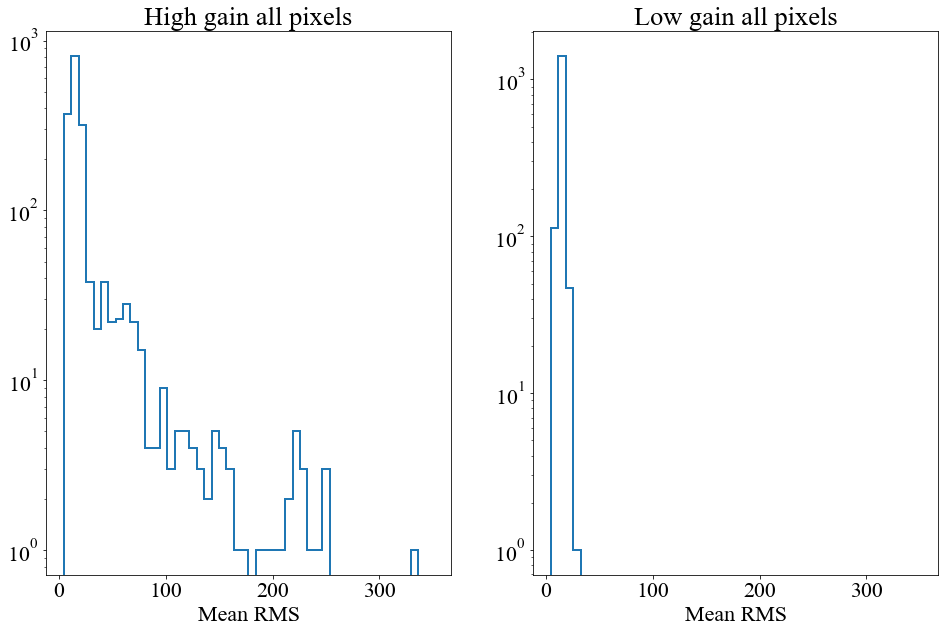

In [156]:
rms_mean_array=np.nan_to_num(rms_mean_array)
fig, ax0 = plt.subplots(1, 2)
ax0[0].hist(rms_mean_array[:, 0, :].ravel(), bins=50, range=(5, 350), histtype='step', lw=2)
ax0[0].set_xlabel("Mean RMS")
ax0[0].set_ylabel("")
ax0[0].set_yscale('log')
ax0[0].set_title("High gain all pixels")
ax0[1].hist(rms_mean_array[:, 1, :].ravel(), bins=50, range=(5, 350), histtype='step', lw=2)
ax0[1].set_xlabel("Mean RMS")
ax0[1].set_yscale('log')
ax0[1].set_title("Low gain all pixels")
plt.show()

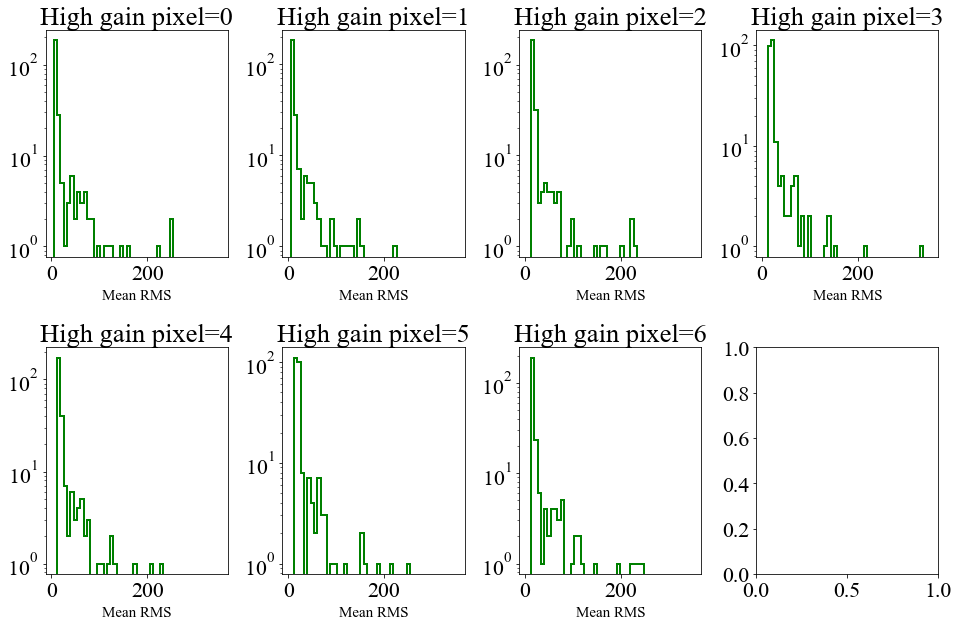

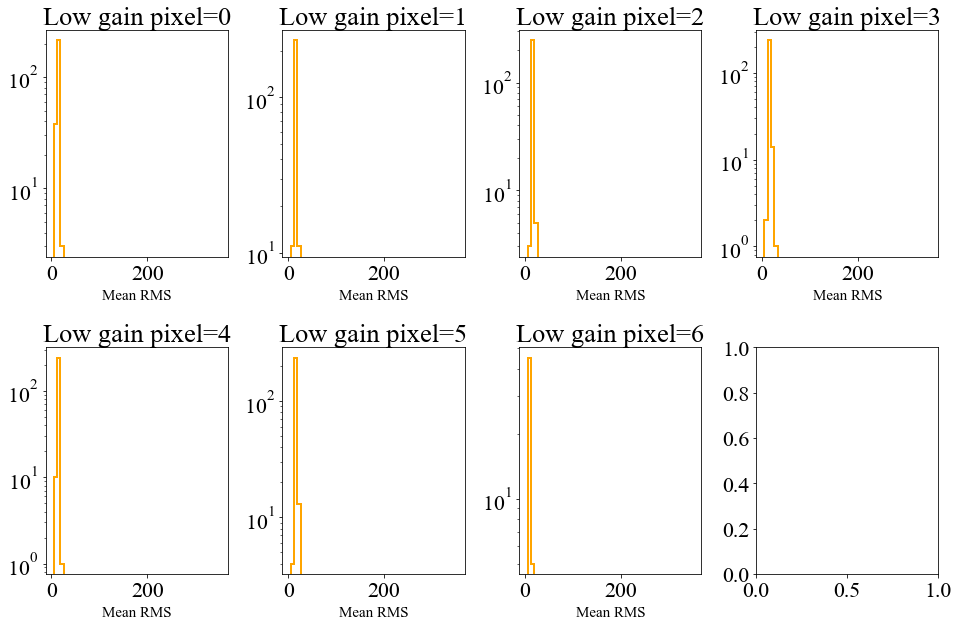

In [163]:
plt.rcParams['figure.figsize'] = (16, 10)
matplotlib.rcParams.update({'font.size': 22})

fig, ax = plt.subplots(2, 4)

for i in [0,1,2,3]:
    ax[0, i].hist(rms_mean_array[:, 0, i].ravel(), bins=50, range=(5, 350), histtype='step', color="green", lw=2)
    ax[0, i].set_yscale('log')
    ax[0, i].set_title("High gain pixel={}".format(i))
    ax[0, i].set_xlabel("Mean RMS", size=15)
for i in [0, 1, 2]:
    ax[1, i].hist(rms_mean_array[:, 0, i+4].ravel(), bins=50, range=(5, 350), histtype='step', color="green", lw=2)
    ax[1, i].set_yscale('log')
    ax[1, i].set_title("High gain pixel={}".format(i+4))
    ax[1, i].set_xlabel("Mean RMS", size=15)
plt.subplots_adjust(wspace=0.3, hspace=0.4)
plt.show()

fig, ax = plt.subplots(2,4)
for i in [0,1,2,3]:
    ax[0, i].hist(rms_mean_array[:, 1, i].ravel(), bins=50, range=(5, 350), histtype='step', color="orange", lw=2)
    ax[0, i].set_yscale('log')
    ax[0, i].set_title("Low gain pixel={}".format(i))
    ax[0, i].set_xlabel("Mean RMS", size=15)
for i in [0, 1, 2]:
    ax[1, i].hist(rms_mean_array[:, 1, i+4].ravel(), bins=50, range=(5, 350), histtype='step', color="orange", lw=2)
    ax[1, i].set_yscale('log')
    ax[1, i].set_title("Low gain pixel={}".format(i+4))
    ax[1, i].set_xlabel("Mean RMS", size=15)
plt.subplots_adjust(wspace=0.3, hspace=0.4)
plt.show()

# Looking for module where mean RMS > 50

In [146]:
print("Module where mean RMS > 50 : {}".format(np.unique(np.where(rms_mean_array[:, 0, :]>50)[0])))

Module where mean RMS > 50 : [ 79  80  81  82  95  96  97  98  99 112 113 114 115 116 129 130 131 132
 133 134 135 147 148 149 150 152 166 167 168 169 182 185]


# Box plot for all modules

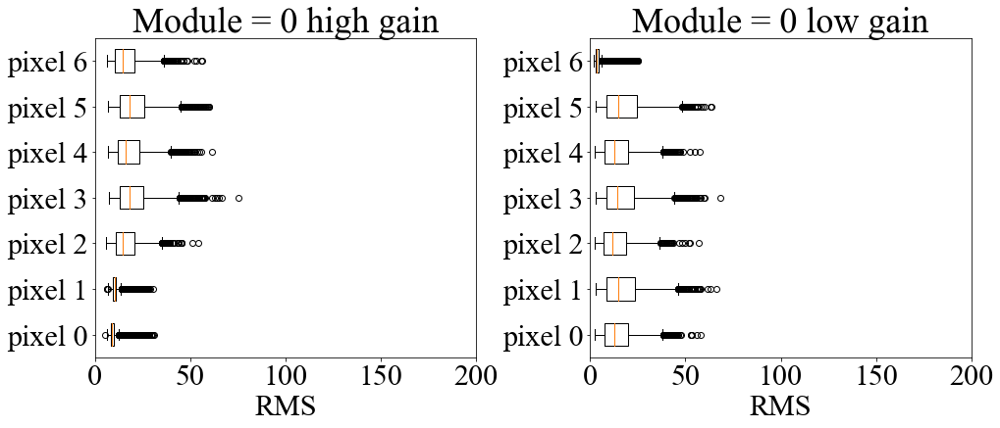

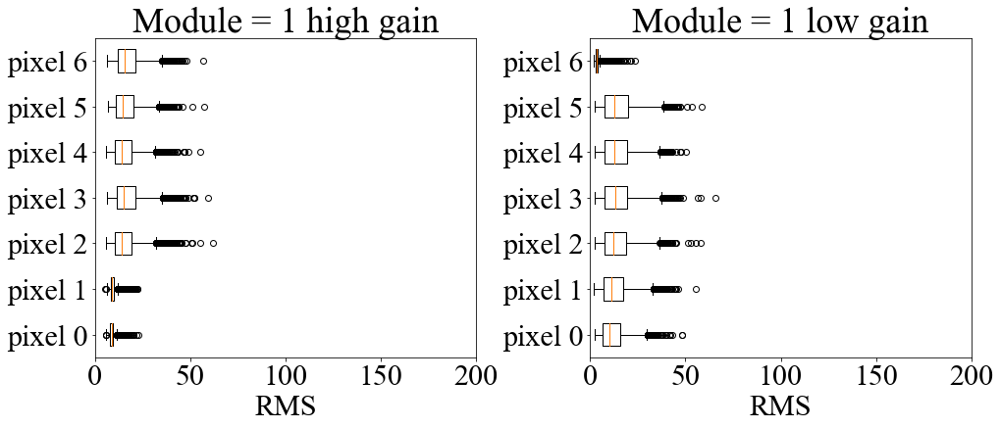

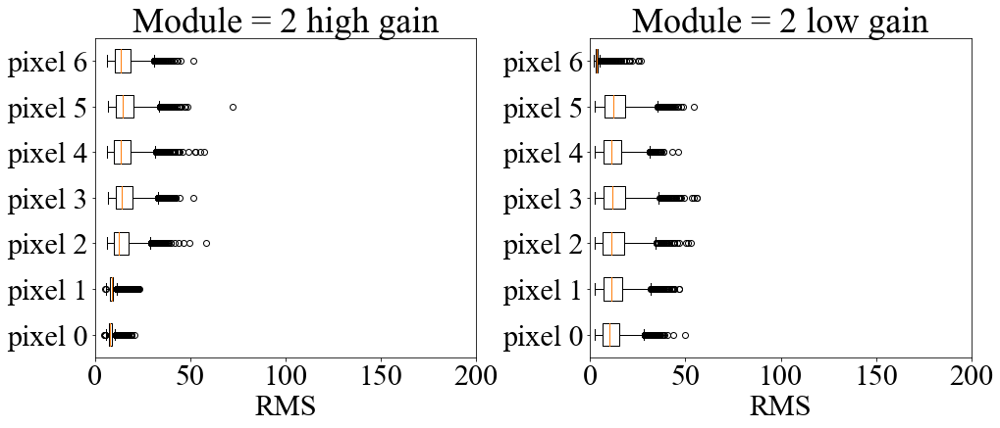

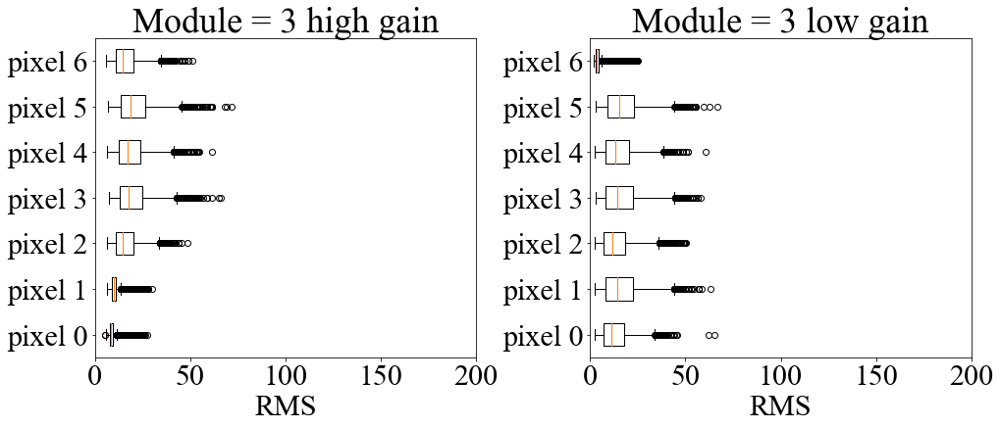

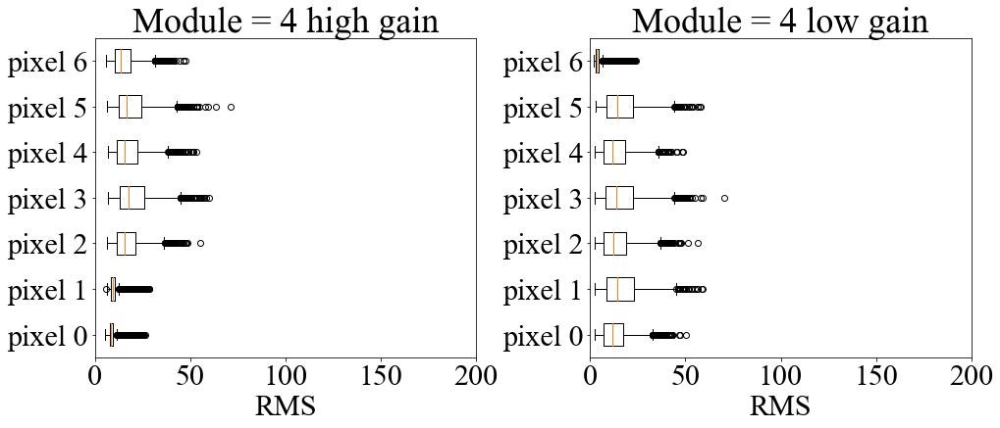

...

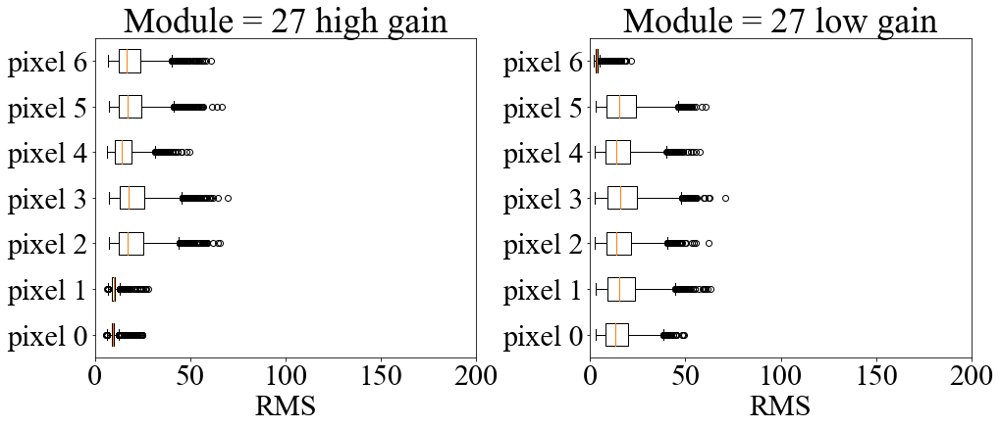

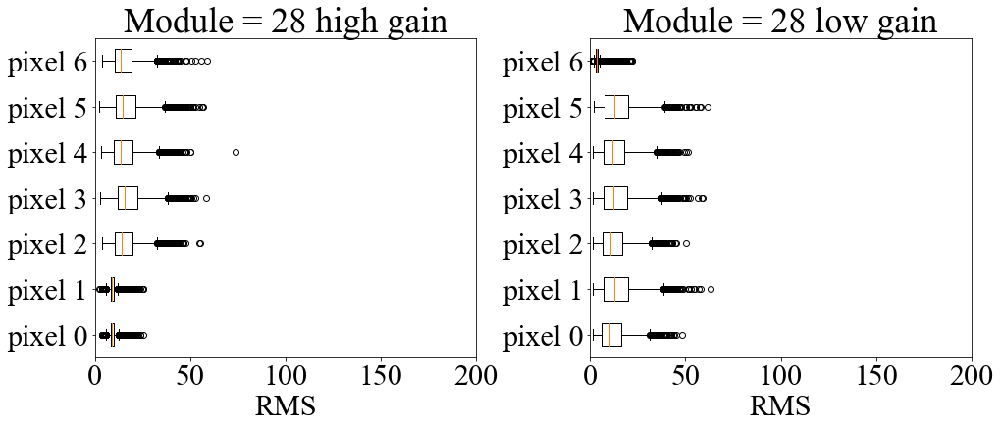

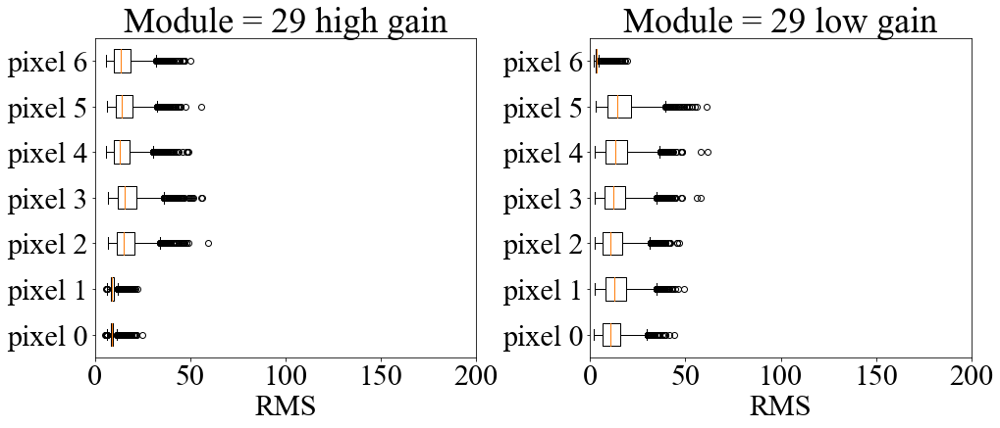

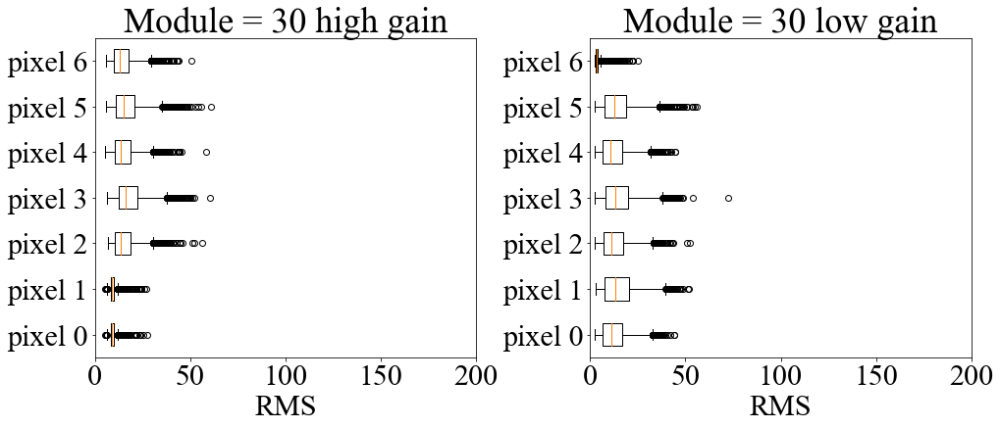

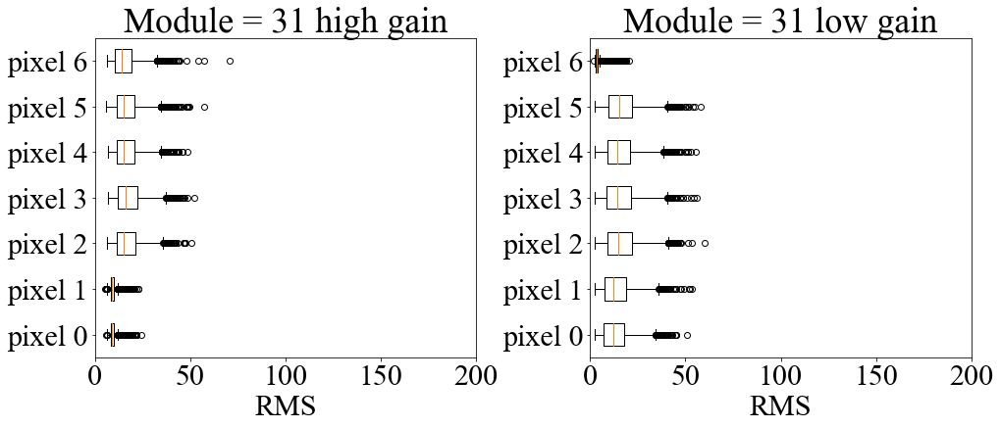

/home/pawel1/anaconda3/envs/cta-dev/lib/python3.6/site-packages/numpy/lib/function_base.py:4291: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/home/pawel1/anaconda3/envs/cta-dev/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1872: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = np.compress(x <= hival, x)
/home/pawel1/anaconda3/envs/cta-dev/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1879: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = np.compress(x >= loval, x)
/home/pawel1/anaconda3/envs/cta-dev/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1887: RuntimeWarning: invalid value encountered in less
  np.compress(x < stats['whislo'], x),
/home/pawel1/anaconda3/envs/cta-dev/lib/python3.6/site-packages/matplotlib/cbook/__init__.py:1888: RuntimeWarning: invalid value encountered in greater
  np.compress(x > stats['whishi'], x)


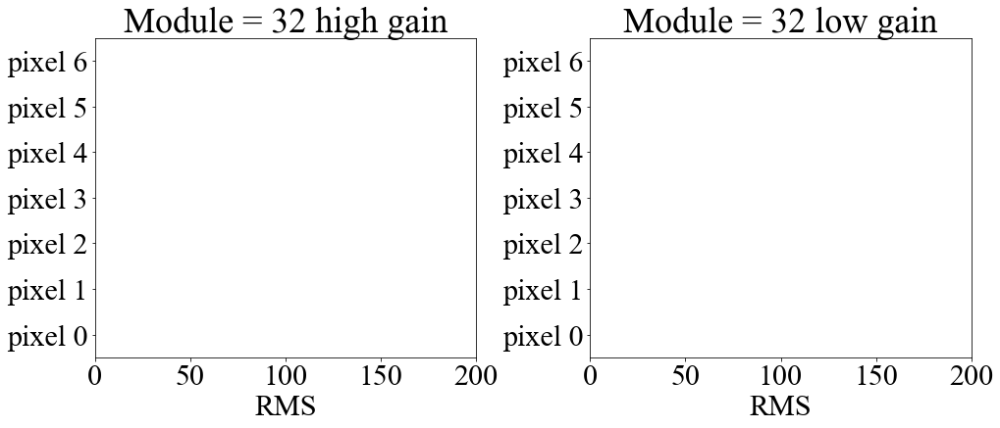

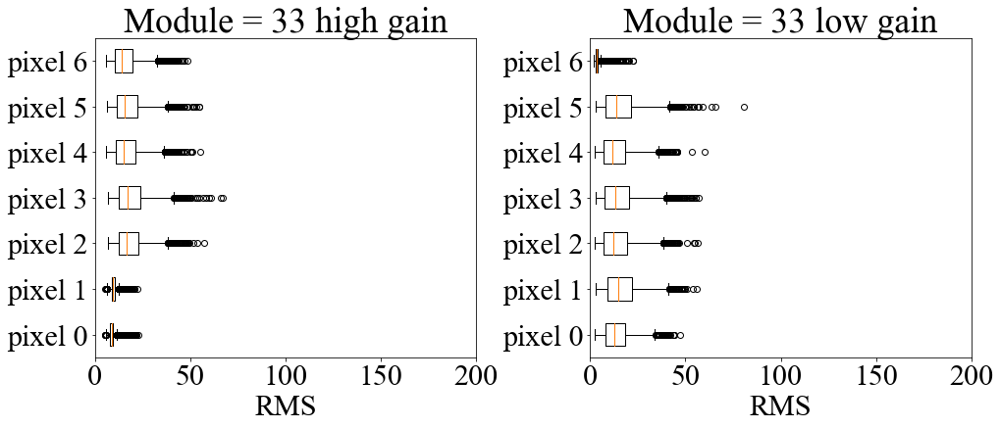

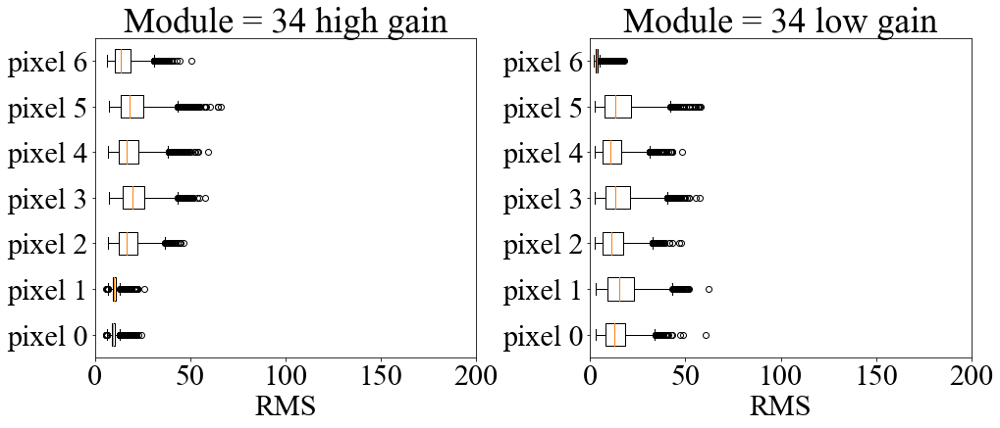

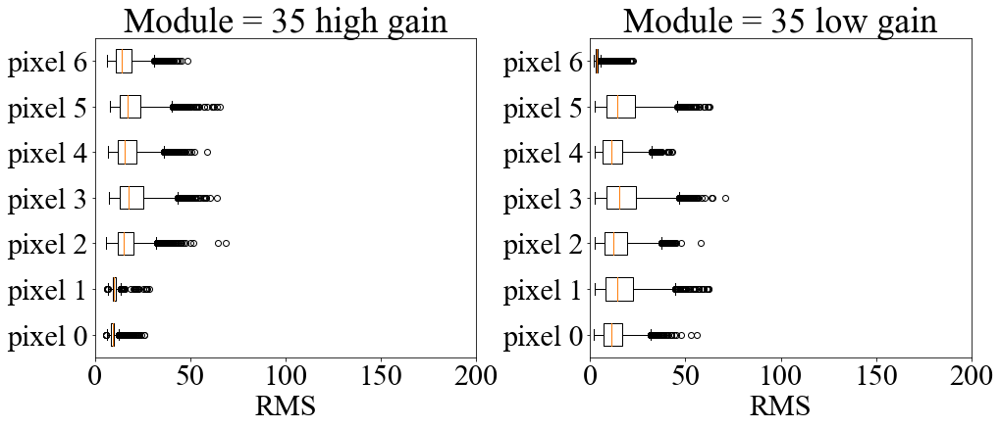

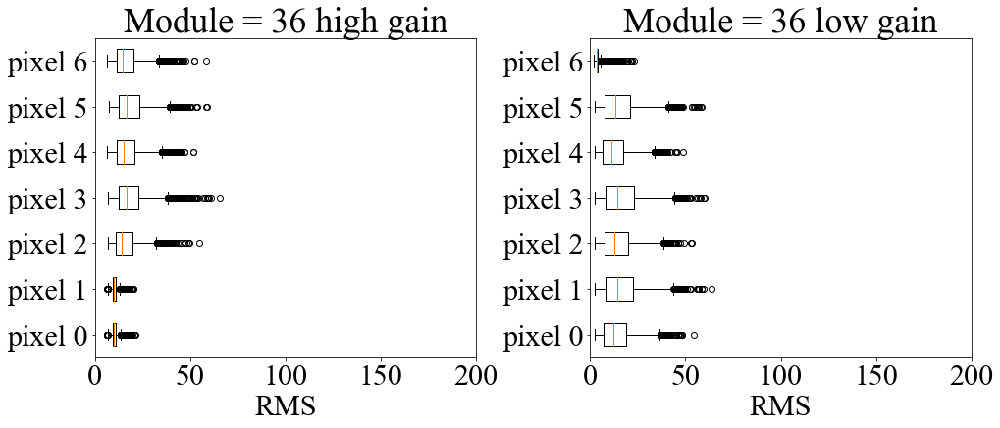

...

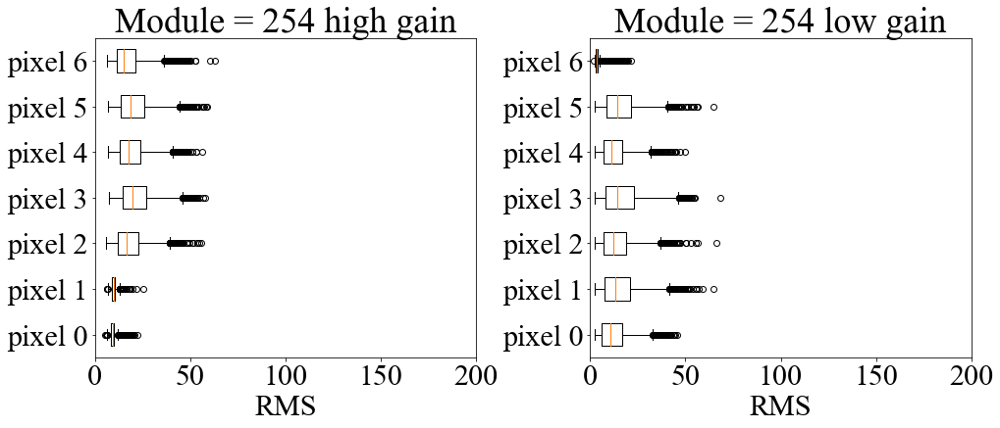

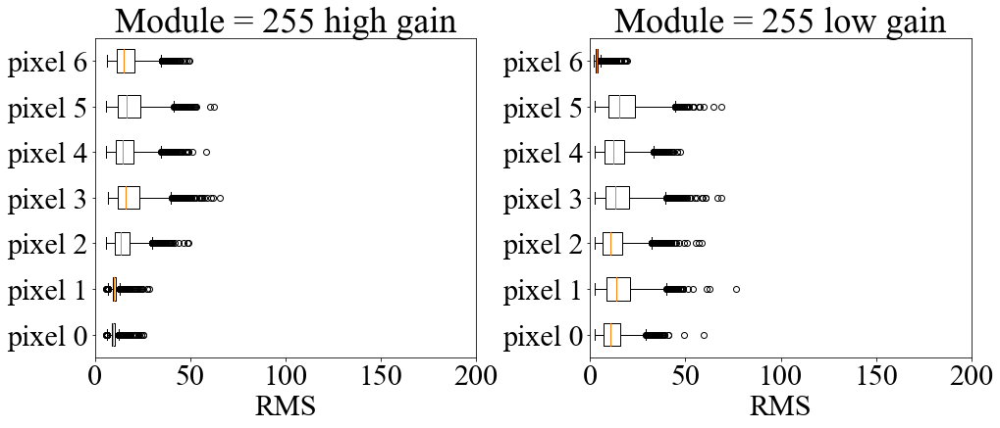

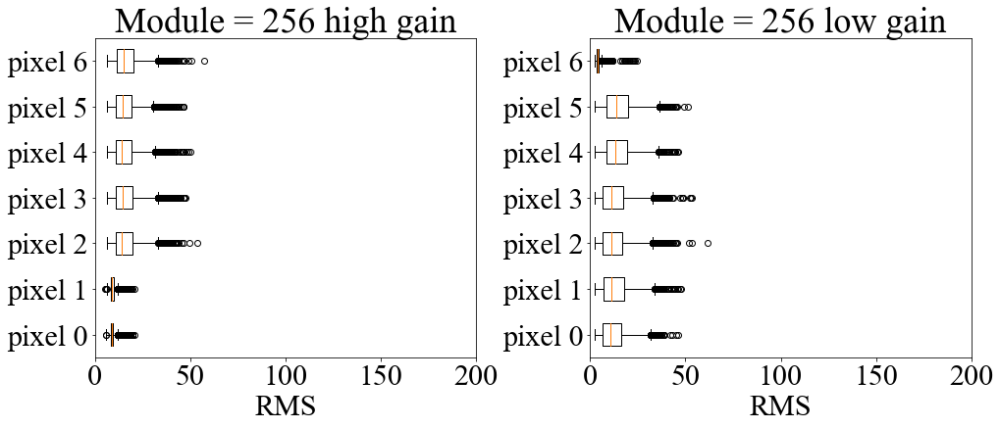

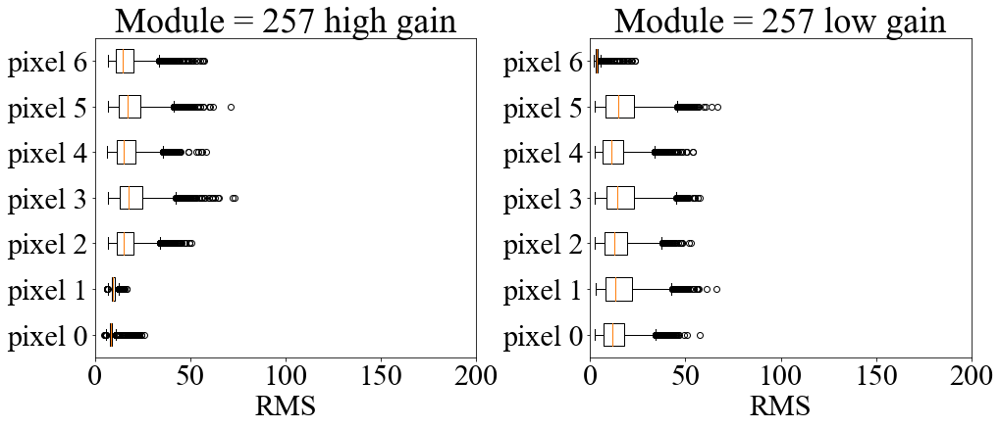

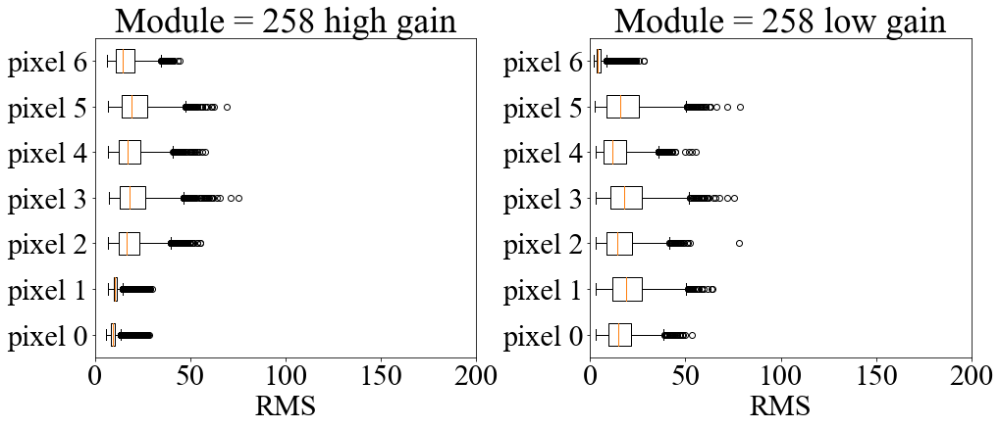

In [115]:
plt.rcParams['figure.figsize'] = (16, 6)
for nr in range(0, NR):    
    plot_box(nr)